---
# Main Program
---

In [1]:
import yfinance as yf

import pandas as pd
import numpy as np
import seaborn as sns
import datetime
import math
import time

import ipywidgets as widgets

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.pylab as pl
from matplotlib.gridspec import GridSpec
import matplotlib.gridspec as gridspec
import matplotlib.patheffects as mpe
%matplotlib inline
import mplcyberpunk as mplcp


from IPython.display import display,Image, clear_output
from sklearn.model_selection import train_test_split

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error  

#import investpy

from binance.client import Client
client = Client()

#import warnings
#warnings.simplefilter(action='ignore', category=FutureWarning)

#------------ My Functions ------------#
from Functions.Save_CSV import Save_CSV as S_CSV
from Functions.Visualization import Plots
from Functions.Preparation_Data import Preprocessing
from Functions.Extract_Data.Binance_API.Extract_Binance_Data import Binance
from Functions.Extract_Data.yFinance import yFinance
from Functions.Strategies.Feature_Engineering.FE import Feature_Engineering as FE 
from Functions.Randomized_Grid_Search import RGS_M
from Functions.Strategies.Momentum_Based_Strategies import MBS
from Functions.OHLC import OHLC_S_F
#------------ My Functions ------------#

In [2]:
from matplotlib.animation import FuncAnimation
import matplotlib.patheffects as mpe
import mplcyberpunk as mplcp

from sklearn.model_selection import train_test_split

In [3]:
lr = LinearRegression()

# Define the model
dtr = DecisionTreeRegressor()

In [4]:
#df = pd.read_csv('../Forecast_Prices/Data/Cryptocurrency/Crypto_Data.csv', index_col='Open time')
#df

,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,BNBUSDT_Open,...,BCHBUSD_Low,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,7169.12,7231.86,7151.58,7176.58,5.984141e+05,128.54,132.51,128.43,130.35,13.7159,...,202.63,203.65,0.04471,0.04548,0.04471,0.04522,1.604,1.620,1.591,1.593
2020-01-02,7177.13,7185.03,6900.00,6945.33,1.795818e+06,129.88,129.88,126.01,126.87,13.7072,...,192.41,195.44,0.04516,0.04516,0.04341,0.04343,1.594,1.597,1.528,1.530
2020-01-03,6944.41,7393.50,6853.79,7329.20,3.498114e+06,127.02,134.63,125.70,133.75,13.0104,...,192.22,221.76,0.04347,0.04557,0.04317,0.04551,1.530,1.636,1.514,1.624
2020-01-04,7330.91,7388.00,7263.55,7346.20,2.473634e+06,134.20,135.52,132.38,134.17,13.6481,...,219.37,224.18,0.04529,0.04572,0.04510,0.04550,1.620,1.641,1.601,1.640
2020-01-05,7346.20,7486.66,7315.00,7351.42,2.647992e+06,134.26,137.99,134.26,134.99,13.7978,...,221.05,222.62,0.04549,0.04605,0.04525,0.04525,1.646,1.673,1.621,1.629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-01,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,246.3000,...,96.10,96.70,0.07100,0.07270,0.07060,0.07250,1.833,1.882,1.821,1.877
2023-01-02,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,244.5000,...,95.40,99.30,0.07250,0.07440,0.07090,0.07380,1.879,1.928,1.844,1.907
2023-01-03,16667.39,16774.13,16597.71,16669.47,5.884571e+08,1213.61,1219.58,1204.32,1214.14,245.3000,...,98.70,99.70,0.07370,0.07440,0.07280,0.07350,1.906,1.910,1.861,1.890


In [5]:
#df = Feature_Engineering.Log_Return(dataframe=df, name_of_column='BTCBUSD_Open')
#df

In [6]:
df = Preprocessing.Select_Target(dataframe=df, column_name='BTCBUSD_Close')
df

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()



,Target_BTCBUSD_Close,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,BCHBUSD_Low,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,6945.33,7169.12,7231.86,7151.58,7176.58,5.984141e+05,128.54,132.51,128.43,130.35,...,202.63,203.65,0.04471,0.04548,0.04471,0.04522,1.604,1.620,1.591,1.593
2020-01-03,7329.20,7177.13,7185.03,6900.00,6945.33,1.795818e+06,129.88,129.88,126.01,126.87,...,192.41,195.44,0.04516,0.04516,0.04341,0.04343,1.594,1.597,1.528,1.530
2020-01-04,7346.20,6944.41,7393.50,6853.79,7329.20,3.498114e+06,127.02,134.63,125.70,133.75,...,192.22,221.76,0.04347,0.04557,0.04317,0.04551,1.530,1.636,1.514,1.624
2020-01-05,7351.42,7330.91,7388.00,7263.55,7346.20,2.473634e+06,134.20,135.52,132.38,134.17,...,219.37,224.18,0.04529,0.04572,0.04510,0.04550,1.620,1.641,1.601,1.640
2020-01-06,7755.10,7346.20,7486.66,7315.00,7351.42,2.647992e+06,134.26,137.99,134.26,134.99,...,221.05,222.62,0.04549,0.04605,0.04525,0.04525,1.646,1.673,1.621,1.629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-01,16610.68,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,96.50,97.10,0.07240,0.07240,0.07080,0.07110,1.833,1.850,1.828,1.831
2023-01-02,16667.55,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,96.10,96.70,0.07100,0.07270,0.07060,0.07250,1.833,1.882,1.821,1.877
2023-01-03,16669.47,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,95.40,99.30,0.07250,0.07440,0.07090,0.07380,1.879,1.928,1.844,1.907


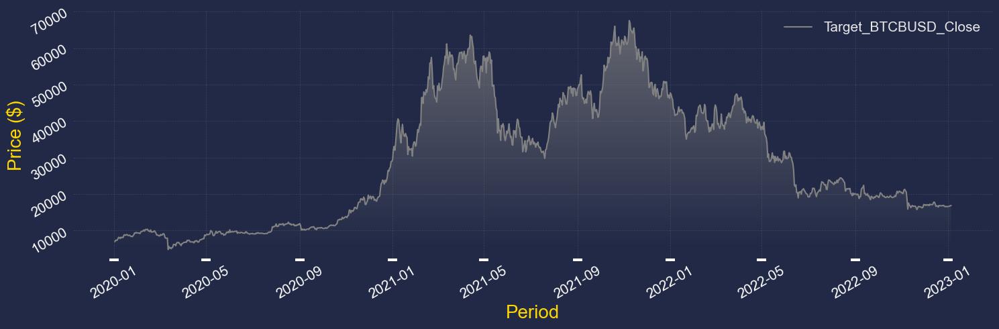

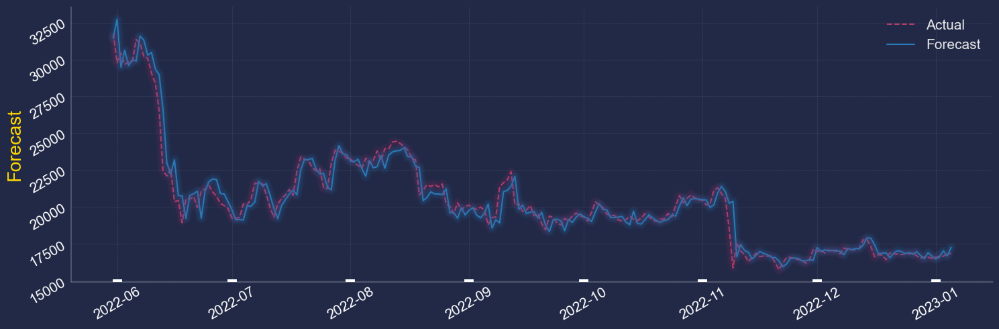

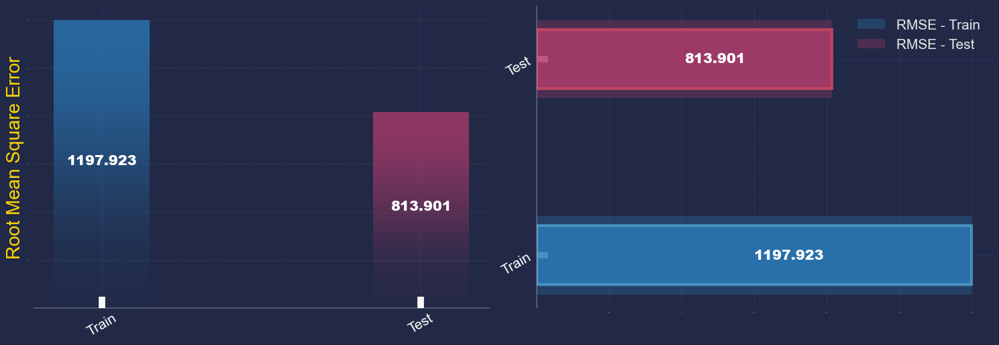

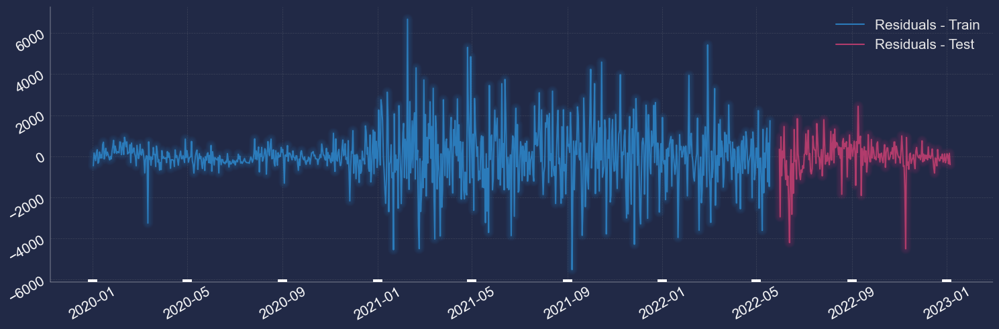

In [7]:
Plots.Plot_Of_Line(dataframe=df, column_name='Target_BTCBUSD_Close')
#Plots.Plot_Percentage(dataframe=df, column_name_1='BUSDUSDT_Volume', column_name_2='BTCBUSD_Open')
#Plots.Plot_Train_Test_Split(dataframe=df)
#Plots.Plot_Train_Test_Splits(dataframe=df)

Plots.Recursive_Forecast_Plot_Split(dataframe=df, model=lr)

#Plots.Characteristics_of_LinearRegression(model=dtr)

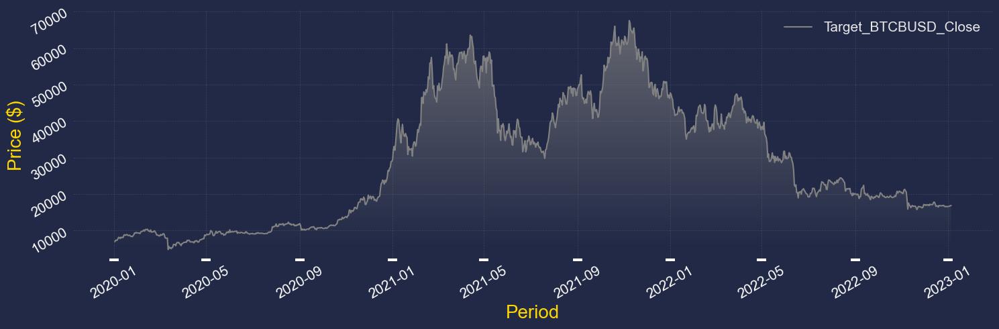

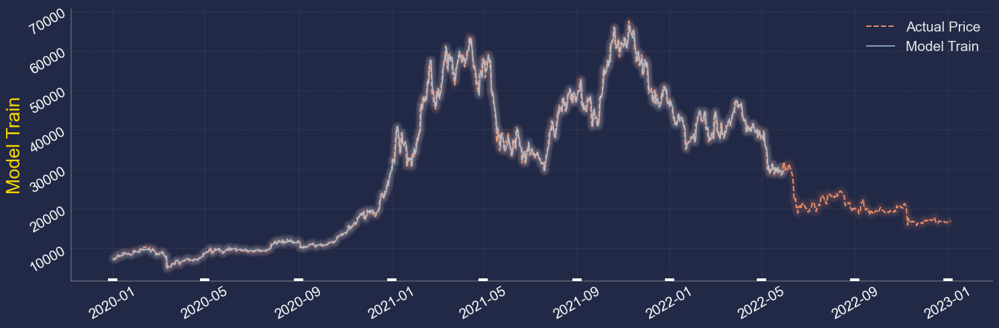

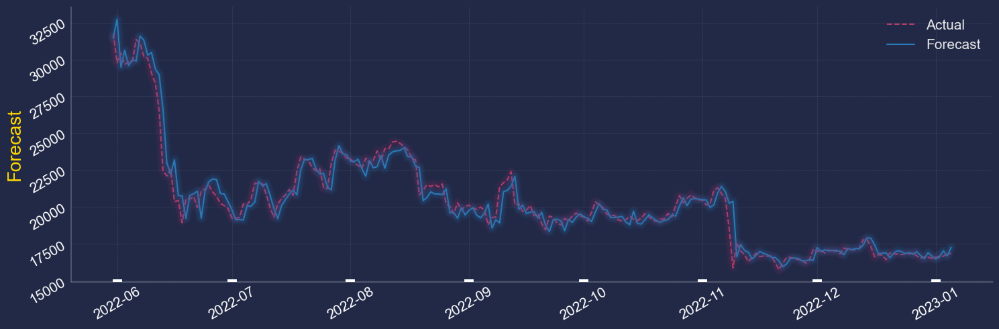

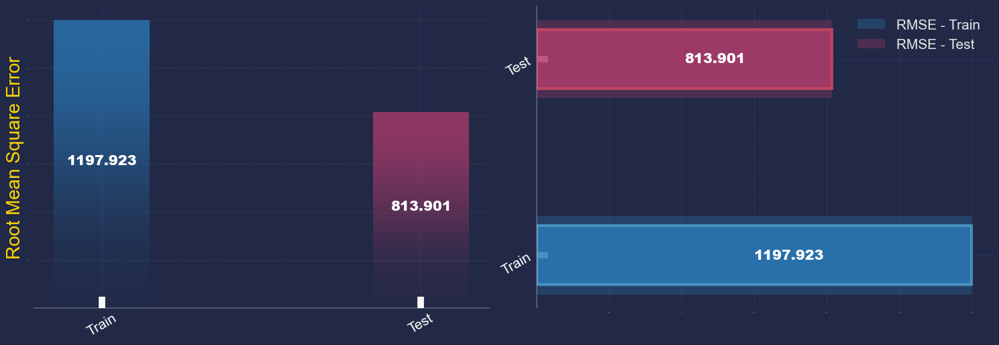

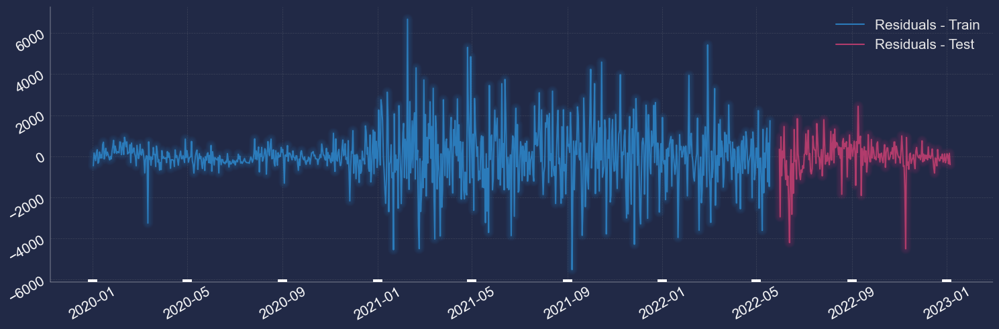

In [8]:
Plots.Plot_Of_Line(dataframe=df, column_name='Target_BTCBUSD_Close')
#Plots.Plot_Percentage(dataframe=df, column_name_1='BUSDUSDT_Volume', column_name_2='BTCBUSD_Open')
#Plots.Plot_Train_Test_Split(dataframe=df)
#Plots.Plot_Train_Test_Splits(dataframe=df)

Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=df, model=lr)

#Plots.Characteristics_of_LinearRegression(model=lr)

-------------------------
Full Length is:  1100
Length of Train is:  1070
Length of Test is:  30
-------------------------



!!!------------... Start Randomized Search CV ...------------!!!
The Random Hyparameters Tuning is:  DecisionTreeRegressor(max_depth=50, max_features='sqrt',
                      min_impurity_decrease=0.1, min_samples_leaf=5,
                      min_samples_split=20)
------------------------------------------------------------------
Train-Set Root Mean Square Error:  504.885
Test-Set Root Mean Square Error:  608.163
------------------------------------------------------------------


The Random Hyparameters Tuning is:  DecisionTreeRegressor(criterion='absolute_error', max_features='sqrt',
                      max_leaf_nodes=50, min_impurity_decrease=0.1,
                      min_samples_leaf=10, min_samples_split=5)
------------------------------------------------------------------
Train-Set Root Mean Square Error:  1802.631
Test-Set Root Mean Square Error:

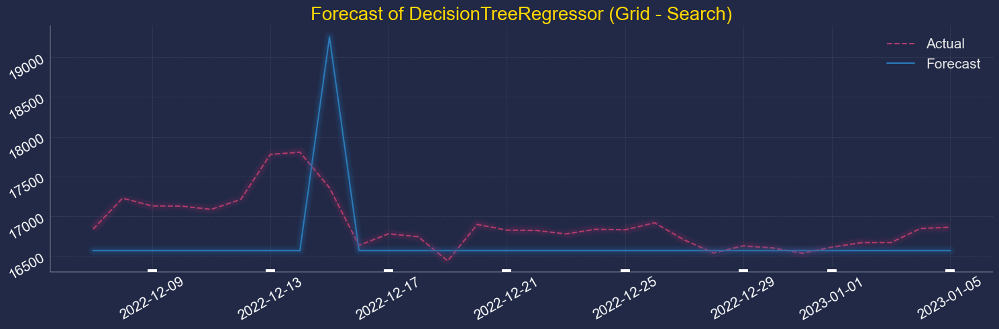

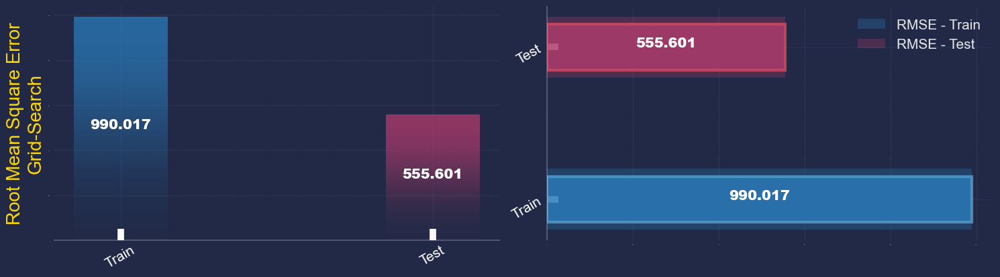

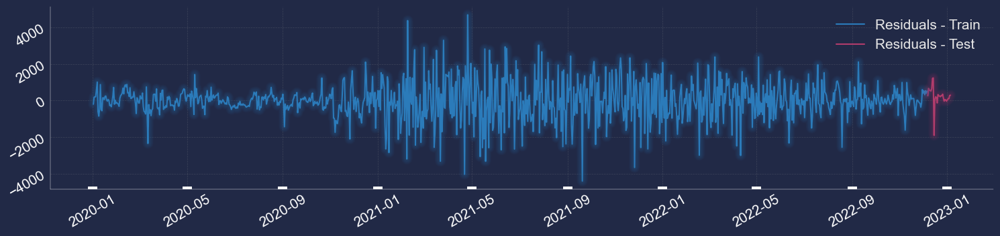

In [9]:
RGS_M.DecisionTreeRegressorModel(dataframe=df)

In [10]:
#RGS_M.Characteristics_of_DecisionTreeRegressor(model=dtr)

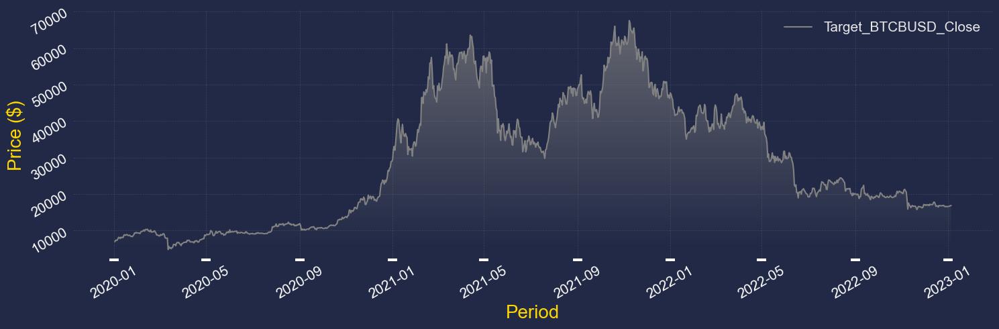

In [11]:
Plots.Plot_Of_Line(dataframe=df, column_name='Target_BTCBUSD_Close')

In [7]:
fe = FE(dataframe=df)

df = fe.Moving_Average(column_name=['Target_BTCBUSD_Close'], ma_number=7)
df = fe.Moving_Average(column_name=['Target_BTCBUSD_Close'], ma_number=30)

df = fe.Relative_Strength_Index(column_name=['Target_BTCBUSD_Close'], rsi_number=14)
#df = fe.Relative_Strength_Index(column_name=['Target_BTCBUSD_Close'], rsi_number=60)

#df = fe.Exponential_Moving_Average(column_name=['Target_BTCBUSD_Close'], ema_number=7)
#df = fe.Exponential_Moving_Average(column_name=['Target_BTCBUSD_Close'], ema_number=30)


df = fe.Exponential_Moving_Average(column_name=['Target_BTCBUSD_Close'], ema_number=5)
df = fe.Exponential_Moving_Average(column_name=['Target_BTCBUSD_Close'], ema_number=25)

df

,Target_BTCBUSD_Close,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close,Target_BTCBUSD_Close_FMA_7,Target_BTCBUSD_Close_SMA_30,Target_BTCBUSD_Close_RSI_14,Target_BTCBUSD_Close_FEMA_5,Target_BTCBUSD_Close_SEMA_25
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,6945.33,7169.12,7231.86,7151.58,7176.58,5.984141e+05,128.54,132.51,128.43,130.35,...,0.04522,1.604,1.620,1.591,1.593,NaN,NaN,NaN,6945.330000,6945.330000
2020-01-03,7329.20,7177.13,7185.03,6900.00,6945.33,1.795818e+06,129.88,129.88,126.01,126.87,...,0.04343,1.594,1.597,1.528,1.530,NaN,NaN,NaN,7073.286667,6974.858462
2020-01-04,7346.20,6944.41,7393.50,6853.79,7329.20,3.498114e+06,127.02,134.63,125.70,133.75,...,0.04551,1.530,1.636,1.514,1.624,NaN,NaN,NaN,7164.257778,7003.423195
2020-01-05,7351.42,7330.91,7388.00,7263.55,7346.20,2.473634e+06,134.20,135.52,132.38,134.17,...,0.04550,1.620,1.641,1.601,1.640,NaN,NaN,NaN,7226.645185,7030.192180
2020-01-06,7755.10,7346.20,7486.66,7315.00,7351.42,2.647992e+06,134.26,137.99,134.26,134.99,...,0.04525,1.646,1.673,1.621,1.629,NaN,NaN,NaN,7402.796790,7085.954320
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-01,16610.68,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,0.07110,1.833,1.850,1.828,1.831,16647.270000,16923.963333,46.060664,16614.448691,16827.281200
2023-01-02,16667.55,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,0.07250,1.833,1.882,1.821,1.877,16611.588571,16916.649667,58.039846,16632.149127,16814.994185
2023-01-03,16669.47,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,0.07380,1.879,1.928,1.844,1.907,16606.941429,16901.995000,38.263951,16644.589418,16803.800017


In [8]:
df = Preprocessing.Drop_Missing_Data(dataframe=df, axis_=0)
df

--- Start Drop_Missing_Data()
.
.
--- End  Drop_Missing_Data()



,Target_BTCBUSD_Close,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close,Target_BTCBUSD_Close_FMA_7,Target_BTCBUSD_Close_SMA_30,Target_BTCBUSD_Close_RSI_14,Target_BTCBUSD_Close_FEMA_5,Target_BTCBUSD_Close_SEMA_25
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-31,9336.29,9283.40,9561.24,9180.12,9499.49,9.077597e+06,173.21,186.70,170.50,184.21,...,0.06274,2.057,2.200,2.024,2.173,9043.675714,8406.011667,59.323064,9230.241531,8577.739446
2020-02-01,9377.14,9501.12,9519.42,9192.49,9336.29,8.765221e+06,184.73,185.48,174.93,179.72,...,0.06049,2.170,2.179,2.061,2.129,9194.302857,8487.072000,59.662040,9279.207687,8639.231796
2020-02-02,9321.69,9336.50,9452.23,9287.62,9377.14,9.546117e+06,179.80,184.02,179.08,183.52,...,0.06201,2.119,2.195,2.119,2.189,9297.981429,8553.488333,63.970334,9293.368458,8691.728581
2020-02-03,9284.88,9376.72,9474.47,9150.00,9321.69,1.129729e+07,183.21,193.36,179.00,188.10,...,0.06342,2.187,2.382,2.138,2.258,9354.170000,8618.111000,64.766981,9290.538972,8737.355613
2020-02-04,9169.11,9323.44,9601.17,9207.03,9284.88,1.241903e+07,188.03,195.31,186.51,189.48,...,0.06411,2.244,2.369,2.240,2.269,9324.571429,8678.700667,59.946697,9250.062648,8770.567489
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-01,16610.68,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,0.07110,1.833,1.850,1.828,1.831,16647.270000,16923.963333,46.060664,16614.448691,16827.281200
2023-01-02,16667.55,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,0.07250,1.833,1.882,1.821,1.877,16611.588571,16916.649667,58.039846,16632.149127,16814.994185
2023-01-03,16669.47,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,0.07380,1.879,1.928,1.844,1.907,16606.941429,16901.995000,38.263951,16644.589418,16803.800017


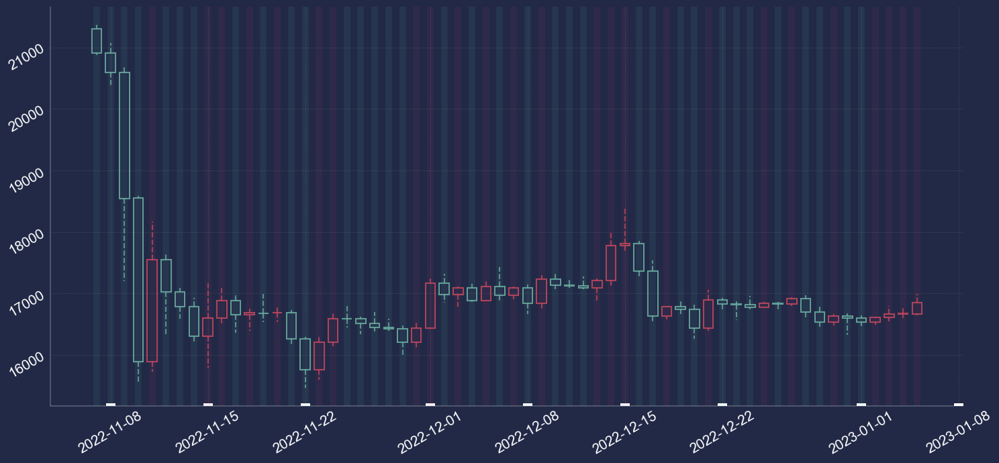

In [9]:
OHLC_S_F.OHLC_S_F(dataframe=df, col_open='BTCBUSD_Open', col_high='BTCBUSD_High', col_low='BTCBUSD_Low', col_close='BTCBUSD_Close')

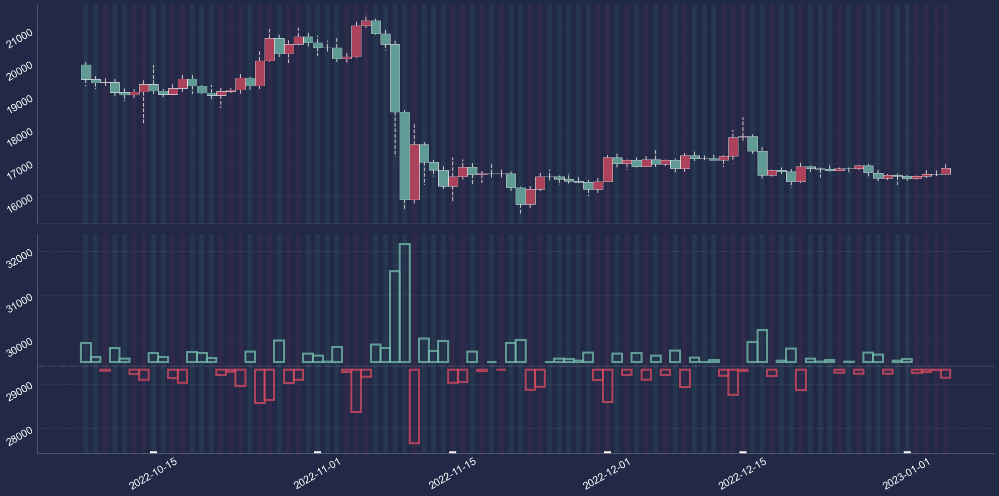

In [12]:
#OHLC_S_F.OHLC_S_F_2(dataframe=df, col_open='BTCBUSD_Open', col_high='BTCBUSD_High', col_low='BTCBUSD_Low', col_close='BTCBUSD_Close')

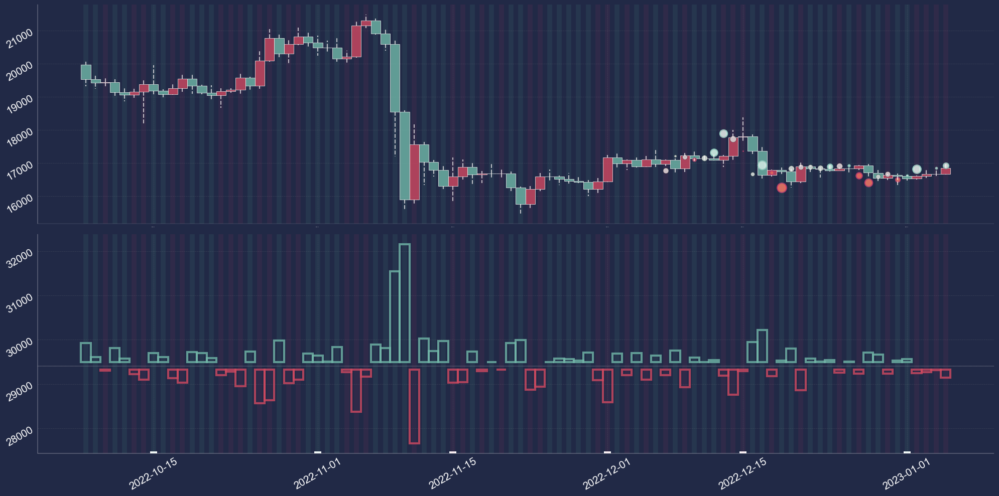

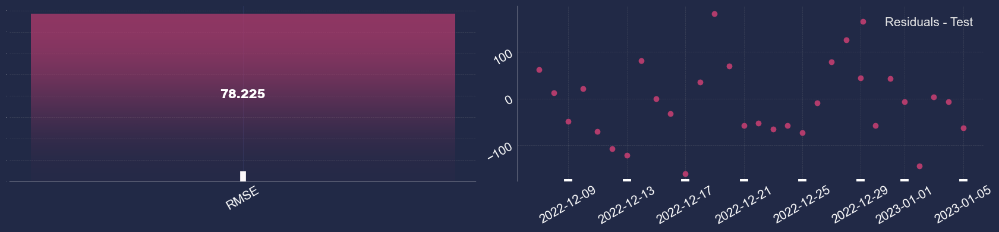

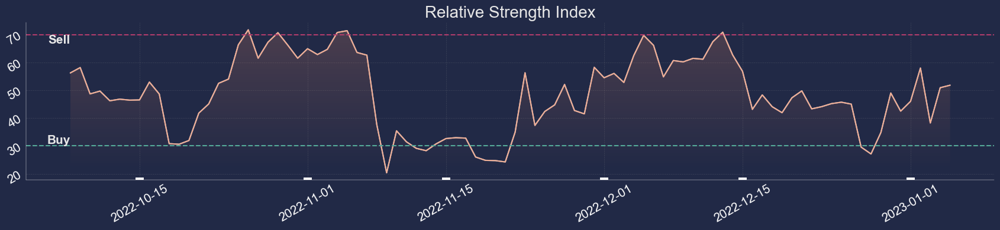

In [11]:
#OHLC_S_F.OHLC_S_F__(dataframe=df, col_open='BTCBUSD_Open', col_high='BTCBUSD_High', col_low='BTCBUSD_Low', col_close='BTCBUSD_Close')

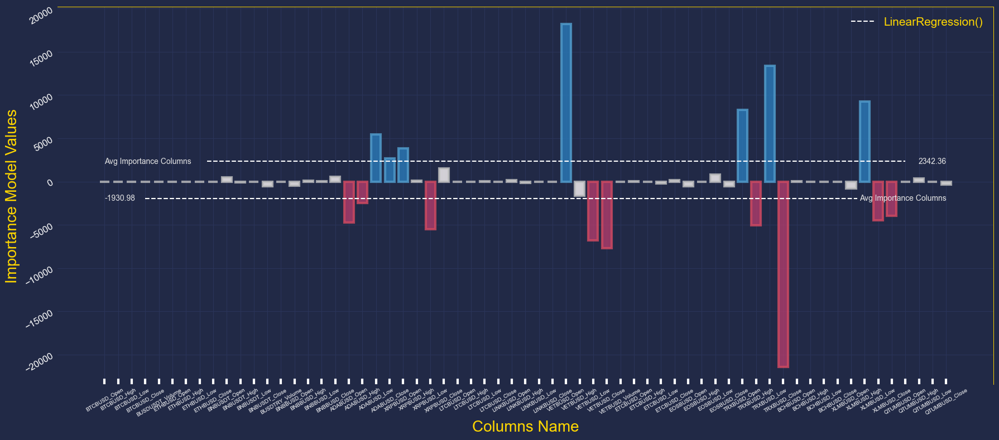

In [18]:
Characteristics_of_LinearRegression(model=lr)

In [24]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

#from sklearn.preprocessing import StandardScaler
#scaler = StandardScaler()

In [25]:
normalized_data_data = scaler.fit_transform(X)

X_data = normalized_data_data

In [26]:
df = pd.DataFrame(X_data, columns=X.columns, index=X.index)
df[Y.name] = Y
df

,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,BNBUSDT_Open,...,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close,Target_BTCBUSD_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0.037736,0.029502,0.054033,0.037817,0.000000,0.004456,0.002877,0.009237,0.004839,0.006687,...,0.078474,0.017530,0.010122,0.029468,0.018953,0.021386,0.014616,0.036125,0.021828,6945.33
2020-01-02,0.037863,0.028767,0.050006,0.034132,0.000248,0.004741,0.002323,0.008714,0.004099,0.006674,...,0.072860,0.018170,0.009701,0.027425,0.016410,0.021007,0.013953,0.033512,0.019441,7329.20
2020-01-03,0.034156,0.032041,0.049267,0.040248,0.000600,0.004133,0.003323,0.008647,0.005562,0.005629,...,0.090859,0.015767,0.010240,0.027048,0.019365,0.018580,0.015078,0.032931,0.023003,7346.20
2020-01-04,0.040313,0.031955,0.055825,0.040519,0.000388,0.005659,0.003511,0.010090,0.005651,0.006585,...,0.092514,0.018355,0.010437,0.030081,0.019351,0.021993,0.015222,0.036539,0.023609,7351.42
2020-01-05,0.040557,0.033504,0.056648,0.040602,0.000424,0.005672,0.004031,0.010496,0.005825,0.006810,...,0.091447,0.018639,0.010871,0.030317,0.018996,0.022979,0.016144,0.037369,0.023192,7755.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31,0.187991,0.177238,0.203054,0.186911,0.052530,0.232130,0.229333,0.238788,0.231326,0.354695,...,0.005608,0.056899,0.045508,0.070472,0.055724,0.030070,0.021247,0.045954,0.030847,16610.68
2023-01-01,0.186941,0.176945,0.203506,0.188119,0.048720,0.231331,0.228524,0.238602,0.232245,0.355444,...,0.005334,0.054909,0.045902,0.070158,0.057713,0.030070,0.022170,0.045664,0.032591,16667.55
2023-01-02,0.188149,0.179691,0.204322,0.189025,0.072196,0.232249,0.232736,0.239144,0.235140,0.352745,...,0.007112,0.057041,0.048137,0.070629,0.059560,0.031814,0.023496,0.046618,0.033727,16669.47


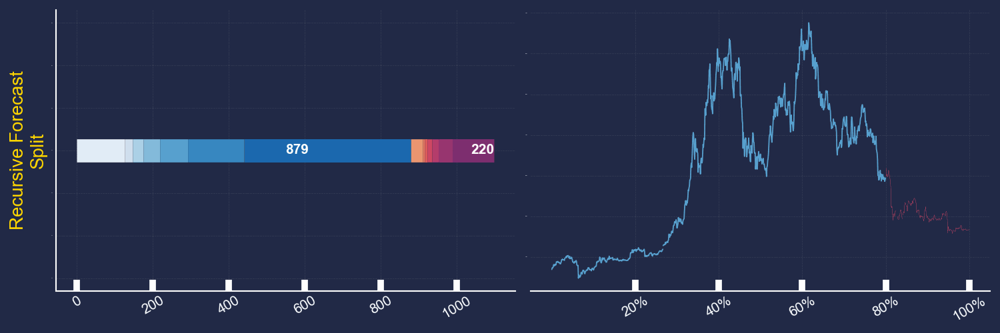

In [8]:
Image('../Forecast_Prices/Animation/plot_bars_lines.gif')

In [10]:
#Plots.Plot_Train_Test_Splits(dataframe=df)

In [12]:
#Plots.Characteristics_of_Model(model=lr)

In [19]:
class Feature_Engineering:
    '''
    This class generate new Dataframe of Feature Engineering
    '''
    
    #Constuctor
    def __init__(self, dataframe):
        '''
        Constructor of Feature_Engineering class
        ------------------------------
        Parameter(dataframe): DataFrame
        ------------------------------
        '''
        self.data = dataframe
        
#------------------------------------------------------------------------------------------------------------------------------#        
    def Log_Return(self, column_name):
        '''
        This Function of Feature_Engineering return Dataframe with Log
        ------------------------------
        Parameter(dataframe): DataFrame
        Parameter(column_name): LIST of dataframe column name
        ------------------------------
        '''
        
        try:
            for _ in range(len(column_name)):
                self.data[column_name[_]+'_Lg'] = np.log(self.data[column_name[_]] / self.data[column_name[_]].shift(1))
            return self.data
        except:
            print('No option!\nError')
#------------------------------------------------------------------------------------------------------------------------------#    
    def Moving_Average(self, column_name, ma_number):
        '''
        This Function of Feature_Engineering return Dataframe with (Slow or Fast) Moving Average
        - For short-term trading: Use shorter MAs (e.g., 5-day and 20-day).
        - For long-term investing: Use longer MAs (e.g., 50-day and 200-day).
        - Fast Moving Average (FMA): Used for short-term trends, typically with smaller periods like 9, 12, or 20.
        - Slow Moving Average (SMA): Used for long-term trends, typically with larger periods like 50, 100, or 200.
        - 1. Buy Signal Occurs when the Fast Moving Average crosses above the Slow Moving Average.
        - 2. Sell Signal Occurs when the Fast Moving Average crosses below the Slow Moving Average.
        ------------------------------
        Parameter(column_name): LIST of dataframe column name
        Parameter(ma_number): Number of Moving Average (Slow - Fast)
        ------------------------------
        '''
        
        try:
            for _ in range(len(column_name)):
                if (ma_number >=5 and ma_number <= 20):
                    self.data[column_name[_]+'_FMA_'+str(ma_number)] = self.data[column_name[_]].rolling(window = ma_number).mean()
                elif (ma_number >=25 and ma_number <= 200):
                    self.data[column_name[_]+'_SMA_'+str(ma_number)] = self.data[column_name[_]].rolling(window = ma_number).mean()
            return self.data
        except:
            print('No option!\nError')
#------------------------------------------------------------------------------------------------------------------------------#
    def Exponential_Moving_Average(self, column_name, ema_number):
        '''
        This Function of Feature_Engineering return Dataframe with Exponential Moving Average
        - Short-term (Fast EMA): Use 5, 7, 10, or 20 periods.
        - Medium-term: Use 50 periods.
        - Long-term (Slow EMA): Use 100 or 200 periods.
        (Use the Same Periods of Slow/Fast Moving Average (or little slow))
        ------------------------------
        Parameter(name_of_column): LIST of dataframe column name
        Parameter(ema_number): Number of EMA
        ------------------------------
        '''
        
        try:
            for _ in range(len(column_name)):
                if (ema_number >=5 and ema_number <= 20):
                    self.data[column_name[_]+'_FEMA_'+str(ema_number)] = self.data[column_name[_]].ewm(span=ema_number, adjust=False).mean()
                elif (ema_number >=25 and ema_number <= 200):
                    self.data[column_name[_]+'_SEMA_'+str(ema_number)] = self.data[column_name[_]].ewm(span=ema_number, adjust=False).mean()
            return self.data
        except:
            print('No option!\nError')
#------------------------------------------------------------------------------------------------------------------------------#    
    def Rolling_Standar_Diviation(self, column_name, rsd_number):
        '''
        This Function of Feature_Engineering return Dataframe with Rolling Standar Diviation
        - Short-Term Trends Rolling Window Size: 10–20 periods
        - Long-Term Trends Rolling Window Size: 100–200 periods
        ------------------------------
        Parameter(column_name): LIST of dataframe column name
        Parameter(rsd_number): Number of Rolling Standar Diviation
        ------------------------------
        '''
        
        try:
            for _ in range(len(column_name)):
                self.data[column_name[_]+'_RSD_'+str(rsd_number)] = self.data[column_name[_]].rolling(rsd_number).std()
            return self.data
        except:
            print('No option!\nError')
#-------------------------------------------------- Momentum-Based Strategies -------------------------------------------------#    
    def Relative_Strength_Index(self, column_name, rsi_number):
        '''
        This Function of Feature_Engineering return Dataframe with Rolling Standar Index
        - Buy: RSI < 10 & z = 1
        - Sell: RSI > 60 & z = 0
        - rsi_number Shorter Periods 7 or 9 or 14
        - rsi_number Longer Periods 21
        
        - Overbought: RSI > 70 indicates the asset may be overbought and could be due for a pullback.
        - Oversold: RSI < 30 suggests the asset might be oversold and could be due for a rebound.
        
        - RSI > 50 suggests bullish momentum.
        - RSI < 50 suggests bearish momentum.
        ------------------------------
        Parameter(column_name): LIST of dataframe column name
        Parameter(rsi_number): Number of Rolling Standar Index
        ------------------------------
        '''
        try:         
            if len(column_name) == 1 and (rsi_number > 0):
                for _ in range(len(column_name)):
                    delta = self.data[column_name[_]].diff()
                    gain = (delta.where(delta > 0, 0)).rolling(window=rsi_number).mean()
                    loss = (-delta.where(delta < 0, 0)).rolling(window=rsi_number).mean()
                    rs = gain / loss
                    self.data[column_name[_]+'_RSI_'+str(rsi_number)] = 100 - (100 / (1 + rs))
                return self.data
            elif len(column_name) > 1 and (rsi_number > 0):
                for _ in range(len(column_name)):
                    delta = self.data[column_name[_]].diff()
                    gain = (delta.where(delta > 0, 0)).rolling(window=rsi_number).mean()
                    loss = (-delta.where(delta < 0, 0)).rolling(window=rsi_number).mean()
                    rs = gain / loss
                    self.data[column_name[_]+'_RSI_'+str(rsi_number)] = 100 - (100 / (1 + rs))
                return self.data
        except:
            print('No option!\nError')
#-------------------------------------------------------------------------------------------------------------------------------


In [20]:
df

,EURUSD_Open,EURUSD_High,EURUSD_Low,EURUSD_Close,USDJPY_Open,USDJPY_High,USDJPY_Low,USDJPY_Close,GBPUSD_Open,GBPUSD_High,...,USDTRY_Low,USDTRY_Close,EURTRY_Open,EURTRY_High,EURTRY_Low,EURTRY_Close,USDZAR_Open,USDZAR_High,USDZAR_Low,USDZAR_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,1.122083,1.122838,1.115947,1.122083,108.680000,111.410004,108.629997,108.681000,1.325400,1.327100,...,5.946800,5.947800,6.669500,6.669500,6.669500,6.669500,13.995900,13.999200,13.521200,13.995900
2020-01-02,1.121894,1.122712,1.116682,1.122083,108.713997,108.860001,108.221001,108.712997,1.325047,1.326788,...,5.943050,5.946300,6.668960,6.680970,6.648880,6.672890,13.995100,14.131400,13.919300,14.002920
2020-01-03,1.117081,1.118068,1.112570,1.117144,108.540001,108.551003,107.915001,108.542999,1.314389,1.316119,...,5.952000,5.955700,6.652720,6.677280,6.647900,6.650380,14.088600,14.365000,14.073000,14.078000
2020-01-06,1.116246,1.120825,1.115810,1.116196,107.999001,108.410004,107.921997,107.963997,1.308130,1.317400,...,5.963990,5.967960,6.661630,6.695670,6.660600,6.661340,14.320500,14.366400,14.200100,14.318250
2020-01-07,1.119583,1.119946,1.113487,1.119799,108.411003,108.616997,108.261002,108.405998,1.317193,1.321213,...,5.950790,5.969000,6.680020,6.683400,6.648020,6.682100,14.201800,14.337700,14.125900,14.202700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-31,1.040615,1.042427,1.034854,1.040615,156.994995,157.410004,156.042999,156.994995,1.254900,1.256818,...,35.264751,35.305248,36.733051,36.855999,36.595032,36.733101,18.764900,18.898979,18.696100,18.764900
2025-01-02,1.035186,1.037560,1.023185,1.035186,157.718994,157.764999,156.449005,157.718994,1.252100,1.254076,...,35.232899,35.374001,36.608330,36.749409,36.138821,36.603279,18.809299,18.864901,18.659800,18.820150
2025-01-03,1.026821,1.030535,1.026546,1.026821,157.362000,157.481003,157.028000,157.362000,1.238022,1.241989,...,35.321800,35.392200,36.333649,36.463989,36.320480,36.331779,18.739599,18.811800,18.672400,18.739599


In [18]:
for _ in range(len(df.columns)):
    print(_, ': ', df.columns[_])

0 :  EURUSD_Open
1 :  EURUSD_High
2 :  EURUSD_Low
3 :  EURUSD_Close
4 :  USDJPY_Open
5 :  USDJPY_High
6 :  USDJPY_Low
7 :  USDJPY_Close
8 :  GBPUSD_Open
9 :  GBPUSD_High
10 :  GBPUSD_Low
11 :  GBPUSD_Close
12 :  AUDUSD_Open
13 :  AUDUSD_High
14 :  AUDUSD_Low
15 :  AUDUSD_Close
16 :  USDCHF_Open
17 :  USDCHF_High
18 :  USDCHF_Low
19 :  USDCHF_Close
20 :  USDCAD_Open
21 :  USDCAD_High
22 :  USDCAD_Low
23 :  USDCAD_Close
24 :  NZDUSD_Open
25 :  NZDUSD_High
26 :  NZDUSD_Low
27 :  NZDUSD_Close
28 :  EURGBP_Open
29 :  EURGBP_High
30 :  EURGBP_Low
31 :  EURGBP_Close
32 :  EURJPY_Open
33 :  EURJPY_High
34 :  EURJPY_Low
35 :  EURJPY_Close
36 :  GBPJPY_Open
37 :  GBPJPY_High
38 :  GBPJPY_Low
39 :  GBPJPY_Close
40 :  AUDJPY_Open
41 :  AUDJPY_High
42 :  AUDJPY_Low
43 :  AUDJPY_Close
44 :  EURAUD_Open
45 :  EURAUD_High
46 :  EURAUD_Low
47 :  EURAUD_Close
48 :  CHFJPY_Open
49 :  CHFJPY_High
50 :  CHFJPY_Low
51 :  CHFJPY_Close
52 :  USDSEK_Open
53 :  USDSEK_High
54 :  USDSEK_Low
55 :  USDSEK_Close
56

### Feature Engineering

In [150]:
class Feature_Engineering:
    '''
    This class generate new Dataframe of Feature Engineering
    '''
    
    #Constuctor
    def __init__(self, dataframe):
        '''
        Constructor of Feature_Engineering class
        ------------------------------
        Parameter(dataframe): DataFrame
        ------------------------------
        '''
        self.data = dataframe
        

        
    def Exponential_Moving_Average(self, column_name, ema_number):
        '''
        This Function of Feature_Engineering return Dataframe with Exponential Moving Average
        - Short-term (Fast EMA): Use 5, 7, 10, or 20 periods.
        - Medium-term: Use 50 periods.
        - Long-term (Slow EMA): Use 100 or 200 periods.
        (Use the Same Periods of Slow/Fast Moving Average (or little slow))
        ------------------------------
        Parameter(name_of_column): LIST of dataframe column name
        Parameter(ema_number): Number of EMA
        ------------------------------
        '''
        
        try:
            for _ in range(len(column_name)):
                if (ema_number >=5 and ema_number <= 20):
                    self.data[column_name[_]+'_FEMA_'+str(ema_number)] = self.data[column_name[_]].ewm(span=ema_number, adjust=False).mean()
                elif (ema_number >=25 and ema_number <= 200):
                    self.data[column_name[_]+'_SEMA_'+str(ema_number)] = self.data[column_name[_]].ewm(span=ema_number, adjust=False).mean()
            return self.data
        except:
            print('No option!\nError')
#------------------------------------------------------------------------------------------------------------------------------#
    def Exponential_Moving_Average_All(self, ema_number):
        '''
        This Function of Feature_Engineering returns a DataFrame with Exponential Moving Averages.
        - Short-term (Fast EMA): Use 5, 7, 10, or 20 periods.
        - Medium-term: Use 50 periods.
        - Long-term (Slow EMA): Use 100 or 200 periods.
        (Use the same periods as Slow/Fast Moving Averages or slightly slower.)
        ------------------------------
        Parameter(ema_number): Number of periods for EMA calculation (int, between 5 and 200)
        ------------------------------
        '''
    
        try:
            # Validate ema_number
            if not (5 <= ema_number <= 200):
                raise ValueError("ema_number must be between 5 and 200.")
        
            # Create a dictionary for the new EMA columns
            new_columns = {}
        
            # Iterate over the DataFrame columns
            for col in self.data.columns:
                if not any(keyword in col for keyword in ['_FMA_', '_SMA_', '_FEMA_', '_SEMA_', '_RSD_', '_RSI_']):
                    if ema_number <= 20:
                        new_col_name = f"{col}_FEMA_{ema_number}"
                    else:
                        new_col_name = f"{col}_SEMA_{ema_number}"
                
                    # Calculate EMA and add to the dictionary
                    new_columns[new_col_name] = self.data[col].ewm(span=ema_number, adjust=False).mean()
        
            # Add all new EMA columns to the DataFrame at once
            self.data = pd.concat([self.data, pd.DataFrame(new_columns, index=self.data.index)], axis=1)
            return self.data
    
        except:
            print('No option!\nError')

            
        

In [151]:
fe = Feature_Engineering(dataframe=df_forex)

In [152]:
df_forex = fe.Exponential_Moving_Average(column_name=['EURUSD_Open'], ema_number=15)

#df_forex = fe.Exponential_Moving_Average_All(ema_number=10)
#df_forex = fe.Exponential_Moving_Average_All(ema_number=30)
df_forex

,EURUSD_Open,EURUSD_High,EURUSD_Low,EURUSD_Close,USDJPY_Open,USDJPY_High,USDJPY_Low,USDJPY_Close,GBPUSD_Open,GBPUSD_High,...,USDTRY_Close,EURTRY_Open,EURTRY_High,EURTRY_Low,EURTRY_Close,USDZAR_Open,USDZAR_High,USDZAR_Low,USDZAR_Close,EURUSD_Open_FEMA_15
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,1.122083,1.122838,1.115947,1.122083,108.680000,111.410004,108.629997,108.681000,1.325400,1.327100,...,5.947800,6.669500,6.669500,6.669500,6.669500,13.995900,13.999200,13.521200,13.995900,1.122083
2020-01-02,1.121894,1.122712,1.116682,1.122083,108.713997,108.860001,108.221001,108.712997,1.325047,1.326788,...,5.946300,6.668960,6.680970,6.648880,6.672890,13.995100,14.131400,13.919300,14.002920,1.122059
2020-01-03,1.117081,1.118068,1.112570,1.117144,108.540001,108.551003,107.915001,108.542999,1.314389,1.316119,...,5.955700,6.652720,6.677280,6.647900,6.650380,14.088600,14.365000,14.073000,14.078000,1.121437
2020-01-06,1.116246,1.120825,1.115810,1.116196,107.999001,108.410004,107.921997,107.963997,1.308130,1.317400,...,5.967960,6.661630,6.695670,6.660600,6.661340,14.320500,14.366400,14.200100,14.318250,1.120788
2020-01-07,1.119583,1.119946,1.113487,1.119799,108.411003,108.616997,108.261002,108.405998,1.317193,1.321213,...,5.969000,6.680020,6.683400,6.648020,6.682100,14.201800,14.337700,14.125900,14.202700,1.120637
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-31,1.040615,1.042427,1.034854,1.040615,156.994995,157.410004,156.042999,156.994995,1.254900,1.256818,...,35.305248,36.733051,36.855999,36.595032,36.733101,18.764900,18.898979,18.696100,18.764900,1.044345
2025-01-02,1.035186,1.037560,1.023185,1.035186,157.718994,157.764999,156.449005,157.718994,1.252100,1.254076,...,35.374001,36.608330,36.749409,36.138821,36.603279,18.809299,18.864901,18.659800,18.820150,1.043200
2025-01-03,1.026821,1.030535,1.026546,1.026821,157.362000,157.481003,157.028000,157.362000,1.238022,1.241989,...,35.392200,36.333649,36.463989,36.320480,36.331779,18.739599,18.811800,18.672400,18.739599,1.041153


In [147]:
df_forex

,EURUSD_Open,EURUSD_High,EURUSD_Low,EURUSD_Close,USDJPY_Open,USDJPY_High,USDJPY_Low,USDJPY_Close,GBPUSD_Open,GBPUSD_High,...,USDTRY_Low,USDTRY_Close,EURTRY_Open,EURTRY_High,EURTRY_Low,EURTRY_Close,USDZAR_Open,USDZAR_High,USDZAR_Low,USDZAR_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,1.122083,1.122838,1.115947,1.122083,108.680000,111.410004,108.629997,108.681000,1.325400,1.327100,...,5.946800,5.947800,6.669500,6.669500,6.669500,6.669500,13.995900,13.999200,13.521200,13.995900
2020-01-02,1.121894,1.122712,1.116682,1.122083,108.713997,108.860001,108.221001,108.712997,1.325047,1.326788,...,5.943050,5.946300,6.668960,6.680970,6.648880,6.672890,13.995100,14.131400,13.919300,14.002920
2020-01-03,1.117081,1.118068,1.112570,1.117144,108.540001,108.551003,107.915001,108.542999,1.314389,1.316119,...,5.952000,5.955700,6.652720,6.677280,6.647900,6.650380,14.088600,14.365000,14.073000,14.078000
2020-01-06,1.116246,1.120825,1.115810,1.116196,107.999001,108.410004,107.921997,107.963997,1.308130,1.317400,...,5.963990,5.967960,6.661630,6.695670,6.660600,6.661340,14.320500,14.366400,14.200100,14.318250
2020-01-07,1.119583,1.119946,1.113487,1.119799,108.411003,108.616997,108.261002,108.405998,1.317193,1.321213,...,5.950790,5.969000,6.680020,6.683400,6.648020,6.682100,14.201800,14.337700,14.125900,14.202700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-31,1.040615,1.042427,1.034854,1.040615,156.994995,157.410004,156.042999,156.994995,1.254900,1.256818,...,35.264751,35.305248,36.733051,36.855999,36.595032,36.733101,18.764900,18.898979,18.696100,18.764900
2025-01-02,1.035186,1.037560,1.023185,1.035186,157.718994,157.764999,156.449005,157.718994,1.252100,1.254076,...,35.232899,35.374001,36.608330,36.749409,36.138821,36.603279,18.809299,18.864901,18.659800,18.820150
2025-01-03,1.026821,1.030535,1.026546,1.026821,157.362000,157.481003,157.028000,157.362000,1.238022,1.241989,...,35.321800,35.392200,36.333649,36.463989,36.320480,36.331779,18.739599,18.811800,18.672400,18.739599


In [23]:
df_forex['USDNOK_Close']

Open time
2020-02-11     9.28562
2020-02-12     9.24289
2020-02-13     9.23915
2020-02-14     9.25130
2020-02-17     9.23970
                ...   
2024-12-31    11.32762
2025-01-02    11.38704
2025-01-03    11.38218
2025-01-06    11.35305
2025-01-07    11.29770
Name: USDNOK_Close, Length: 1280, dtype: float64

In [86]:
Target_Forex_EURUSD_Close

,Target_EURUSD_Close,EURUSD_Open,EURUSD_High,EURUSD_Low,EURUSD_Close,USDJPY_Open,USDJPY_High,USDJPY_Low,USDJPY_Close,GBPUSD_Open,...,USDTRY_Close_SMA_50,EURTRY_Open_SMA_50,EURTRY_High_SMA_50,EURTRY_Low_SMA_50,EURTRY_Close_SMA_50,USDZAR_Open_SMA_50,USDZAR_High_SMA_50,USDZAR_Low_SMA_50,USDZAR_Close_SMA_50,Target_EURUSD_Close_FMA_9
Open time,,,,,,,,,,,,,,,,,,,,,
2020-03-20,1.069439,1.065848,1.082989,1.065451,1.065735,111.300003,111.336998,109.375999,111.291000,1.149637,...,6.072085,6.696980,6.735692,6.668128,6.696848,15.182098,15.335167,14.953656,15.179137,1.104559
2020-03-23,1.076461,1.068753,1.082485,1.066041,1.069439,110.403999,111.348999,109.681000,110.461998,1.160860,...,6.085722,6.706513,6.747413,6.677326,6.706462,15.249108,15.403317,15.008960,15.245983,1.098427
2020-03-24,1.080264,1.076473,1.088850,1.075338,1.076461,110.863998,111.487000,110.113998,110.827003,1.159783,...,6.099346,6.716800,6.757627,6.685643,6.716749,15.316580,15.468921,15.070090,15.313519,1.093328
2020-03-25,1.088957,1.080124,1.084952,1.077018,1.080264,111.114998,111.667999,110.751999,111.120003,1.179148,...,6.110330,6.724584,6.766322,6.692852,6.724878,15.379101,15.532421,15.128820,15.375429,1.090046
2020-03-26,1.104826,1.088755,1.102548,1.087654,1.088957,110.858002,110.933998,109.361000,110.875999,1.184413,...,6.121195,6.733009,6.776789,6.702030,6.733485,15.437039,15.595655,15.186588,15.433383,1.088856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-02,1.026821,1.035186,1.037560,1.023185,1.035186,157.718994,157.764999,156.449005,157.718994,1.252100,...,34.661207,36.669450,36.830302,36.536907,36.670066,17.953320,18.143703,17.852971,17.954642,1.039109
2025-01-03,1.030535,1.026821,1.030535,1.026546,1.026821,157.362000,157.481003,157.028000,157.362000,1.238022,...,34.683683,36.657600,36.818100,36.525275,36.658226,17.972588,18.163637,17.873737,17.973910,1.037690
2025-01-06,1.038637,1.030535,1.043504,1.029633,1.030535,157.481003,157.949997,156.274002,157.481003,1.242514,...,34.703715,36.642660,36.812315,36.510535,36.643287,17.994540,18.184953,17.890699,17.995862,1.037474


In [88]:
Target_Forex_EURUSD_Close09

,Target_EURUSD_Close,EURUSD_Open,EURUSD_High,EURUSD_Low,EURUSD_Close,USDSEK_High,EURUSD_Open_FEMA_12,EURUSD_High_FEMA_12,EURUSD_Low_FEMA_12,EURUSD_Close_FEMA_12,...,EURUSD_Close_SEMA_50,EURUSD_Open_FMA_9,EURUSD_High_FMA_9,EURUSD_Low_FMA_9,EURUSD_Close_FMA_9,EURUSD_Open_SMA_50,EURUSD_High_SMA_50,EURUSD_Low_SMA_50,EURUSD_Close_SMA_50,Target_EURUSD_Close_FMA_9
Open time,,,,,,,,,,,,,,,,,,,,,
2020-03-20,1.069439,1.065848,1.082989,1.065451,1.065735,10.42676,1.104899,1.111256,1.094160,1.105096,...,1.106556,1.112218,1.117645,1.099670,1.112377,1.103279,1.106689,1.098839,1.103353,1.104559
2020-03-23,1.076461,1.068753,1.082485,1.066041,1.069439,10.46243,1.099338,1.106830,1.089834,1.099610,...,1.105101,1.104330,1.110999,1.092184,1.104559,1.102421,1.106049,1.097932,1.102508,1.098427
2020-03-24,1.080264,1.076473,1.088850,1.075338,1.076461,10.30505,1.095820,1.104064,1.087604,1.096049,...,1.103978,1.098203,1.105694,1.086566,1.098427,1.101681,1.105535,1.097228,1.101766,1.093328
2020-03-25,1.088957,1.080124,1.084952,1.077018,1.080264,10.20912,1.093405,1.101123,1.085976,1.093620,...,1.103048,1.093097,1.100324,1.083114,1.093328,1.101024,1.104907,1.096528,1.101109,1.090046
2020-03-26,1.104826,1.088755,1.102548,1.087654,1.088957,10.15070,1.092690,1.101343,1.086234,1.092903,...,1.102495,1.089808,1.098148,1.081016,1.090046,1.100494,1.104614,1.096021,1.100581,1.088856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-02,1.026821,1.035186,1.037560,1.023185,1.035186,11.17990,1.042052,1.044693,1.037539,1.042052,...,1.057458,1.040184,1.042824,1.036354,1.040184,1.058319,1.061361,1.054115,1.058317,1.039109
2025-01-03,1.030535,1.026821,1.030535,1.026546,1.026821,11.15210,1.039709,1.042514,1.035847,1.039709,...,1.056257,1.039109,1.041405,1.035479,1.039109,1.057294,1.060351,1.053103,1.057293,1.037690
2025-01-06,1.038637,1.030535,1.043504,1.029633,1.030535,11.12621,1.038297,1.042667,1.034891,1.038297,...,1.055248,1.037690,1.041259,1.034483,1.037690,1.056257,1.059536,1.052072,1.056255,1.037474


---
### ML - Models
---
* LinearRegression()

In [3]:
lr = LinearRegression()

---
### FINANCE
---

In [84]:
df_forex = pd.read_csv('../Forecast_Prices/Data/yFinance/Finance_Frorex.csv', index_col='Open time')
df_forex

,EURUSD_Open,EURUSD_High,EURUSD_Low,EURUSD_Close,USDJPY_Open,USDJPY_High,USDJPY_Low,USDJPY_Close,GBPUSD_Open,GBPUSD_High,...,USDTRY_Low,USDTRY_Close,EURTRY_Open,EURTRY_High,EURTRY_Low,EURTRY_Close,USDZAR_Open,USDZAR_High,USDZAR_Low,USDZAR_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,1.122083,1.122838,1.115947,1.122083,108.680000,111.410004,108.629997,108.681000,1.325400,1.327100,...,5.946800,5.947800,6.669500,6.669500,6.669500,6.669500,13.995900,13.999200,13.521200,13.995900
2020-01-02,1.121894,1.122712,1.116682,1.122083,108.713997,108.860001,108.221001,108.712997,1.325047,1.326788,...,5.943050,5.946300,6.668960,6.680970,6.648880,6.672890,13.995100,14.131400,13.919300,14.002920
2020-01-03,1.117081,1.118068,1.112570,1.117144,108.540001,108.551003,107.915001,108.542999,1.314389,1.316119,...,5.952000,5.955700,6.652720,6.677280,6.647900,6.650380,14.088600,14.365000,14.073000,14.078000
2020-01-06,1.116246,1.120825,1.115810,1.116196,107.999001,108.410004,107.921997,107.963997,1.308130,1.317400,...,5.963990,5.967960,6.661630,6.695670,6.660600,6.661340,14.320500,14.366400,14.200100,14.318250
2020-01-07,1.119583,1.119946,1.113487,1.119799,108.411003,108.616997,108.261002,108.405998,1.317193,1.321213,...,5.950790,5.969000,6.680020,6.683400,6.648020,6.682100,14.201800,14.337700,14.125900,14.202700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-02,1.035186,1.037560,1.023185,1.035186,157.718994,157.764999,156.449005,157.718994,1.252100,1.254076,...,35.232899,35.374001,36.608330,36.749409,36.138821,36.603279,18.809299,18.864901,18.659800,18.820150
2025-01-03,1.026821,1.030535,1.026546,1.026821,157.362000,157.481003,157.028000,157.362000,1.238022,1.241989,...,35.321800,35.392200,36.333649,36.463989,36.320480,36.331779,18.739599,18.811800,18.672400,18.739599
2025-01-06,1.030535,1.043504,1.029633,1.030535,157.481003,157.949997,156.274002,157.481003,1.242514,1.255067,...,35.274632,35.289299,36.369690,36.887131,36.324982,36.369671,18.752001,18.776699,18.432730,18.752001


In [17]:
fi = yFinance.Finance()

forex_symbols = fi.Get_All_Symbols()
#df_forex = fi.Get_Historical_Data_1Day_Forex(forex_symbols=forex_symbols)
df_forex = fi.re_Get_Historical_Data_1Day_Forex(old_dataframe=df_forex, forex_symbols=forex_symbols)
S_CSV.Save_CSV_File(dataframe=df_forex, name_of_csv='Finance_Frorex')

#df_forex....... = fi.Select_Target_Finance(dataframe=df_forex........., column_name='EURUSD_Open')

--- Start Get All FOREX Symbols Finance
.
.
.
--- End Get All FOREX Symbols Finance

--- Start re-Extract Data From Finance
.
.
.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

--- End re-Extract Data From Finance



In [85]:
fi = yFinance.Finance()

fe = FE(dataframe=df_forex)
df_forex = fe.Exponential_Moving_Average_All(ema_number=12)
df_forex = fe.Exponential_Moving_Average_All(ema_number=50)
df_forex = fe.Moving_Average_All(ma_number=9)
df_forex = fe.Moving_Average_All(ma_number=50)


#Plots.Plot_Of_Missing_Data(dataframe=df_forex)

df_forex = Preprocessing.Drop_Missing_Data(dataframe=df_forex, axis_=0)
#df_forex = Preprocessing.Drop_Big_NullSum_Columns(dataframe=df_forex)
df_forex = Preprocessing.Backrward_Fill_Data(dataframe=df_forex)
df_forex = Preprocessing.Forward_Fill_Data(dataframe=df_forex)

Target_Forex_EURUSD_Close = fi.Select_Target_Finance(dataframe=df_forex, column_name='EURUSD_Close')
Target_Forex_GBPUSD_Close = fi.Select_Target_Finance(dataframe=df_forex, column_name='GBPUSD_Close')
Target_Forex_USDJPY_Close = fi.Select_Target_Finance(dataframe=df_forex, column_name='USDJPY_Close')
Target_Forex_GBPJPY_Close = fi.Select_Target_Finance(dataframe=df_forex, column_name='GBPJPY_Close')
Target_Forex_AUDJPY_Close = fi.Select_Target_Finance(dataframe=df_forex, column_name='AUDJPY_Close')
Target_Forex_USDSEK_Close = fi.Select_Target_Finance(dataframe=df_forex, column_name='USDSEK_Close')
Target_Forex_USDNOK_Close = fi.Select_Target_Finance(dataframe=df_forex, column_name='USDNOK_Close')

fe = FE(dataframe=Target_Forex_EURUSD_Close)
Target_Forex_EURUSD_Close = fe.Moving_Average(column_name=['Target_EURUSD_Close'], ma_number=9)
Target_Forex_EURUSD_Close = Preprocessing.Forward_Fill_Data(dataframe=Target_Forex_EURUSD_Close)
Target_Forex_EURUSD_Close = Preprocessing.Drop_Missing_Data(dataframe=Target_Forex_EURUSD_Close, axis_=0)
#Target_Forex_EURUSD_Close = fe.Moving_Average(column_name=['Target_EURUSD_Close'], ma_number=30)
#Target_Forex_EURUSD_Close = fe.Exponential_Moving_Average(column_name=['Target_EURUSD_Close'], ema_number=5)
#Target_Forex_EURUSD_Close = fe.Exponential_Moving_Average(column_name=['Target_EURUSD_Close'], ema_number=25)
#Target_Forex_EURUSD_Close = fe.Relative_Strength_Index(column_name=['Target_EURUSD_Close'], rsi_number=14)
#Target_Forex_EURUSD_Close = Preprocessing.Drop_Missing_Data(dataframe=Target_Forex_EURUSD_Close, axis_=0)


--- Start Drop_Missing_Data()
.
.
--- End  Drop_Missing_Data()

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Select_Target (Finance)
.
Target:  EURUSD_Close 
.
--- End Select_Target (Finance)

--- Start Select_Target (Finance)
.
Target:  GBPUSD_Close 
.
--- End Select_Target (Finance)

--- Start Select_Target (Finance)
.
Target:  USDJPY_Close 
.
--- End Select_Target (Finance)

--- Start Select_Target (Finance)
.
Target:  GBPJPY_Close 
.
--- End Select_Target (Finance)

--- Start Select_Target (Finance)
.
Target:  AUDJPY_Close 
.
--- End Select_Target (Finance)

--- Start Select_Target (Finance)
.
Target:  USDSEK_Close 
.
--- End Select_Target (Finance)

--- Start Select_Target (Finance)
.
Target:  USDNOK_Close 
.
--- End Select_Target (Finance)

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Drop_Missing_Data()
.
.
--- End  Drop_Missing_Data()



In [87]:
Target_Forex_EURUSD_Close07 = Preprocessing.Correlation(dataframe=Target_Forex_EURUSD_Close, column_target='Target_EURUSD_Close', number=0.7)
Target_Forex_EURUSD_Close08 = Preprocessing.Correlation(dataframe=Target_Forex_EURUSD_Close, column_target='Target_EURUSD_Close', number=0.8)
Target_Forex_EURUSD_Close09 = Preprocessing.Correlation(dataframe=Target_Forex_EURUSD_Close, column_target='Target_EURUSD_Close', number=0.9)

Target_Forex_GBPUSD_Close07 = Preprocessing.Correlation(dataframe=Target_Forex_GBPUSD_Close, column_target='Target_GBPUSD_Close', number=0.7)
Target_Forex_GBPUSD_Close08 = Preprocessing.Correlation(dataframe=Target_Forex_GBPUSD_Close, column_target='Target_GBPUSD_Close', number=0.8)
Target_Forex_GBPUSD_Close09 = Preprocessing.Correlation(dataframe=Target_Forex_GBPUSD_Close, column_target='Target_GBPUSD_Close', number=0.9)

Target_Forex_USDJPY_Close07 = Preprocessing.Correlation(dataframe=Target_Forex_USDJPY_Close, column_target='Target_USDJPY_Close', number=0.7)
Target_Forex_USDJPY_Close08 = Preprocessing.Correlation(dataframe=Target_Forex_USDJPY_Close, column_target='Target_USDJPY_Close', number=0.8)
Target_Forex_USDJPY_Close09 = Preprocessing.Correlation(dataframe=Target_Forex_USDJPY_Close, column_target='Target_USDJPY_Close', number=0.9)

Target_Forex_GBPJPY_Close07 = Preprocessing.Correlation(dataframe=Target_Forex_GBPJPY_Close, column_target='Target_GBPJPY_Close', number=0.7)
Target_Forex_GBPJPY_Close08 = Preprocessing.Correlation(dataframe=Target_Forex_GBPJPY_Close, column_target='Target_GBPJPY_Close', number=0.8)
Target_Forex_GBPJPY_Close09 = Preprocessing.Correlation(dataframe=Target_Forex_GBPJPY_Close, column_target='Target_GBPJPY_Close', number=0.9)

Target_Forex_AUDJPY_Close07 = Preprocessing.Correlation(dataframe=Target_Forex_AUDJPY_Close, column_target='Target_AUDJPY_Close', number=0.7)
Target_Forex_AUDJPY_Close08 = Preprocessing.Correlation(dataframe=Target_Forex_AUDJPY_Close, column_target='Target_AUDJPY_Close', number=0.8)
Target_Forex_AUDJPY_Close09 = Preprocessing.Correlation(dataframe=Target_Forex_AUDJPY_Close, column_target='Target_AUDJPY_Close', number=0.9)

Target_Forex_USDSEK_Close07 = Preprocessing.Correlation(dataframe=Target_Forex_USDSEK_Close, column_target='Target_USDSEK_Close', number=0.7)
Target_Forex_USDSEK_Close08 = Preprocessing.Correlation(dataframe=Target_Forex_USDSEK_Close, column_target='Target_USDSEK_Close', number=0.8)
Target_Forex_USDSEK_Close09 = Preprocessing.Correlation(dataframe=Target_Forex_USDSEK_Close, column_target='Target_USDSEK_Close', number=0.9)

Target_Forex_USDNOK_Close07 = Preprocessing.Correlation(dataframe=Target_Forex_USDNOK_Close, column_target='Target_USDNOK_Close', number=0.7)
Target_Forex_USDNOK_Close08 = Preprocessing.Correlation(dataframe=Target_Forex_USDNOK_Close, column_target='Target_USDNOK_Close', number=0.8)
Target_Forex_USDNOK_Close09 = Preprocessing.Correlation(dataframe=Target_Forex_USDNOK_Close, column_target='Target_USDNOK_Close', number=0.9)

--- Start Correlation()
.
Name of Target is:  Target_EURUSD_Close 
Correlation between:  ( -0.7  -  0.7 ) 
Length of Dataframe is:  128
.
--- End Correlation()

--- Start Correlation()
.
Name of Target is:  Target_EURUSD_Close 
Correlation between:  ( -0.8  -  0.8 ) 
Length of Dataframe is:  66
.
--- End Correlation()

--- Start Correlation()
.
Name of Target is:  Target_EURUSD_Close 
Correlation between:  ( -0.9  -  0.9 ) 
Length of Dataframe is:  23
.
--- End Correlation()

--- Start Correlation()
.
Name of Target is:  Target_GBPUSD_Close 
Correlation between:  ( -0.7  -  0.7 ) 
Length of Dataframe is:  106
.
--- End Correlation()

--- Start Correlation()
.
Name of Target is:  Target_GBPUSD_Close 
Correlation between:  ( -0.8  -  0.8 ) 
Length of Dataframe is:  54
.
--- End Correlation()

--- Start Correlation()
.
Name of Target is:  Target_GBPUSD_Close 
Correlation between:  ( -0.9  -  0.9 ) 
Length of Dataframe is:  28
.
--- End Correlation()

--- Start Correlation()
.
Name of Targ

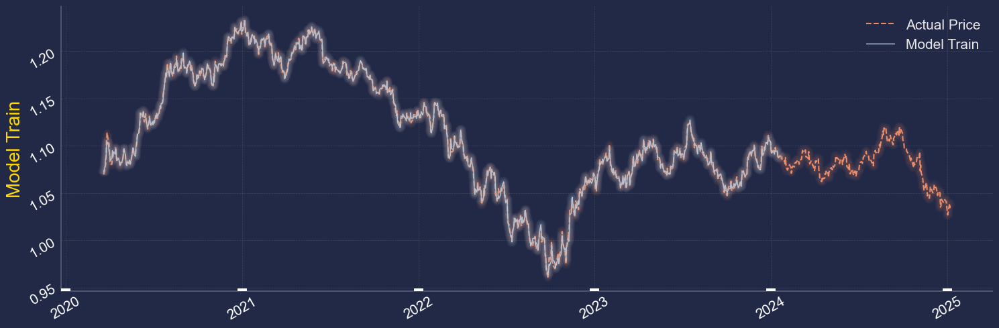

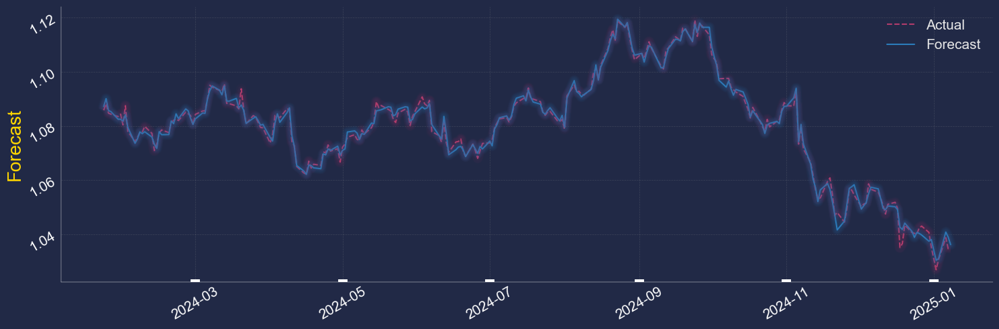

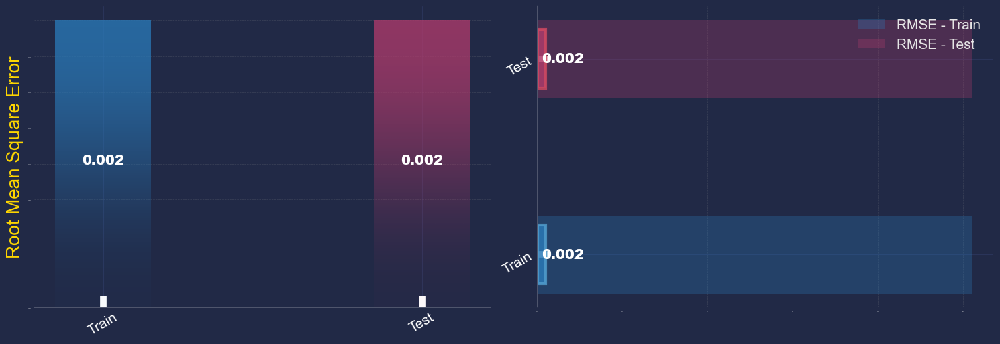

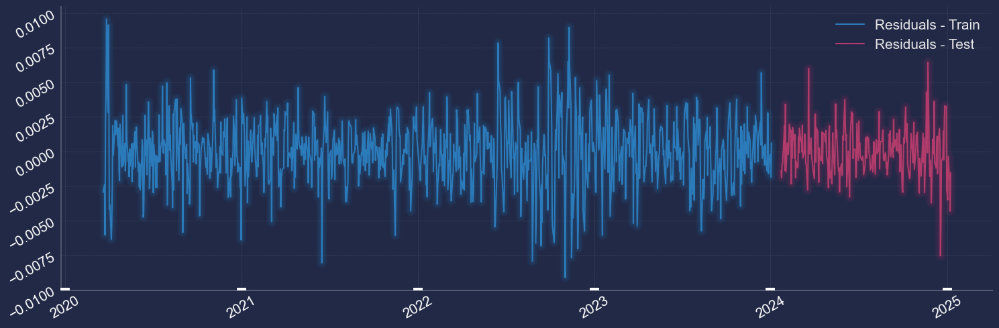

In [89]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=Target_Forex_EURUSD_Close09, model=lr)

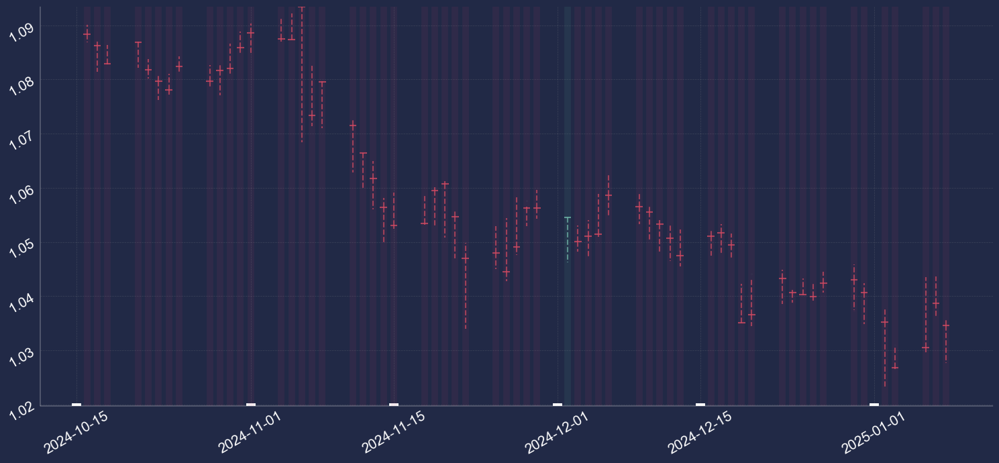

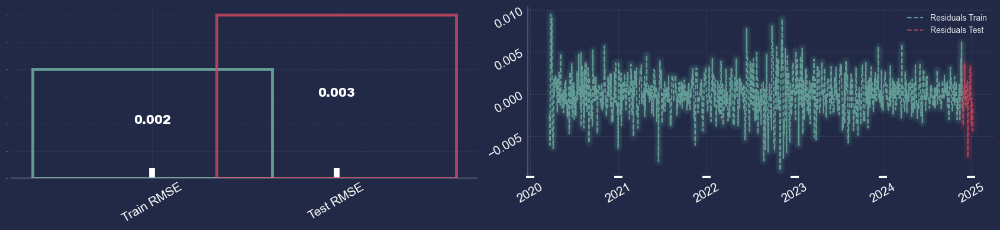

In [90]:
OHLC_S_F.OHLC_S_F(dataframe=Target_Forex_EURUSD_Close09, col_open='EURUSD_Open', col_high='EURUSD_High', col_low='EURUSD_Low', col_close='EURUSD_Close')

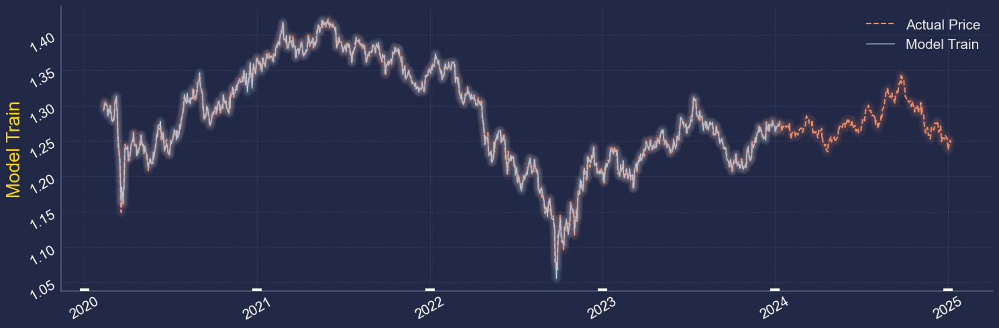

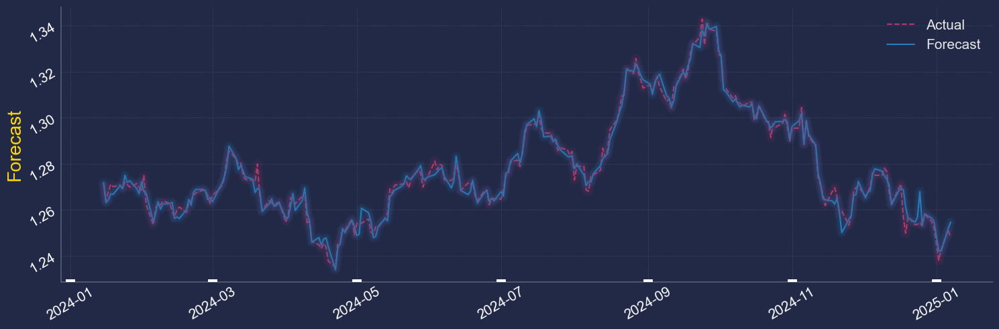

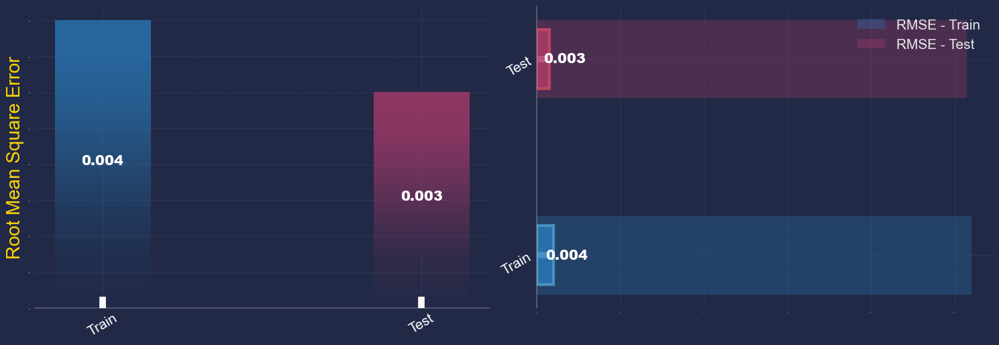

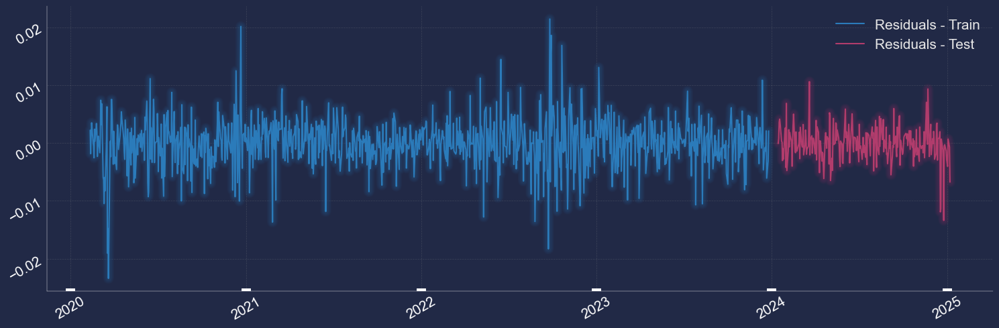

In [10]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=Target_Forex_GBPUSD_Close09, model=lr)

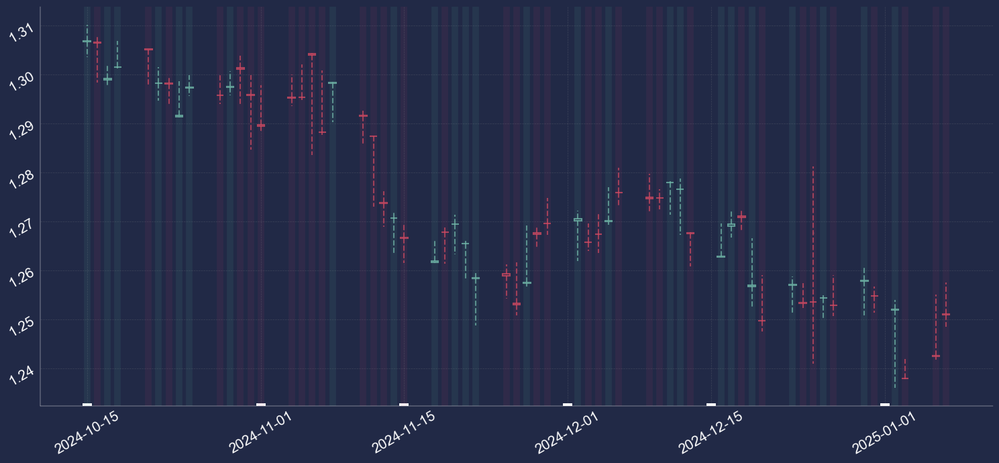

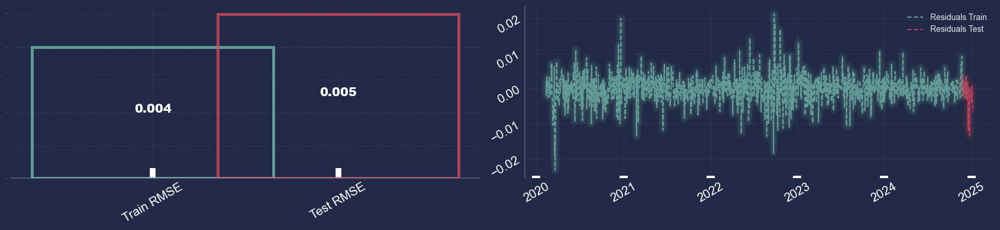

In [11]:
OHLC_S_F.OHLC_S_F(dataframe=Target_Forex_GBPUSD_Close09, col_open='GBPUSD_Open', col_high='GBPUSD_High', col_low='GBPUSD_Low', col_close='GBPUSD_Close')

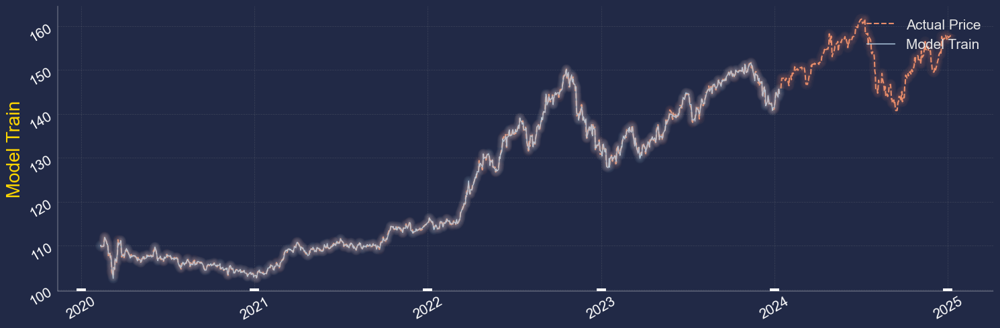

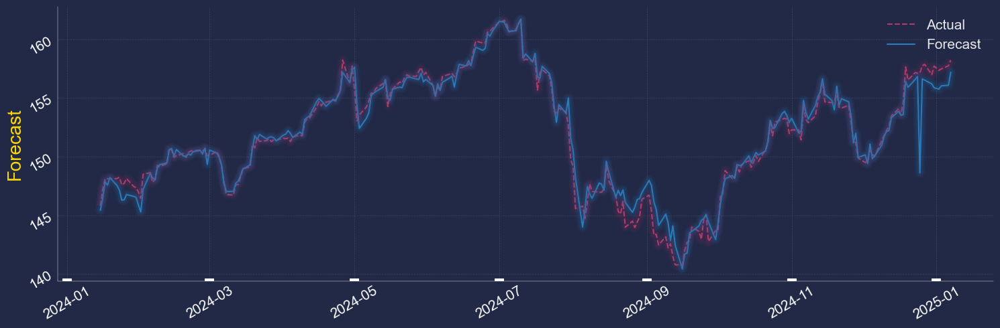

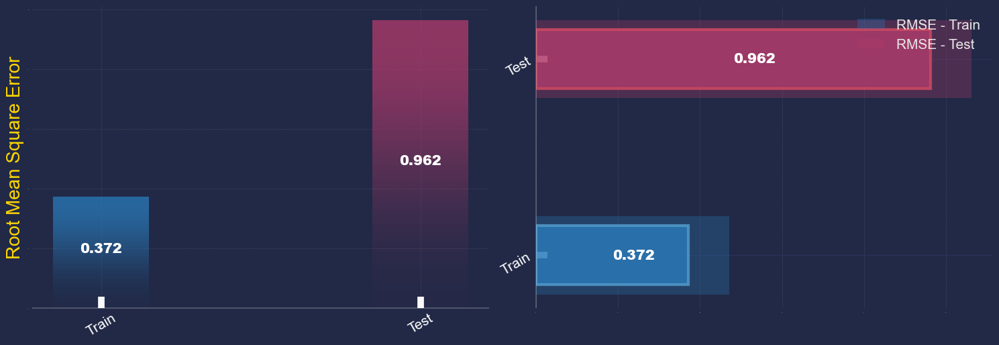

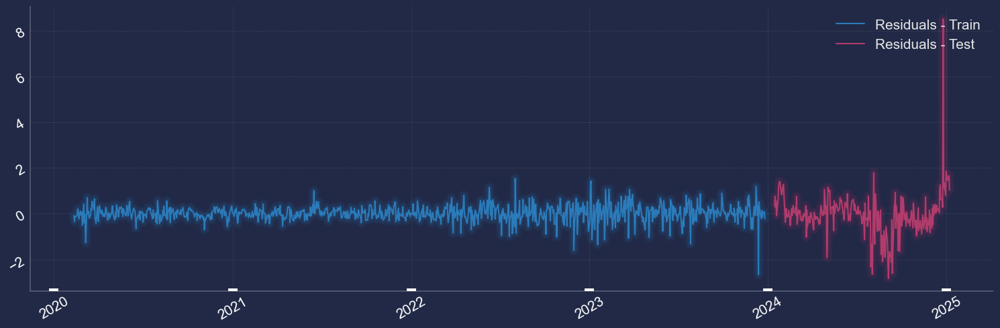

In [23]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=Target_Forex_USDJPY_Close09, model=lr)

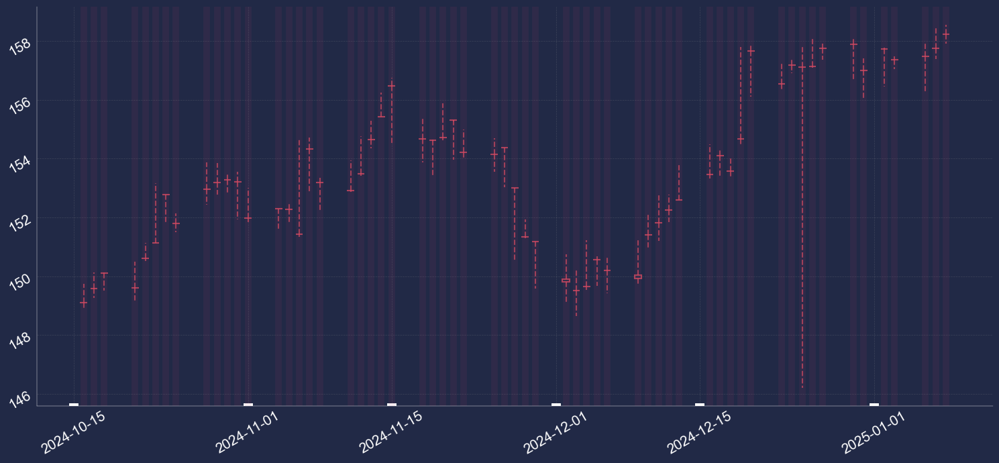

In [44]:
OHLC_S_F.OHLC_S_F(dataframe=Target_Forex_USDJPY_Close09, col_open='USDJPY_Open', col_high='USDJPY_High', col_low='USDJPY_Low', col_close='USDJPY_Close')

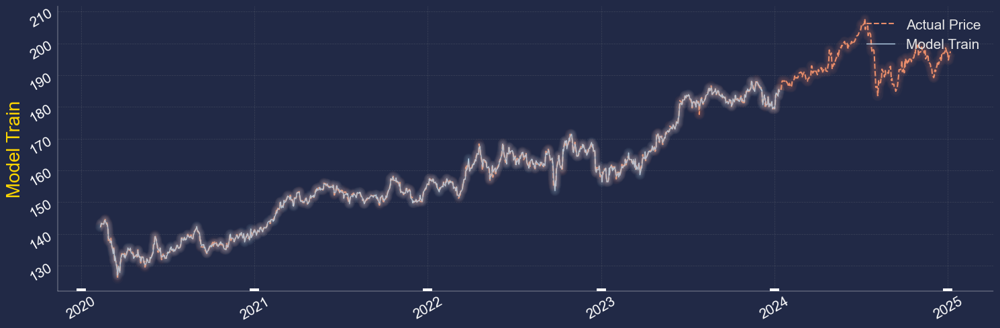

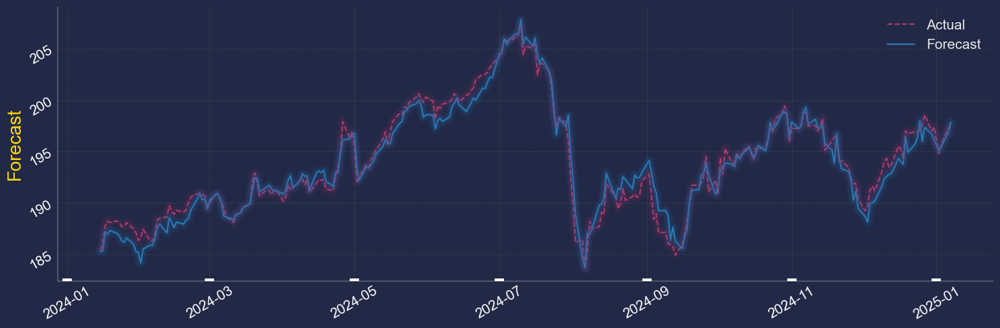

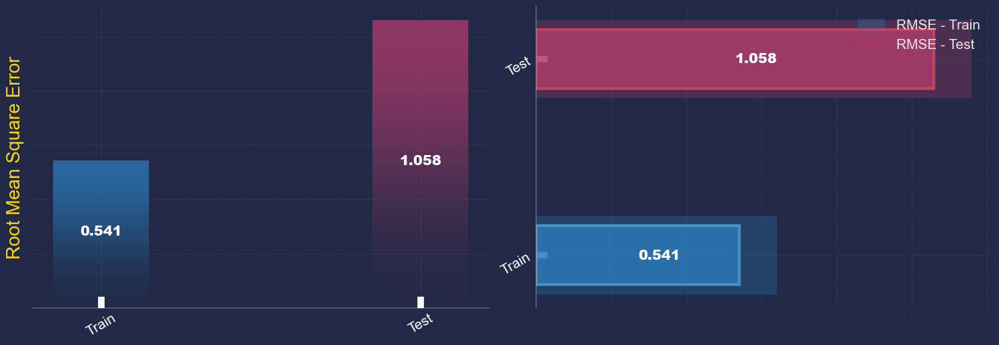

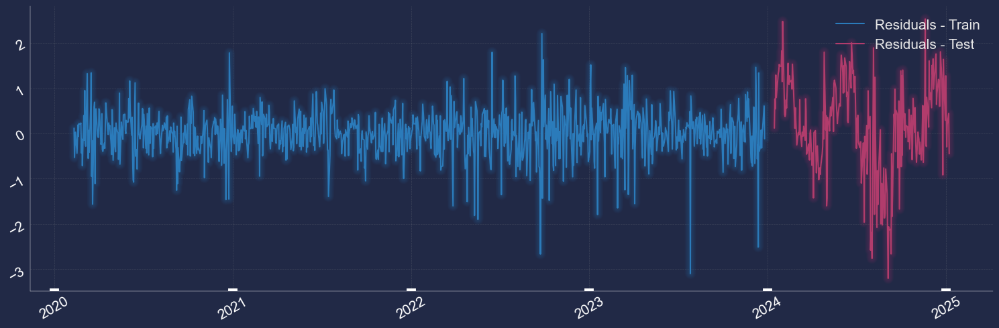

In [27]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=Target_Forex_GBPJPY_Close08, model=lr)

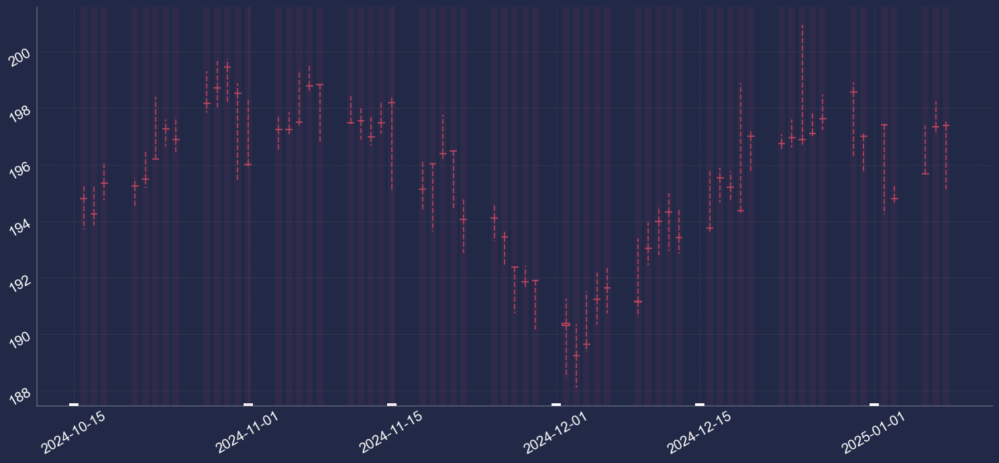

In [45]:
OHLC_S_F.OHLC_S_F(dataframe=Target_Forex_GBPJPY_Close08, col_open='GBPJPY_Open', col_high='GBPJPY_High', col_low='GBPJPY_Low', col_close='GBPJPY_Close')

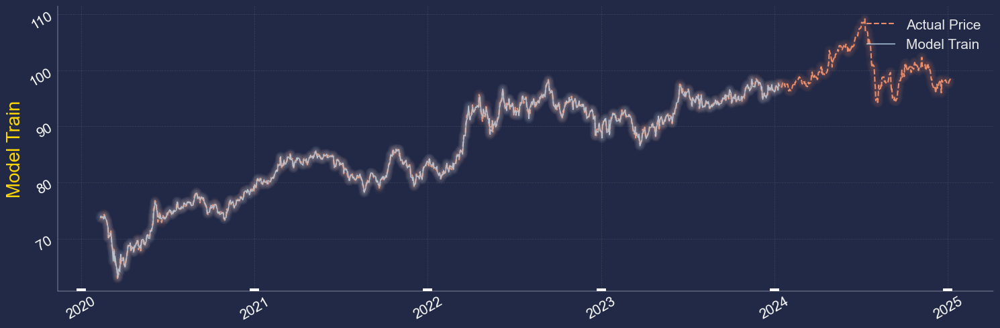

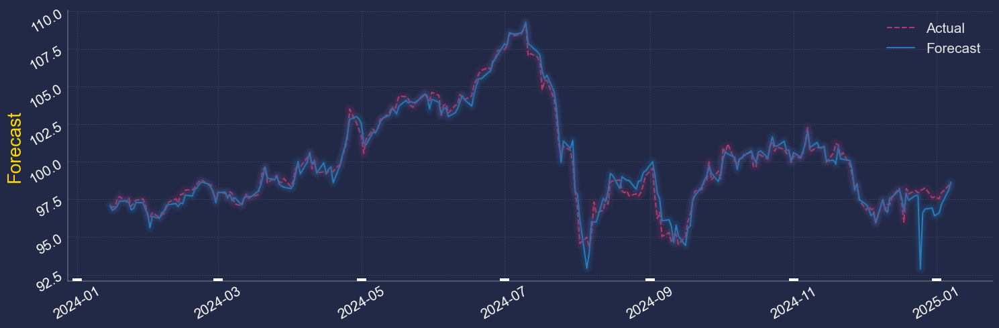

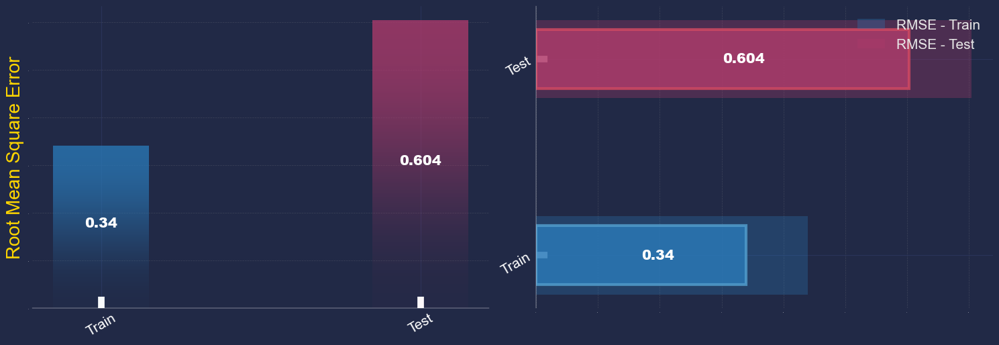

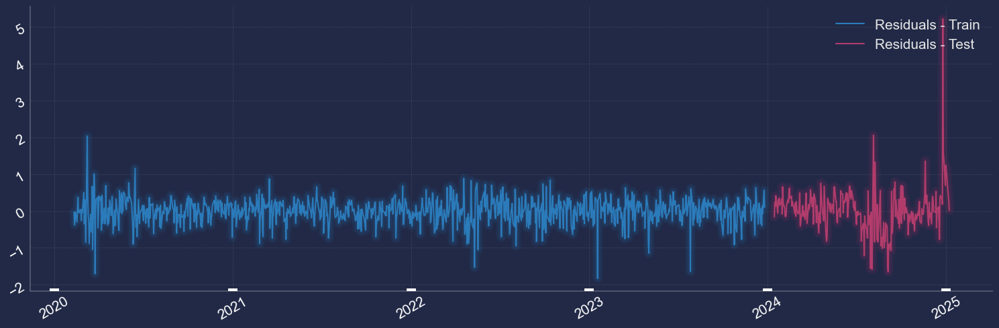

In [30]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=Target_Forex_AUDJPY_Close09, model=lr)

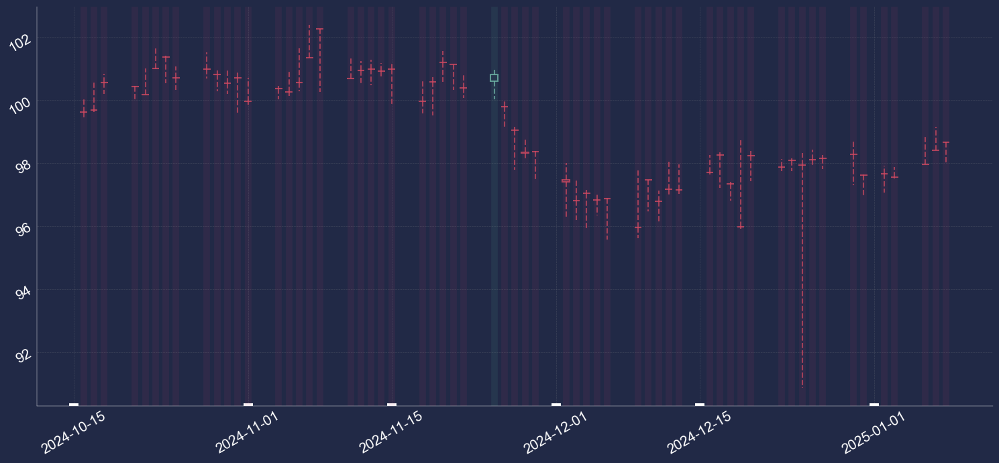

In [46]:
OHLC_S_F.OHLC_S_F(dataframe=Target_Forex_AUDJPY_Close09, col_open='AUDJPY_Open', col_high='AUDJPY_High', col_low='AUDJPY_Low', col_close='AUDJPY_Close')

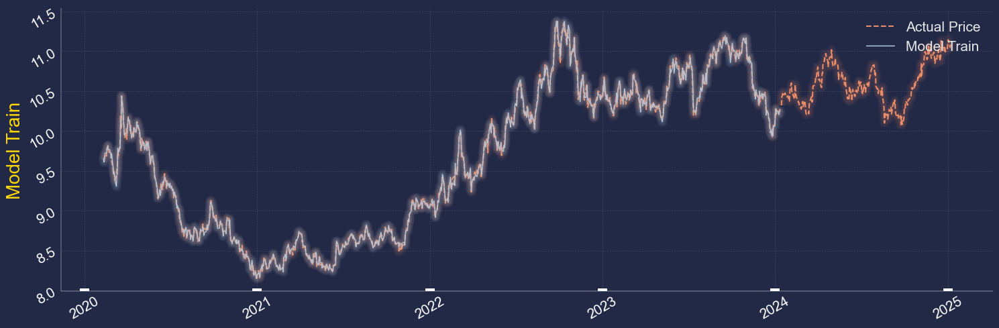

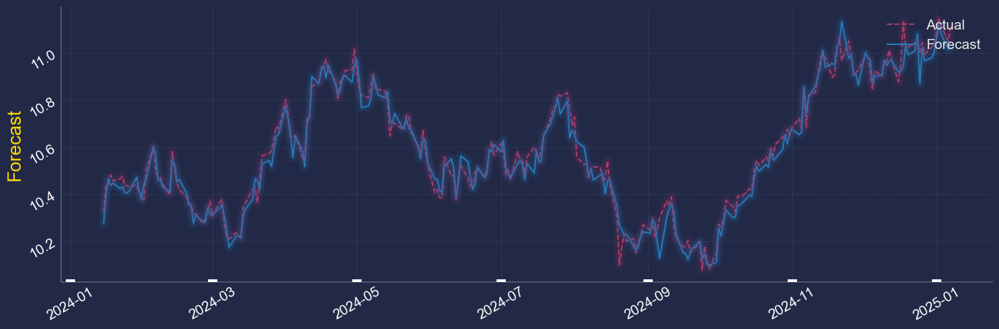

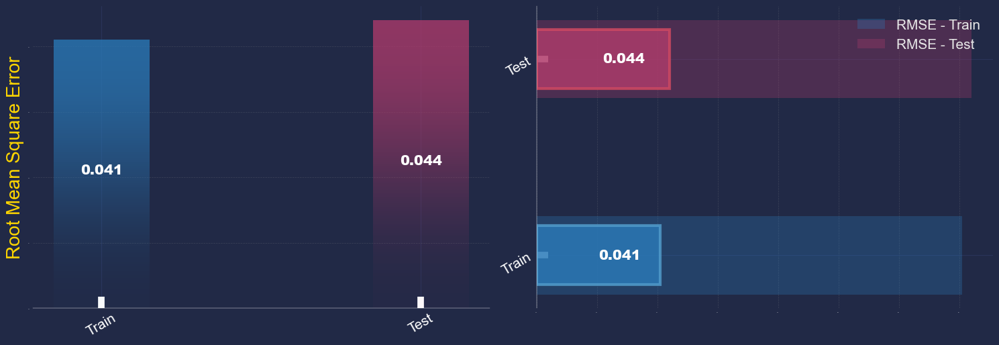

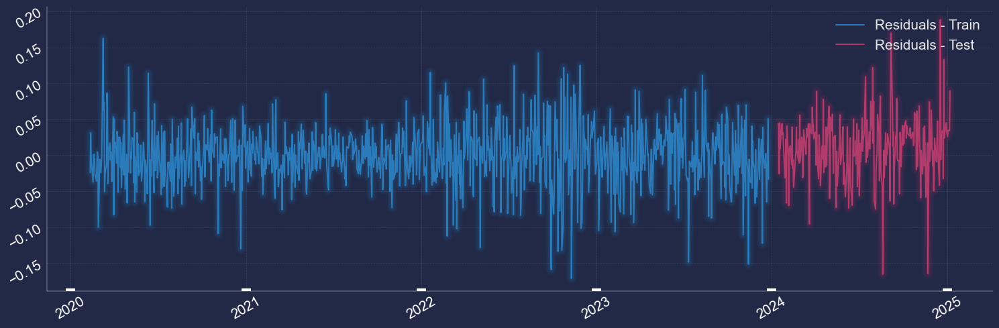

In [33]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=Target_Forex_USDSEK_Close09, model=lr)

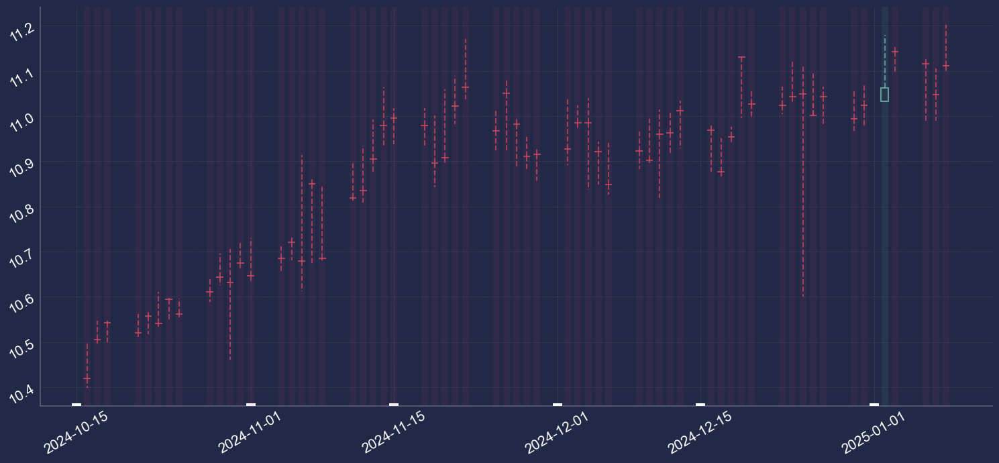

In [47]:
OHLC_S_F.OHLC_S_F(dataframe=Target_Forex_USDSEK_Close09, col_open='USDSEK_Open', col_high='USDSEK_High', col_low='USDSEK_Low', col_close='USDSEK_Close')

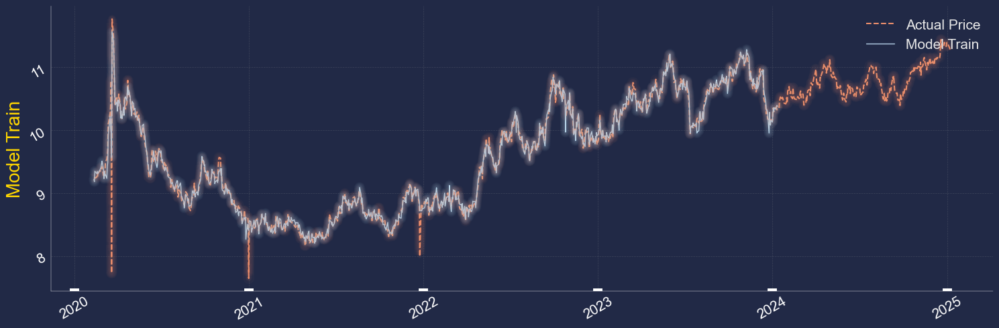

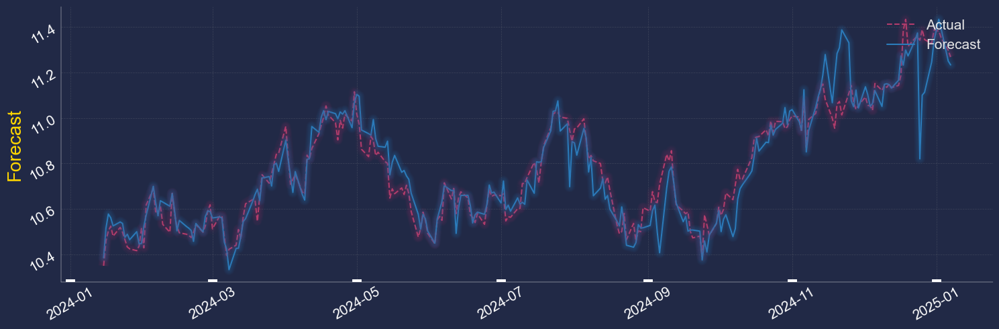

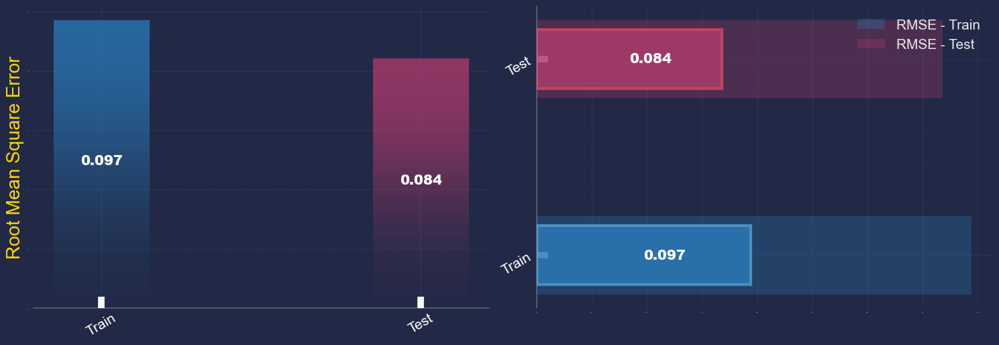

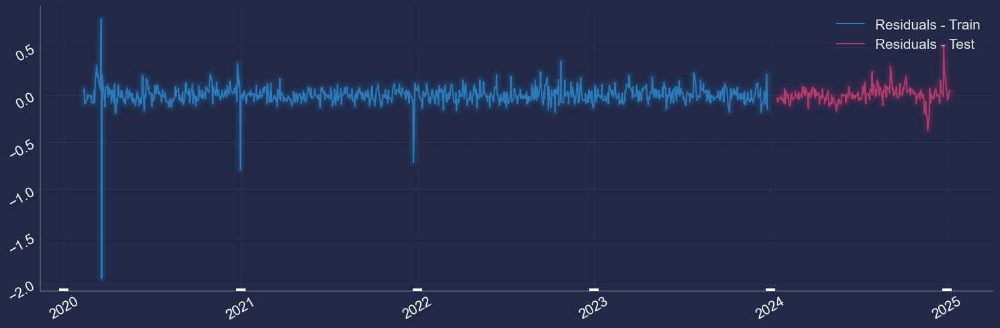

In [36]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=Target_Forex_USDNOK_Close09, model=lr)

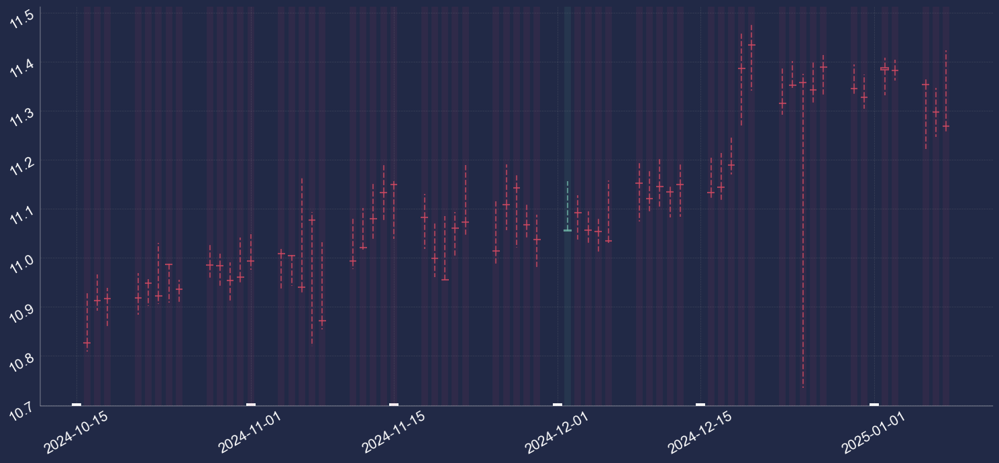

In [48]:
OHLC_S_F.OHLC_S_F(dataframe=Target_Forex_USDNOK_Close09, col_open='USDNOK_Open', col_high='USDNOK_High', col_low='USDNOK_Low', col_close='USDNOK_Close')

In [53]:
X = Target_Forex_EURUSD_Close09.iloc[:, 1:]
Y = Target_Forex_EURUSD_Close09.iloc[:, 0]

X_train = X.iloc[0:-1, :]
y_train = Y.iloc[0:-1]
X_test = X.iloc[[-1], :]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
print('EUR/USD: ', pred)

EUR/USD:  [1.03455413]


In [12]:
X = Target_Forex_GBPUSD_Close08.iloc[:, 1:]
Y = Target_Forex_GBPUSD_Close08.iloc[:, 0]

X_train = X.iloc[0:-1, :]
y_train = Y.iloc[0:-1]
X_test = X.iloc[[-1], :]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
print('GBP/USD: ', pred)

GBP/USD:  [1.2554802]


In [13]:
X = Target_Forex_USDJPY_Close08.iloc[:, 1:]
Y = Target_Forex_USDJPY_Close08.iloc[:, 0]

X_train = X.iloc[0:-1, :]
y_train = Y.iloc[0:-1]
X_test = X.iloc[[-1], :]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
print('USD/JPY: ', pred)

USD/JPY:  [158.25076564]


In [14]:
X = Target_Forex_GBPJPY_Close08.iloc[:, 1:]
Y = Target_Forex_GBPJPY_Close08.iloc[:, 0]

X_train = X.iloc[0:-1, :]
y_train = Y.iloc[0:-1]
X_test = X.iloc[[-1], :]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
print('GBP/JPY: ', pred)

GBP/JPY:  [198.50584145]


In [15]:
X = Target_Forex_AUDJPY_Close08.iloc[:, 1:]
Y = Target_Forex_AUDJPY_Close08.iloc[:, 0]

X_train = X.iloc[0:-1, :]
y_train = Y.iloc[0:-1]
X_test = X.iloc[[-1], :]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
print('AUD/JPY: ', pred)

AUD/JPY:  [99.09393535]


In [16]:
X = Target_Forex_USDSEK_Close08.iloc[:, 1:]
Y = Target_Forex_USDSEK_Close08.iloc[:, 0]

X_train = X.iloc[0:-1, :]
y_train = Y.iloc[0:-1]
X_test = X.iloc[[-1], :]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
print('USD/SEK: ', pred)

USD/SEK:  [11.03813364]


In [17]:
X = Target_Forex_USDNOK_Close08.iloc[:, 1:]
Y = Target_Forex_USDNOK_Close08.iloc[:, 0]

X_train = X.iloc[0:-1, :]
y_train = Y.iloc[0:-1]
X_test = X.iloc[[-1], :]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
print('USD/NOK: ', pred)

USD/NOK:  [11.20801333]


### Binance

In [3]:
df_BUSD = pd.read_csv('../Forecast_Prices/Data/Binance_Data_Crypto/BUSD/Binance_CRYPTO_BUSD_Data.csv', index_col='Open time')
df_USDT = pd.read_csv('../Forecast_Prices/Data/Binance_Data_Crypto/USDT/Binance_CRYPTOUSDT_Data.csv', index_col='Open time')
df_EUR = pd.read_csv('../Forecast_Prices/Data/Binance_Data_Crypto/EUR/Binance_EURCRY_Data.csv', index_col='Open time')

In [ ]:
bi = Binance()

all_cypto_coin = bi.Get_All_Coins_Info(countryCode='BUSD')
df_BUSD = bi.Get_Historical_Data_1Day(list_of_data=all_cypto_coin)
df_BUSD = bi.re_Get_Historical_Data_1Day(old_dataframe=df_BUSD, list_of_data=all_cypto_coin)

all_cypto_coin = bi.Get_All_Coins_Info(countryCode='USDT')
df_USDT = bi.Get_Historical_Data_1Day(list_of_data=all_cypto_coin)
df_USDT = bi.re_Get_Historical_Data_1Day(old_dataframe=df_USDT, list_of_data=all_cypto_coin)

all_cypto_coin = bi.Get_All_Coins_Info(countryCode='EUR')
df_EUR = bi.Get_Historical_Data_1Day(list_of_data=all_cypto_coin)
df_EUR = bi.re_Get_Historical_Data_1Day(old_dataframe=df_EUR, list_of_data=all_cypto_coin)

S_CSV.Save_CSV_File(dataframe=df_BUSD, name_of_csv='Binance_CRYPTO_BUSD_Data')
S_CSV.Save_CSV_File(dataframe=df_USDT, name_of_csv='Binance_CRYPTO_USDT_Data')
S_CSV.Save_CSV_File(dataframe=df_EUR, name_of_csv='Binance_CRYPTO_EUR_Data')

df = pd.concat([df_USDT, df_BUSD, df_EUR], axis=1)

--- Start Get All Coins From Binance
.
Symbols:  BUSD 
.
--- End Get_All_Coins_Info From Binance

--- Start Extract Data From Binance
.
.
.


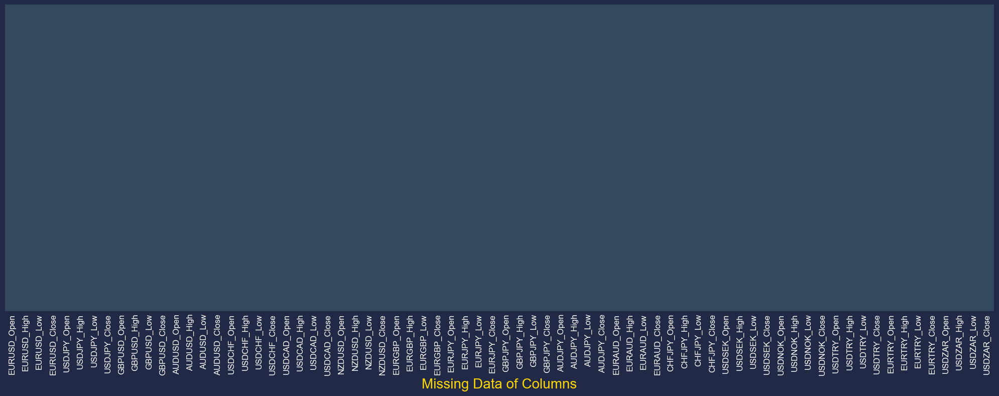

In [13]:
Plots.Plot_Of_Missing_Data(dataframe=df)

In [14]:
df = Preprocessing.Drop_Big_NullSum_Columns(dataframe=df)

--- Start Drop_Big_NullSum_Columns()
.
 Drop > 25% null columns from length of dataframe
.
--- End  Drop_Big_NullSum_Columns()



In [34]:
df[['BTCUSDT_Open','BTCUSDT_High','BTCUSDT_Low','BTCUSDT_Close', 
    'ETHUSDT_Open','ETHUSDT_High','ETHUSDT_Low','ETHUSDT_Close',
    'BNBUSDT_Open','BNBUSDT_High','BNBUSDT_Low','BNBUSDT_Close',
    'XRPUSDT_Open','XRPUSDT_High','XRPUSDT_Low','XRPUSDT_Close',
    'ADAUSDT_Open','ADAUSDT_High','ADAUSDT_Low','ADAUSDT_Close']]

,BTCUSDT_Open,BTCUSDT_High,BTCUSDT_Low,BTCUSDT_Close,ETHUSDT_Open,ETHUSDT_High,ETHUSDT_Low,ETHUSDT_Close,BNBUSDT_Open,BNBUSDT_High,BNBUSDT_Low,BNBUSDT_Close,XRPUSDT_Open,XRPUSDT_High,XRPUSDT_Low,XRPUSDT_Close,ADAUSDT_Open,ADAUSDT_High,ADAUSDT_Low,ADAUSDT_Close
Open time,,,,,,,,,,,,,,,,,,,,
2020-01-01,7195.24,7255.00,7175.15,7200.85,129.16,133.05,128.68,130.77,13.7159,13.8692,13.6500,13.7184,0.19285,0.19526,0.19219,0.19305,0.03285,0.03380,0.03270,0.03348
2020-01-02,7200.77,7212.50,6924.74,6965.71,130.72,130.78,126.38,127.19,13.7072,13.7302,12.9800,13.0105,0.19304,0.19304,0.18508,0.18750,0.03345,0.03348,0.03218,0.03269
2020-01-03,6965.49,7405.00,6871.04,7344.96,127.19,135.14,125.88,134.35,13.0104,13.7500,12.9801,13.6474,0.18750,0.19395,0.18450,0.19338,0.03269,0.03446,0.03236,0.03417
2020-01-04,7345.00,7404.00,7272.21,7354.11,134.37,135.85,132.50,134.20,13.6481,13.8710,13.5102,13.8092,0.19331,0.19363,0.19119,0.19305,0.03417,0.03450,0.03375,0.03434
2020-01-05,7354.19,7495.00,7318.00,7358.75,134.20,138.19,134.19,135.37,13.7978,14.3133,13.7910,14.0532,0.19305,0.19722,0.19288,0.19453,0.03436,0.03527,0.03419,0.03460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-03,96984.79,98976.91,96100.01,98174.18,3455.68,3630.00,3423.44,3609.01,706.2400,715.6900,697.0300,714.8800,2.40240,2.47980,2.39660,2.45470,0.96120,1.11940,0.95690,1.08940
2025-01-04,98174.17,98778.43,97514.79,98220.50,3609.00,3671.60,3572.42,3656.88,714.8700,721.8400,707.8200,713.4100,2.45460,2.50900,2.39990,2.42010,1.08940,1.11440,1.05650,1.07070
2025-01-05,98220.51,98836.85,97276.79,98363.61,3656.88,3675.25,3593.70,3635.99,713.4100,713.9300,702.5100,709.2900,2.42010,2.42850,2.32730,2.39940,1.07070,1.11500,1.05210,1.09110


---

In [15]:
df = Preprocessing.Backrward_Fill_Data(dataframe=df)
df = Preprocessing.Forward_Fill_Data(dataframe=df)

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()



In [ ]:
columns = []

for _ in range(len(df_BTCEUR_Close08_.columns)):
    for __ in range(len(df_BTCEUR_Close.columns)):
        if df_BTCEUR_Close08_.columns[_] in df_BTCEUR_Close.columns[__]:
            #print(_, ': ', df_BTCEUR_Close07_.columns[_])
            # Append only if it's not already in the list
            if df_BTCEUR_Close08_.columns[_] not in columns:
                columns.append(df_BTCEUR_Close08_.columns[_])

columns

In [8]:
df_BTCEUR_Close07_ = df_BTCEUR_Close[columns]
df_BTCEUR_Close07_

NameError: name 'df_BTCEUR_Close' is not defined

In [23]:
df_BTCUSDT_Close = Preprocessing.Select_Target(dataframe=df, column_name='BTCUSDT_Close')

fe = FE(dataframe=df_BTCUSDT_Close)

df_BTCUSDT_Close = fe.Moving_Average(column_name=['Target_BTCUSDT_Close'], ma_number=7)
df_BTCUSDT_Close = fe.Moving_Average(column_name=['Target_BTCUSDT_Close'], ma_number=30)

df_BTCUSDT_Close = fe.Exponential_Moving_Average(column_name=['Target_BTCUSDT_Close'], ema_number=5)
df_BTCUSDT_Close = fe.Exponential_Moving_Average(column_name=['Target_BTCUSDT_Close'], ema_number=25)

df_BTCUSDT_Close = fe.Relative_Strength_Index(column_name=['Target_BTCUSDT_Close'], rsi_number=14)

df_BTCUSDT_Close = Preprocessing.Drop_Missing_Data(dataframe=df_BTCUSDT_Close, axis_=0)

df_BTCUSDT_Close07 = Preprocessing.Correlation(dataframe=df_BTCUSDT_Close, column_target='Target_BTCUSDT_Close', number=0.7)
df_BTCUSDT_Close08 = Preprocessing.Correlation(dataframe=df_BTCUSDT_Close, column_target='Target_BTCUSDT_Close', number=0.8)
df_BTCUSDT_Close09 = Preprocessing.Correlation(dataframe=df_BTCUSDT_Close, column_target='Target_BTCUSDT_Close', number=0.9)

#df_BTCUSDT_Close07_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.7)
#df_BTCUSDT_Close08_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.8)
#df_BTCUSDT_Close09_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.9)

#-------------------------------------------------------------------------------------------------------------------------------=#

df_ETHUSDT_Close = Preprocessing.Select_Target(dataframe=df, column_name='ETHUSDT_Close')

fe = FE(dataframe=df_ETHUSDT_Close)

df_ETHUSDT_Close = fe.Moving_Average(column_name=['Target_ETHUSDT_Close'], ma_number=7)
df_ETHUSDT_Close = fe.Moving_Average(column_name=['Target_ETHUSDT_Close'], ma_number=30)

df_ETHUSDT_Close = fe.Exponential_Moving_Average(column_name=['Target_ETHUSDT_Close'], ema_number=5)
df_ETHUSDT_Close = fe.Exponential_Moving_Average(column_name=['Target_ETHUSDT_Close'], ema_number=25)

df_ETHUSDT_Close = fe.Relative_Strength_Index(column_name=['Target_ETHUSDT_Close'], rsi_number=14)

df_ETHUSDT_Close = Preprocessing.Drop_Missing_Data(dataframe=df_ETHUSDT_Close, axis_=0)

df_ETHUSDT_Close07 = Preprocessing.Correlation(dataframe=df_ETHUSDT_Close, column_target='Target_ETHUSDT_Close', number=0.7)
df_ETHUSDT_Close08 = Preprocessing.Correlation(dataframe=df_ETHUSDT_Close, column_target='Target_ETHUSDT_Close', number=0.8)
df_ETHUSDT_Close09 = Preprocessing.Correlation(dataframe=df_ETHUSDT_Close, column_target='Target_ETHUSDT_Close', number=0.9)

#df_BTCUSDT_Close07_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.7)
#df_BTCUSDT_Close08_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.8)
#df_BTCUSDT_Close09_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.9)

#-------------------------------------------------------------------------------------------------------------------------------=#

df_BNBUSDT_Close = Preprocessing.Select_Target(dataframe=df, column_name='BNBUSDT_Close')

fe = FE(dataframe=df_BNBUSDT_Close)

df_BNBUSDT_Close = fe.Moving_Average(column_name=['Target_BNBUSDT_Close'], ma_number=7)
df_BNBUSDT_Close = fe.Moving_Average(column_name=['Target_BNBUSDT_Close'], ma_number=30)

df_BNBUSDT_Close = fe.Exponential_Moving_Average(column_name=['Target_BNBUSDT_Close'], ema_number=5)
df_BNBUSDT_Close = fe.Exponential_Moving_Average(column_name=['Target_BNBUSDT_Close'], ema_number=25)

df_BNBUSDT_Close = fe.Relative_Strength_Index(column_name=['Target_BNBUSDT_Close'], rsi_number=14)

df_BNBUSDT_Close = Preprocessing.Drop_Missing_Data(dataframe=df_BNBUSDT_Close, axis_=0)

df_BNBUSDT_Close07 = Preprocessing.Correlation(dataframe=df_BNBUSDT_Close, column_target='Target_BNBUSDT_Close', number=0.7)
df_BNBUSDT_Close08 = Preprocessing.Correlation(dataframe=df_BNBUSDT_Close, column_target='Target_BNBUSDT_Close', number=0.8)
df_BNBUSDT_Close09 = Preprocessing.Correlation(dataframe=df_BNBUSDT_Close, column_target='Target_BNBUSDT_Close', number=0.9)

#df_BTCUSDT_Close07_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.7)
#df_BTCUSDT_Close08_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.8)
#df_BTCUSDT_Close09_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.9)

#-------------------------------------------------------------------------------------------------------------------------------=#

df_XRPUSDT_Close = Preprocessing.Select_Target(dataframe=df, column_name='XRPUSDT_Close')

fe = FE(dataframe=df_XRPUSDT_Close)

df_XRPUSDT_Close = fe.Moving_Average(column_name=['Target_XRPUSDT_Close'], ma_number=7)
df_XRPUSDT_Close = fe.Moving_Average(column_name=['Target_XRPUSDT_Close'], ma_number=30)

df_XRPUSDT_Close = fe.Exponential_Moving_Average(column_name=['Target_XRPUSDT_Close'], ema_number=5)
df_XRPUSDT_Close = fe.Exponential_Moving_Average(column_name=['Target_XRPUSDT_Close'], ema_number=25)

df_XRPUSDT_Close = fe.Relative_Strength_Index(column_name=['Target_XRPUSDT_Close'], rsi_number=14)

df_XRPUSDT_Close = Preprocessing.Drop_Missing_Data(dataframe=df_XRPUSDT_Close, axis_=0)

df_XRPUSDT_Close07 = Preprocessing.Correlation(dataframe=df_XRPUSDT_Close, column_target='Target_XRPUSDT_Close', number=0.7)
df_XRPUSDT_Close08 = Preprocessing.Correlation(dataframe=df_XRPUSDT_Close, column_target='Target_XRPUSDT_Close', number=0.8)
df_XRPUSDT_Close09 = Preprocessing.Correlation(dataframe=df_XRPUSDT_Close, column_target='Target_XRPUSDT_Close', number=0.9)

#df_BTCUSDT_Close07_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.7)
#df_BTCUSDT_Close08_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.8)
#df_BTCUSDT_Close09_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.9)

#-------------------------------------------------------------------------------------------------------------------------------=#

df_ADAUSDT_Close = Preprocessing.Select_Target(dataframe=df, column_name='ADAUSDT_Close')

fe = FE(dataframe=df_ADAUSDT_Close)

df_ADAUSDT_Close = fe.Moving_Average(column_name=['Target_ADAUSDT_Close'], ma_number=7)
df_ADAUSDT_Close = fe.Moving_Average(column_name=['Target_ADAUSDT_Close'], ma_number=30)

df_ADAUSDT_Close = fe.Exponential_Moving_Average(column_name=['Target_ADAUSDT_Close'], ema_number=5)
df_ADAUSDT_Close = fe.Exponential_Moving_Average(column_name=['Target_ADAUSDT_Close'], ema_number=25)

df_ADAUSDT_Close = fe.Relative_Strength_Index(column_name=['Target_ADAUSDT_Close'], rsi_number=14)

df_ADAUSDT_Close = Preprocessing.Drop_Missing_Data(dataframe=df_ADAUSDT_Close, axis_=0)

df_ADAUSDT_Close07 = Preprocessing.Correlation(dataframe=df_ADAUSDT_Close, column_target='Target_ADAUSDT_Close', number=0.7)
df_ADAUSDT_Close08 = Preprocessing.Correlation(dataframe=df_ADAUSDT_Close, column_target='Target_ADAUSDT_Close', number=0.8)
df_ADAUSDT_Close09 = Preprocessing.Correlation(dataframe=df_ADAUSDT_Close, column_target='Target_ADAUSDT_Close', number=0.9)

#df_BTCUSDT_Close07_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.7)
#df_BTCUSDT_Close08_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.8)
#df_BTCUSDT_Close09_ = Preprocessing.Correlation(dataframe=df_BTCEUR_Close.iloc[-30:, :], column_target='Target_BTCUSDT_Close', number=0.9)

--- Start Select_Target()
.
Target:  BTCUSDT_Close 
.
--- End Select_Target()

--- Start Drop_Missing_Data()
.
.
--- End  Drop_Missing_Data()

--- Start Correlation()
.
.
Correlation between:  ( -0.7  -  0.7 )
Length of Dataframe is:  67
--- End Correlation()
--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  49
--- End Correlation()
--- Start Correlation()
.
.
Correlation between:  ( -0.9  -  0.9 )
Length of Dataframe is:  13
--- End Correlation()
--- Start Select_Target()
.
Target:  ETHUSDT_Close 
.
--- End Select_Target()

--- Start Drop_Missing_Data()
.
.
--- End  Drop_Missing_Data()

--- Start Correlation()
.
.
Correlation between:  ( -0.7  -  0.7 )
Length of Dataframe is:  129
--- End Correlation()
--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  53
--- End Correlation()
--- Start Correlation()
.
.
Correlation between:  ( -0.9  -  0.9 )
Length of Dataframe is:  21
--- End Correlation()
--- Start S

In [21]:
lr = LinearRegression()

* BITCOIN

In [25]:
#Plots.Plot_Of_Line(dataframe=df_ADAUSDT_Close07, column_name='Target_ADAUSDT_Close')

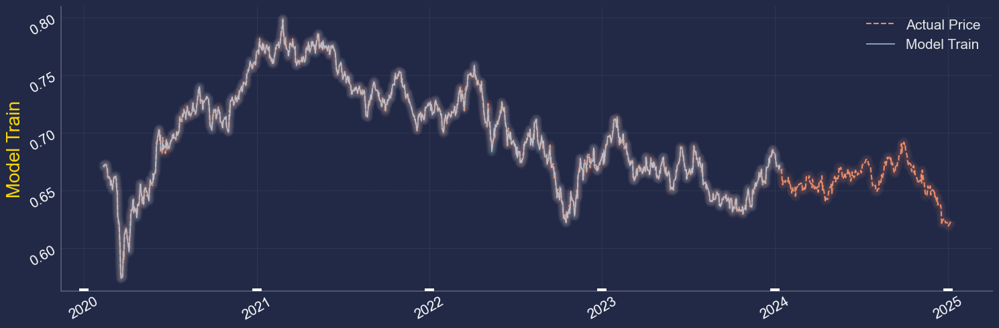

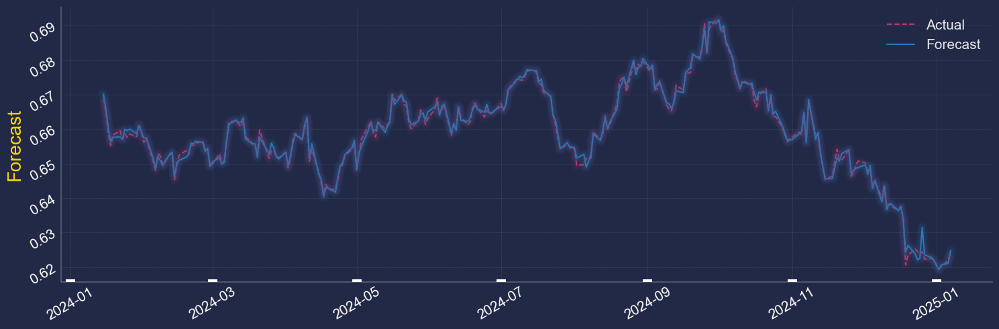

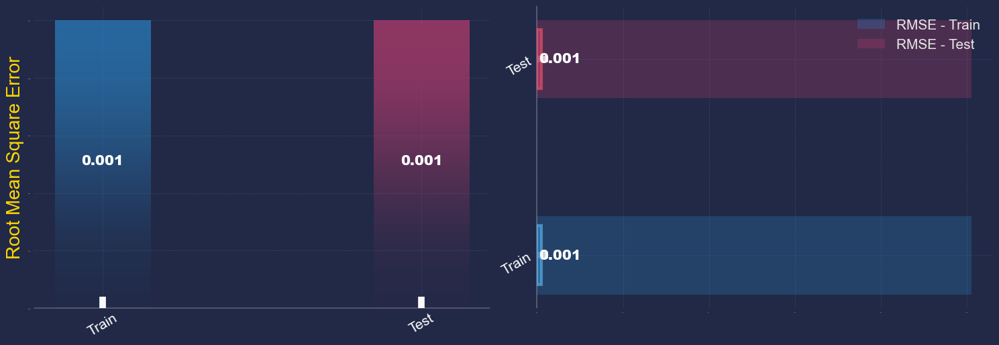

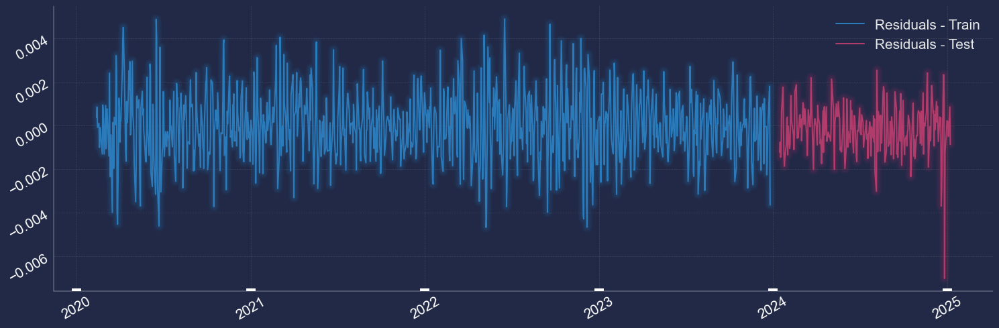

In [36]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=df_AUDUSD_Close07, model=lr)

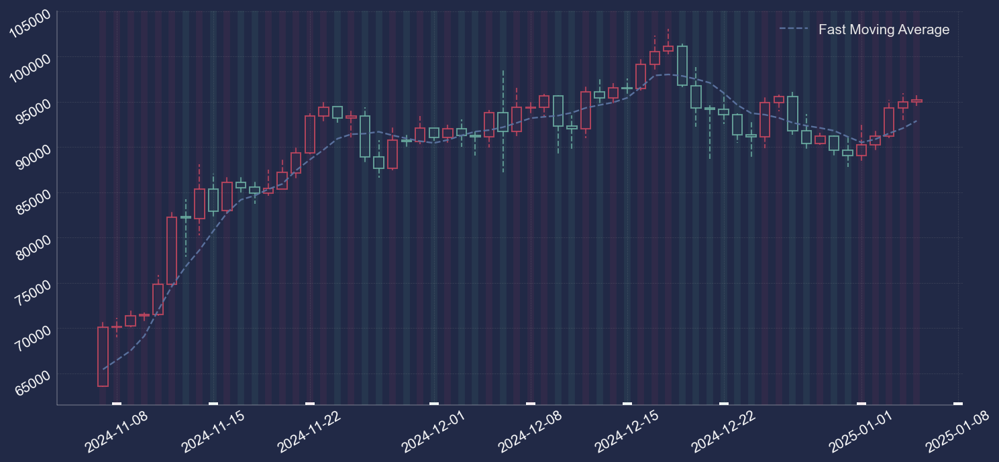

In [17]:
OHLC_S_F.OHLC_S_F(dataframe=df_BTCEUR_Close07, col_open='BTCEUR_Open', col_high='BTCEUR_High', col_low='BTCEUR_Low', col_close='BTCEUR_Close')

* ETHERIUM

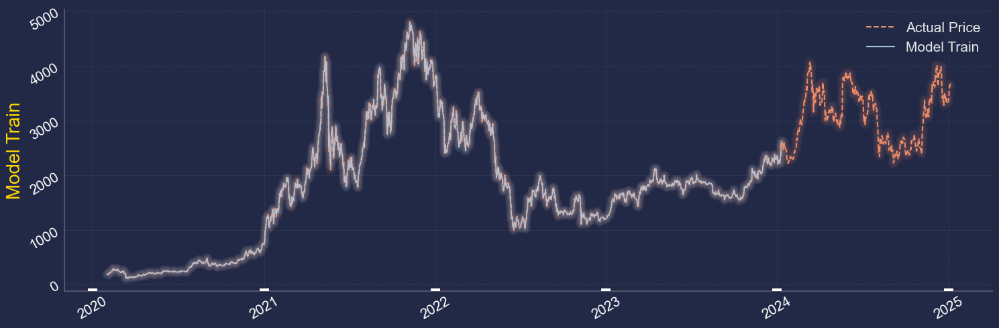

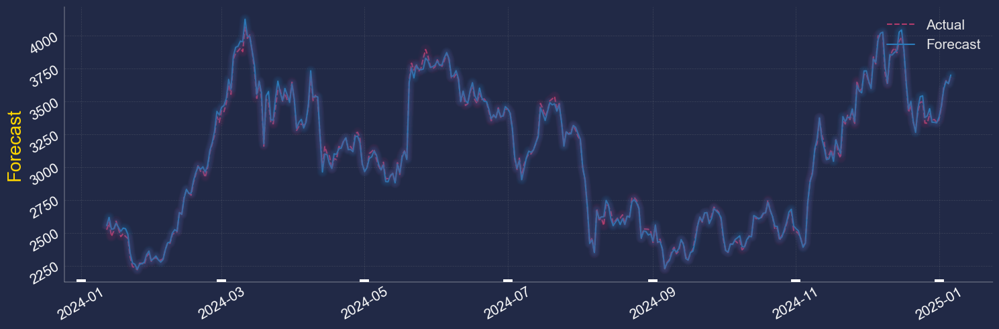

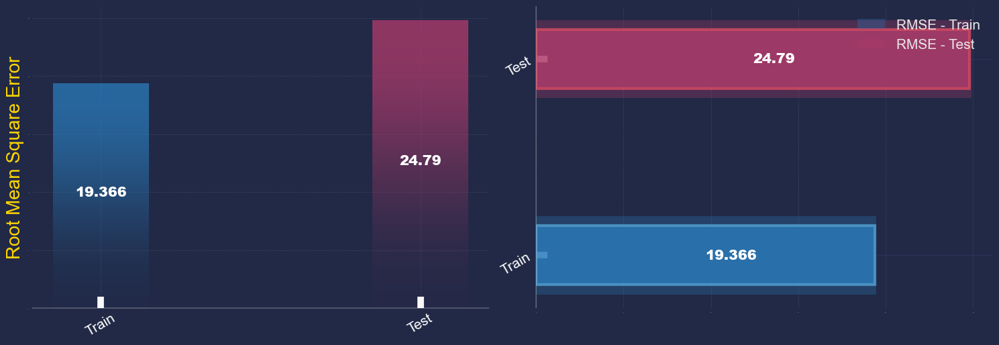

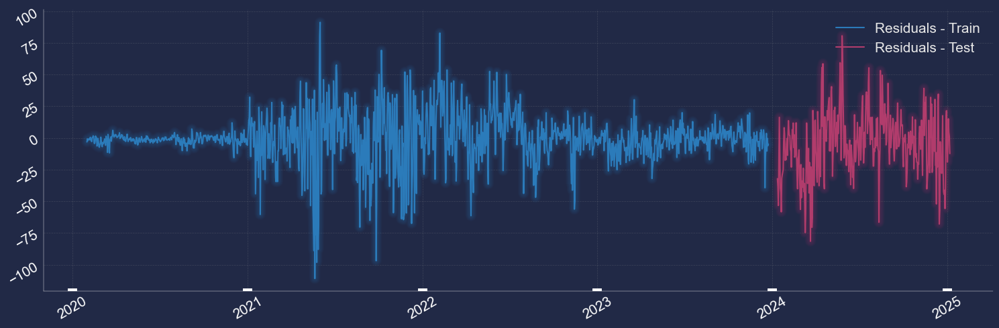

In [27]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=df_ETHUSDT_Close09, model=lr)

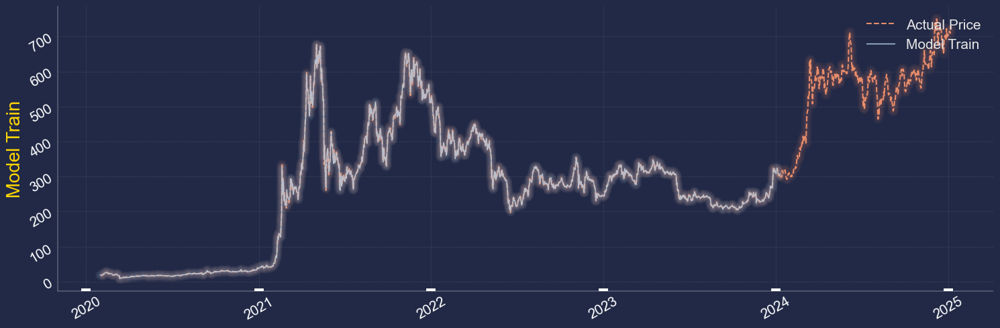

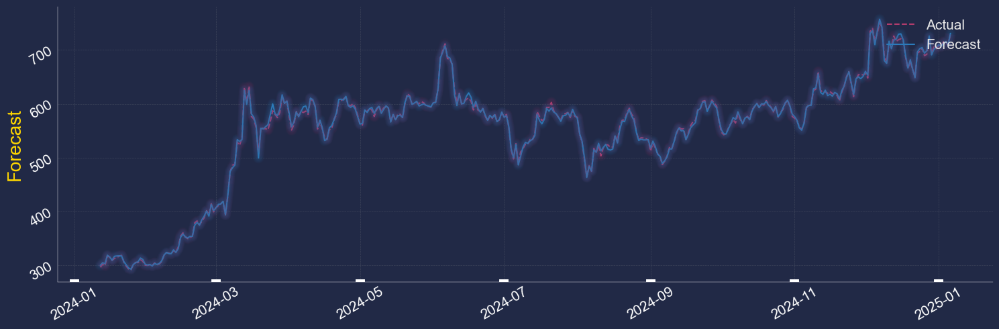

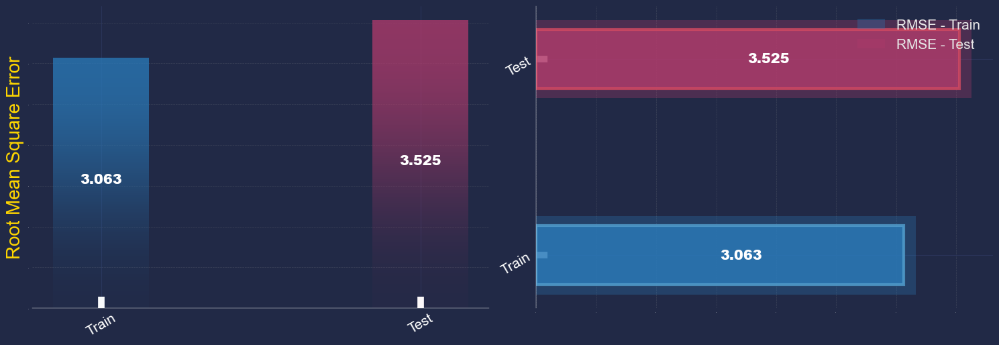

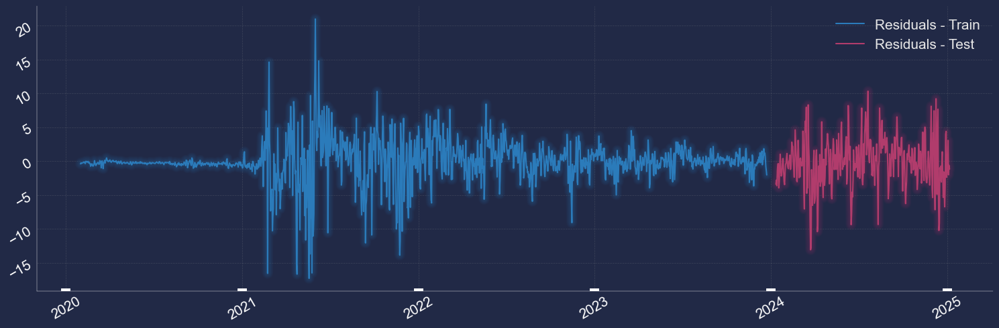

In [28]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=df_BNBUSDT_Close09, model=lr)

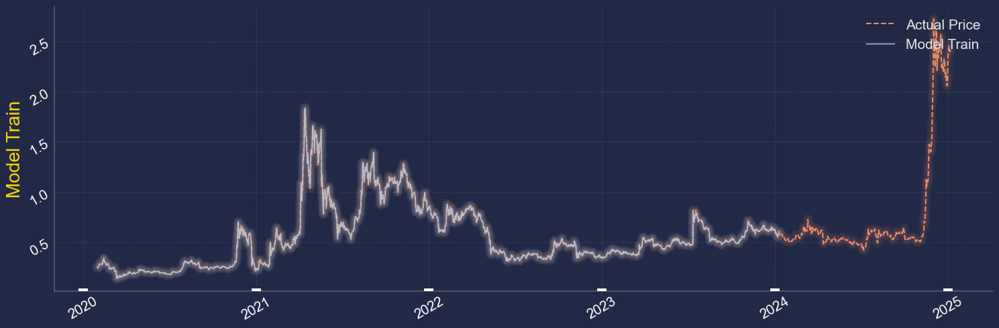

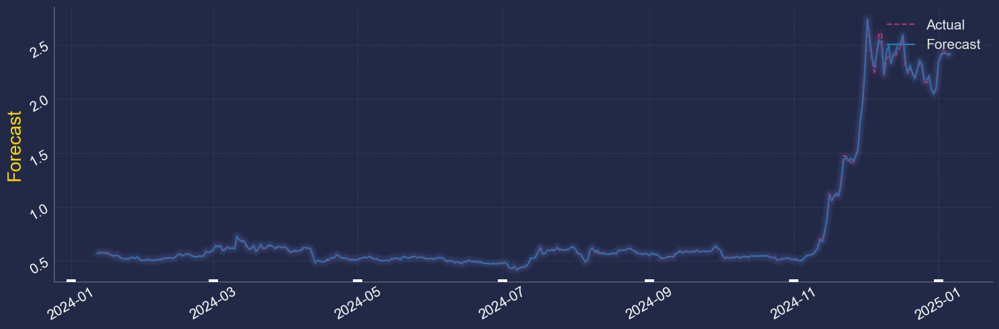

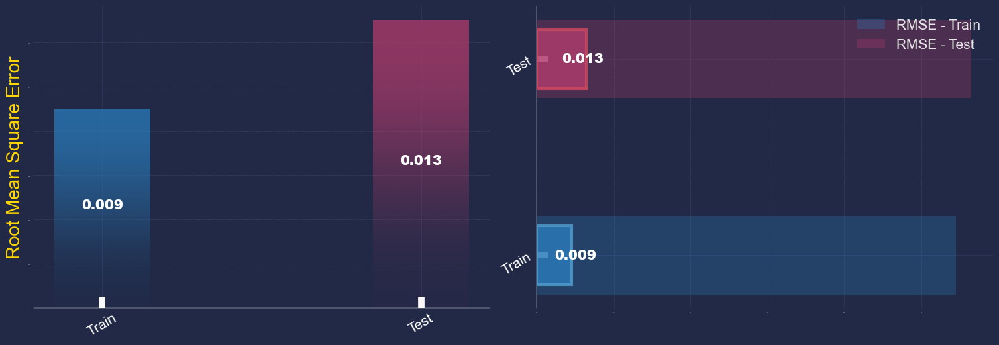

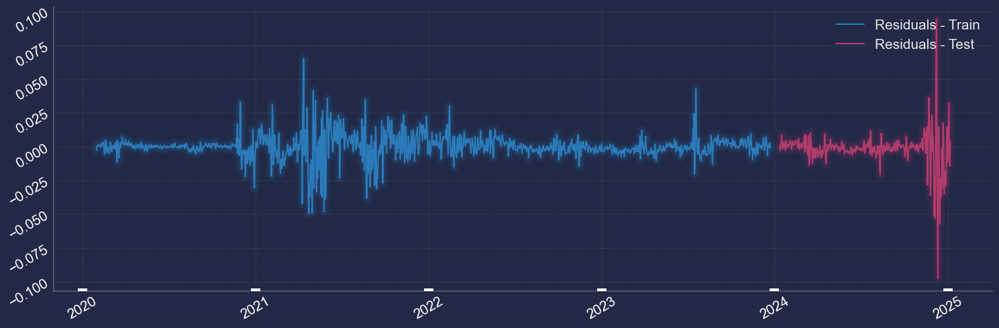

In [29]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=df_XRPUSDT_Close08, model=lr)

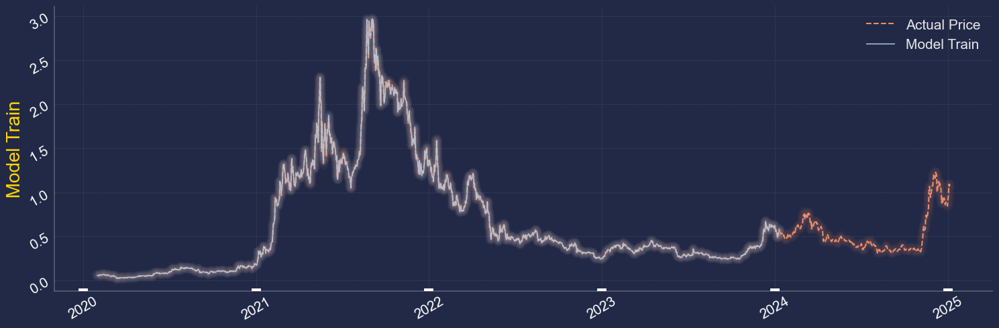

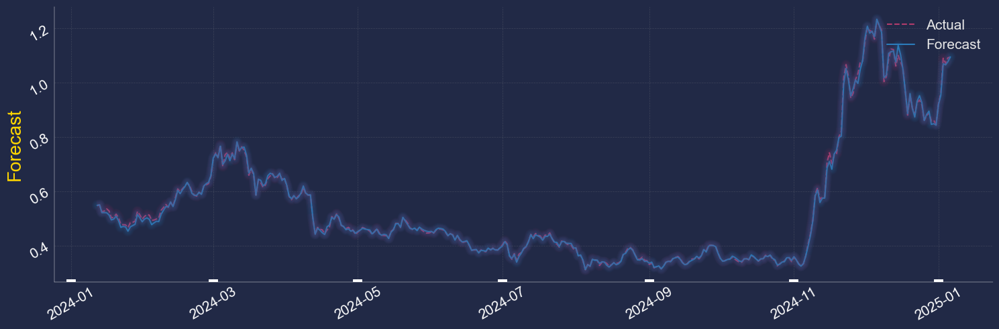

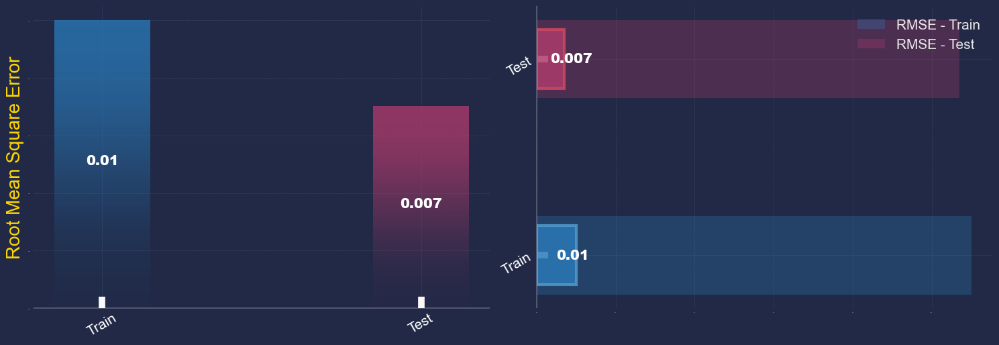

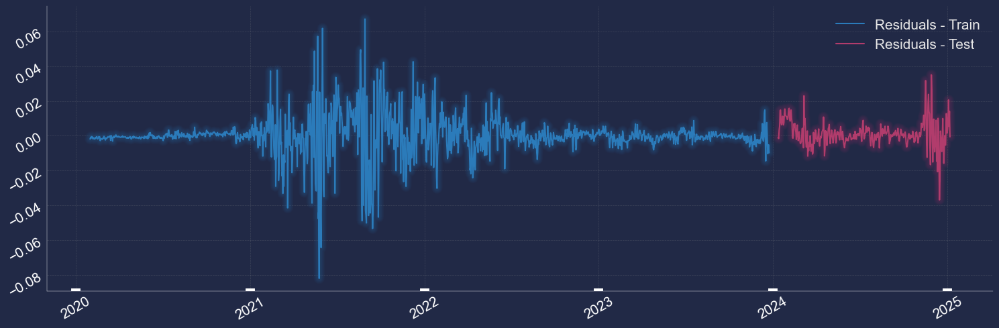

In [30]:
Plots.Recursive_Forecast_Train_Test_Plot_Split(dataframe=df_ADAUSDT_Close09, model=lr)

In [37]:
X = df_AUDUSD_Close07.iloc[:, 1:]
Y = df_AUDUSD_Close07.iloc[:, 0]

X_train = X.iloc[0:-1, :]
X_test = X.iloc[[-1], :]

y_train = Y.iloc[0:-1]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
pred

array([0.62473151])

In [33]:
X = df_USDJPY_Close07.iloc[:, 1:]
Y = df_USDJPY_Close07.iloc[:, 0]

X_train = X.iloc[0:-1, :]
X_test = X.iloc[[-1], :]

y_train = Y.iloc[0:-1]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
pred

array([157.52022705])

In [34]:
X = df_GBPUSD_Close08.iloc[:, 1:]
Y = df_GBPUSD_Close08.iloc[:, 0]

X_train = X.iloc[0:-1, :]
X_test = X.iloc[[-1], :]

y_train = Y.iloc[0:-1]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
pred

array([1.24943478])

In [77]:
X = df_BTCUSDT_Close09.iloc[:, 1:]
Y = df_BTCUSDT_Close09.iloc[:, 0]

X_train = X.iloc[0:-1, :]
X_test = X.iloc[[-1], :]

y_train = Y.iloc[0:-1]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
pred
#BITCOIN

array([101329.90538004])

In [78]:
X = df_ETHUSDT_Close09.iloc[:, 1:]
Y = df_ETHUSDT_Close09.iloc[:, 0]

X_train = X.iloc[0:-1, :]
X_test = X.iloc[[-1], :]

y_train = Y.iloc[0:-1]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
pred
#ETH

array([3655.3198716])

In [79]:
X = df_BNBUSDT_Close09.iloc[:, 1:]
Y = df_BNBUSDT_Close09.iloc[:, 0]

X_train = X.iloc[0:-1, :]
X_test = X.iloc[[-1], :]

y_train = Y.iloc[0:-1]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
pred
#BNB

array([727.45523116])

In [80]:
X = df_XRPUSDT_Close08.iloc[:, 1:]
Y = df_XRPUSDT_Close08.iloc[:, 0]

X_train = X.iloc[0:-1, :]
X_test = X.iloc[[-1], :]

y_train = Y.iloc[0:-1]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
pred
#XRP

array([2.38671429])

In [81]:
X = df_ADAUSDT_Close09.iloc[:, 1:]
Y = df_ADAUSDT_Close09.iloc[:, 0]

X_train = X.iloc[0:-1, :]
X_test = X.iloc[[-1], :]

y_train = Y.iloc[0:-1]

lr.fit(X_train, y_train)

pred = lr.predict(X_test)
pred
#ADA

array([1.11158273])

In [66]:
lr.fit(X_train, y_train)

pred = lr.predict(X_test)
pred

C:\App_Installers\Anaconda\App\envs\V\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [67]:
#Bitcoin Open
pred

array([94633.39019118])

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  380
--- End Correlation()


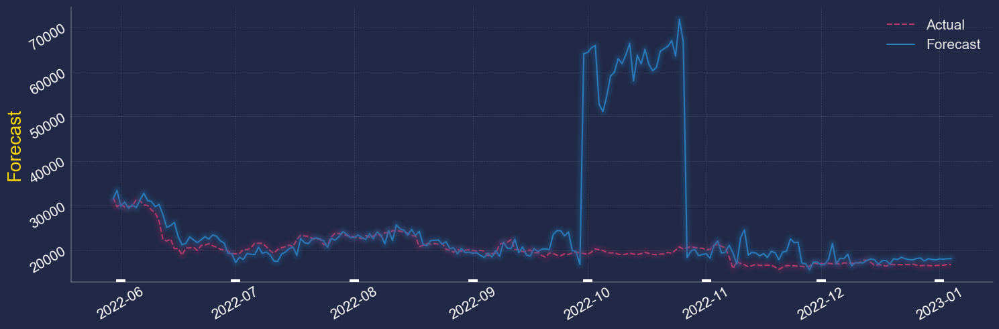

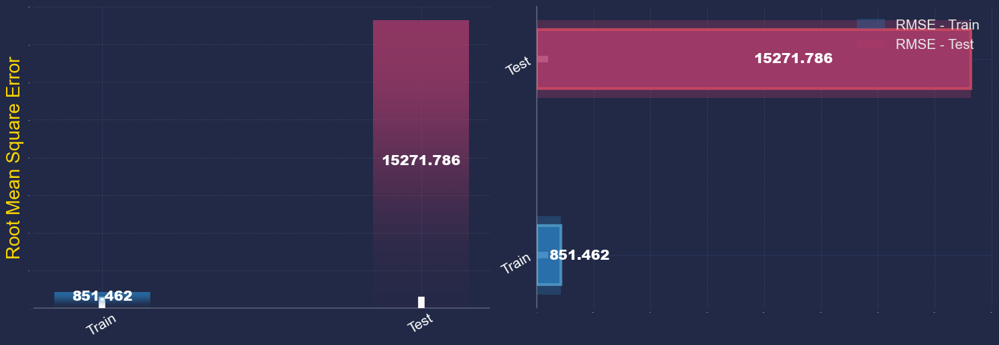

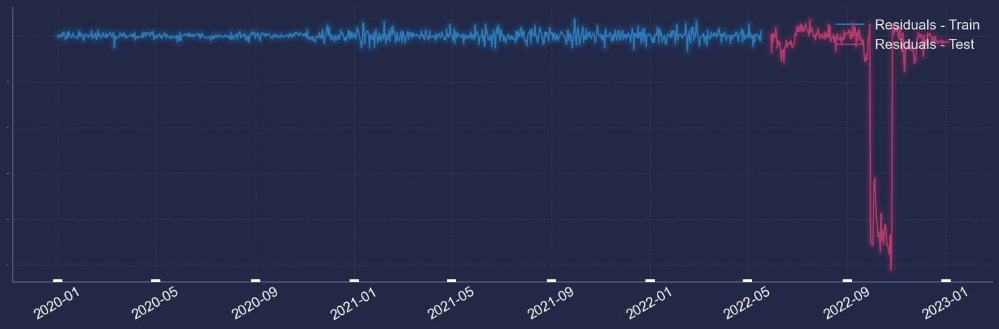

In [8]:
df1 = df.copy()

df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)

df1 = df1[df1.index <= '2023-01-05']
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

--- Start Drop_Holidays_Values()
.
.
--- End Drop_Holidays_Values()
--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  283
--- End Correlation()


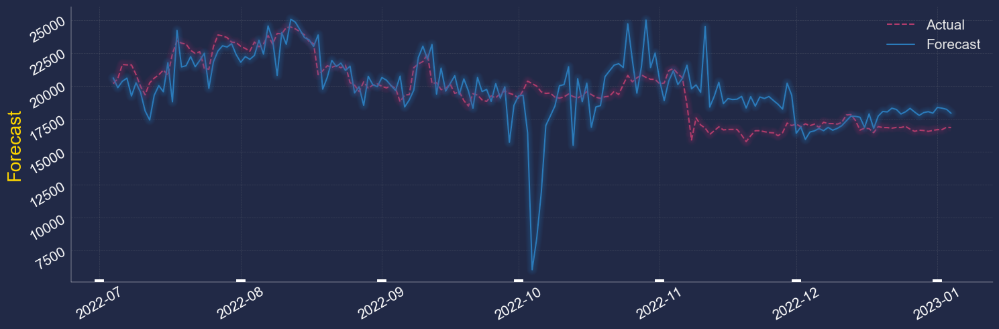

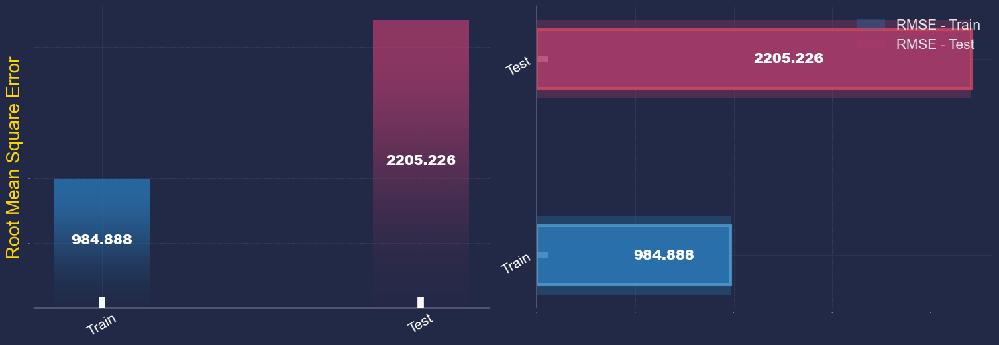

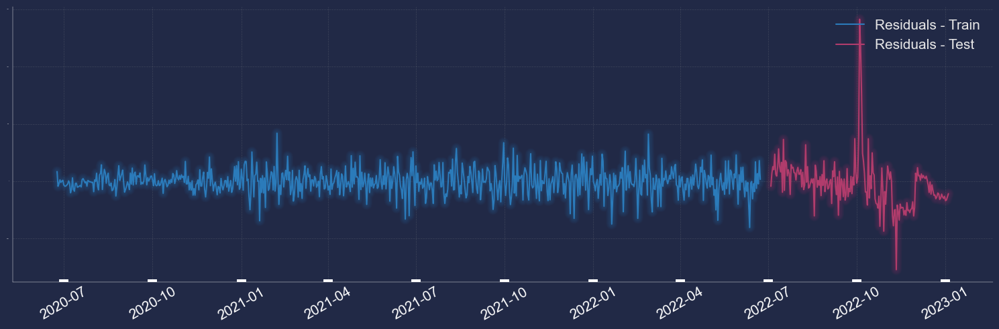

In [9]:
df1 = df.copy()

df1 = Preprocessing.Drop_Holidays_Values(dataframe=df1)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = Preprocessing.Forward_Fill_Data(dataframe=df)

df1 = df1[df1.index <= '2023-01-05']
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

--- Start Drop_Holidays_Values()
.
.
--- End Drop_Holidays_Values()
--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  380
--- End Correlation()


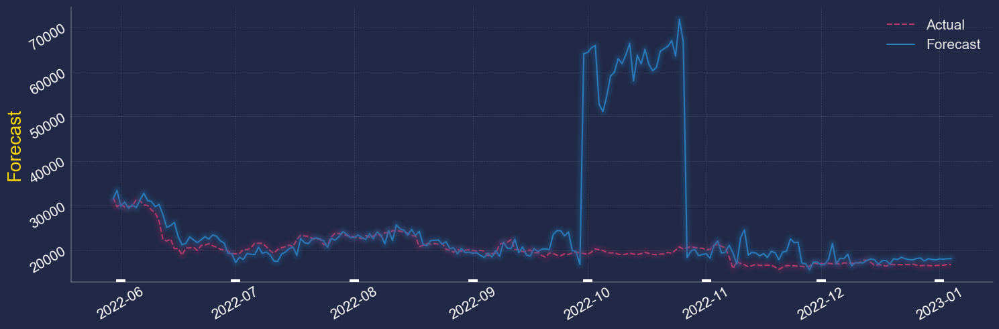

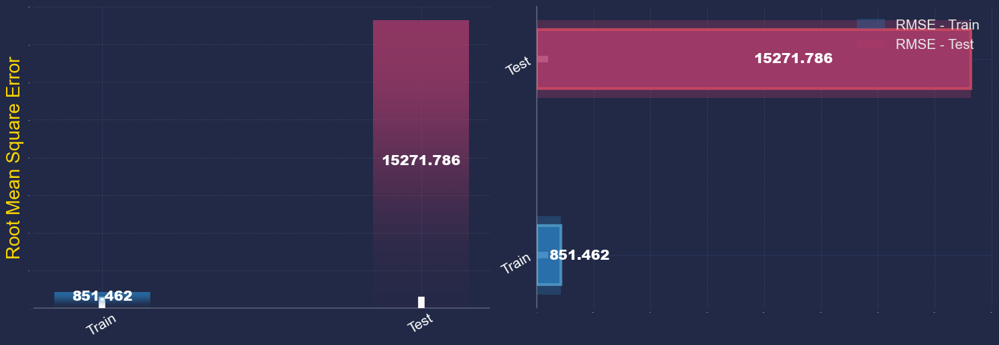

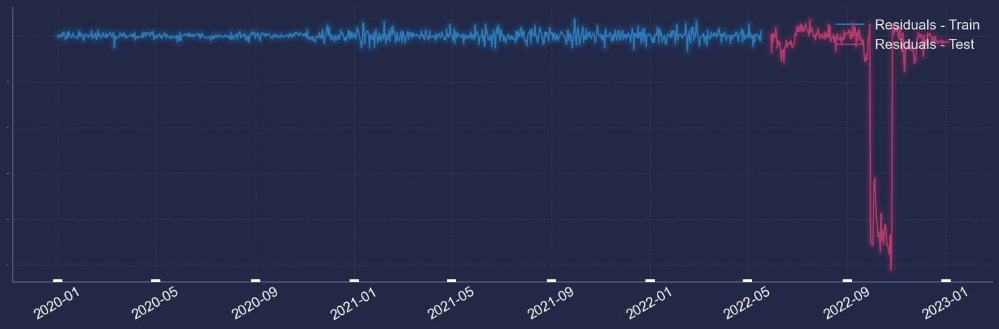

In [10]:
df1 = df.copy()

df1 = Preprocessing.Drop_Holidays_Values(dataframe=df1)
df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = df1[df1.index <= '2023-01-05']
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

---

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  163
--- End Correlation()


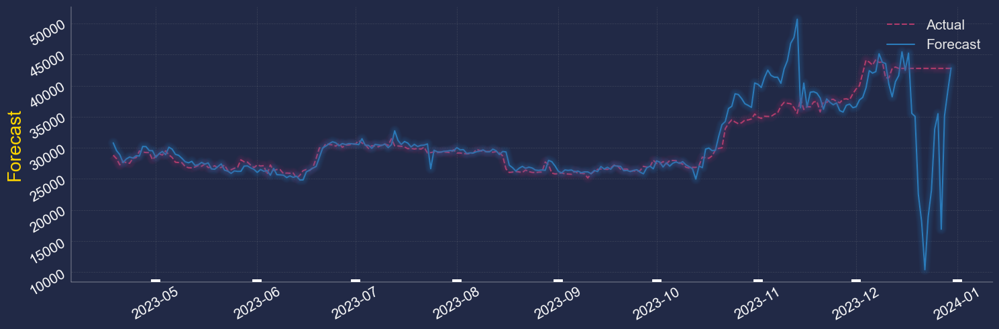

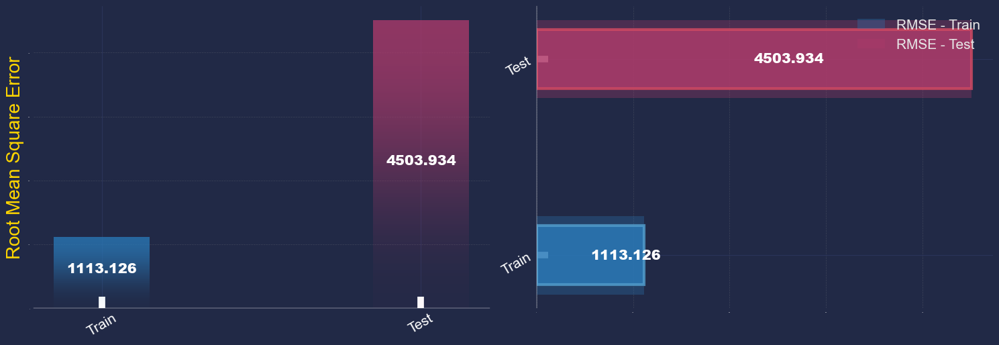

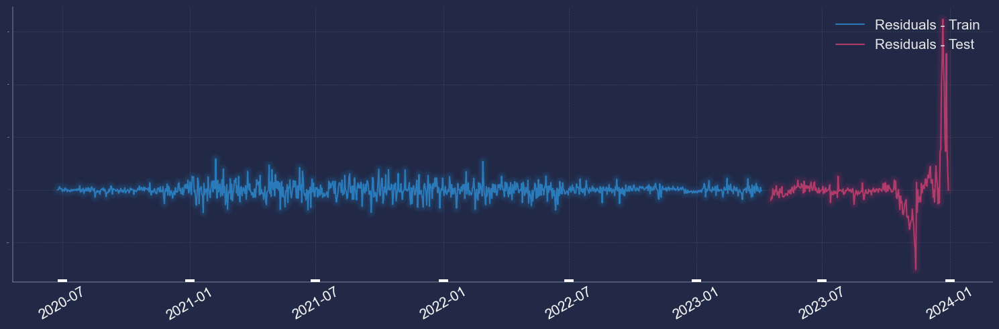

In [11]:
df1 = df.copy()

df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  338
--- End Correlation()


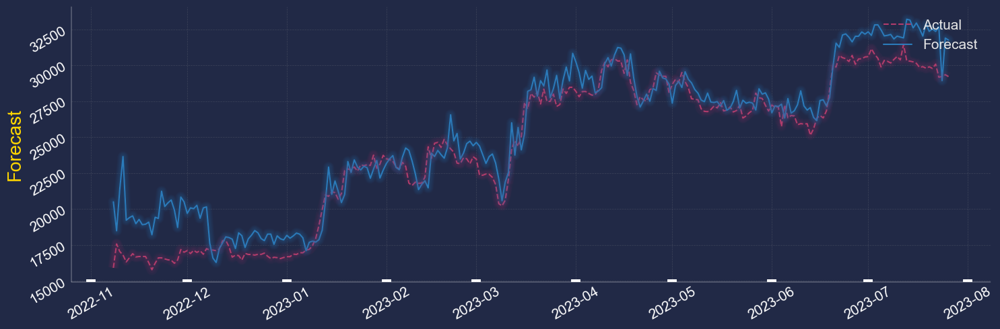

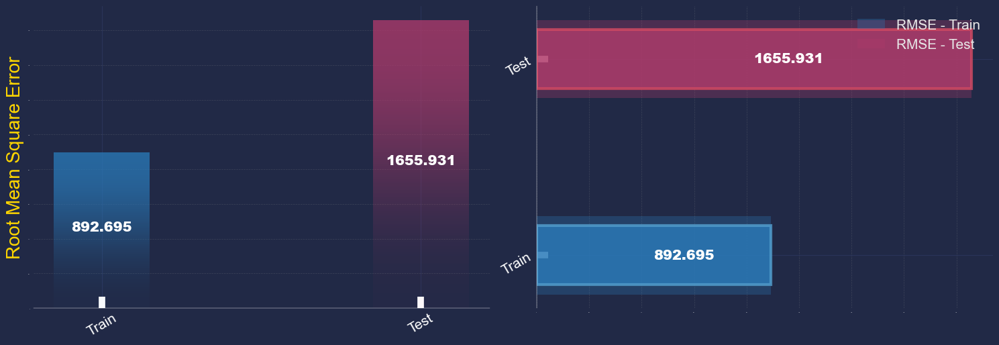

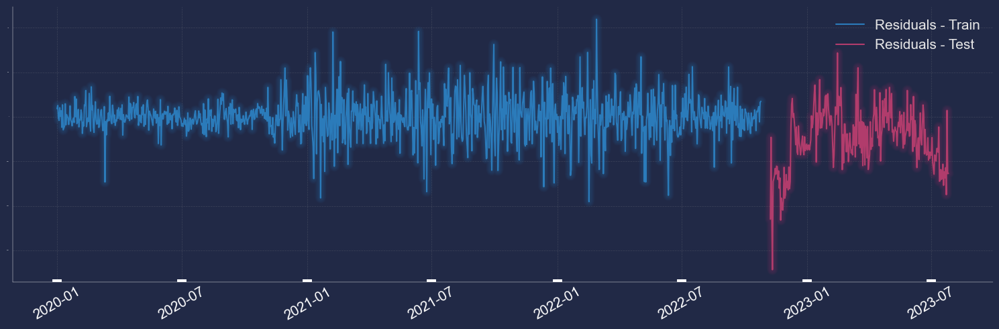

In [12]:
df1 = df.copy()

df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

--- Start Drop_Holidays_Values()
.
.
--- End Drop_Holidays_Values()
--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  163
--- End Correlation()


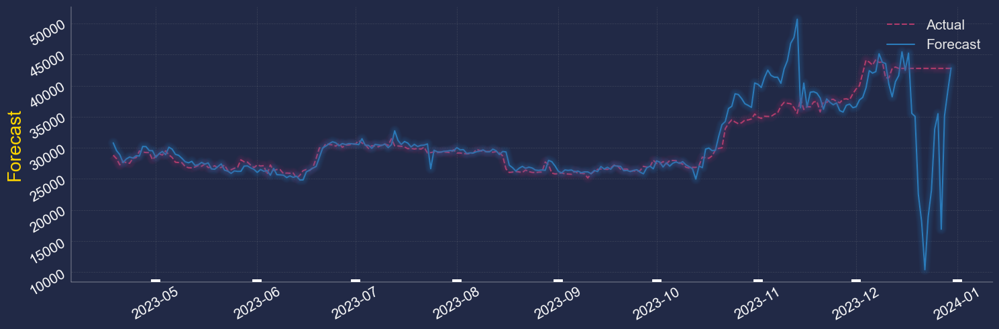

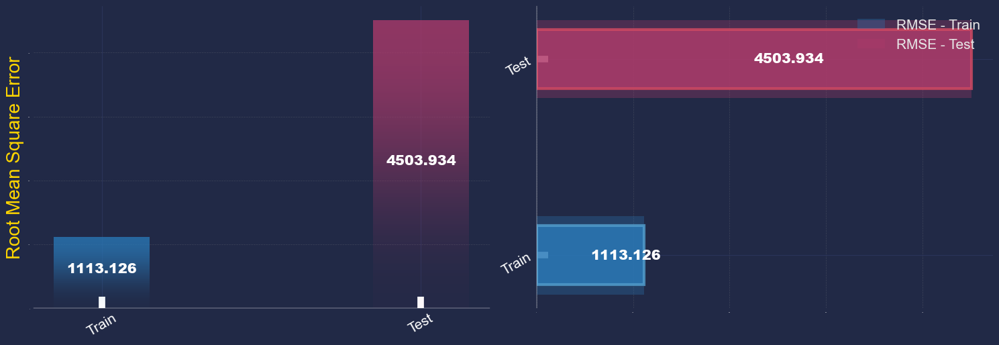

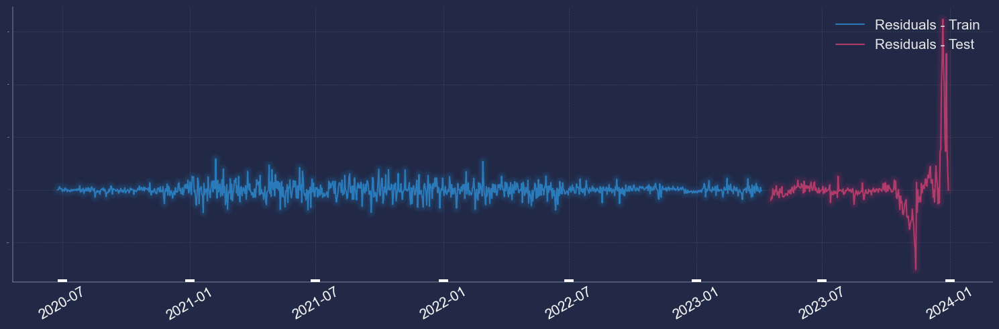

In [14]:
df1 = df.copy()

df1 = Preprocessing.Drop_Holidays_Values(dataframe=df1)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

--- Start Drop_Holidays_Values()
.
.
--- End Drop_Holidays_Values()
--- Start Forward_Fill_Data()
.
.
--- End Forward_Fill_Data()

--- Start Backrward_Fill_Data()
.
.
--- End Backrward_Fill_Data()

--- Start Select_Target()
.
Target:  BTCBUSD_Close 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.8  -  0.8 )
Length of Dataframe is:  338
--- End Correlation()


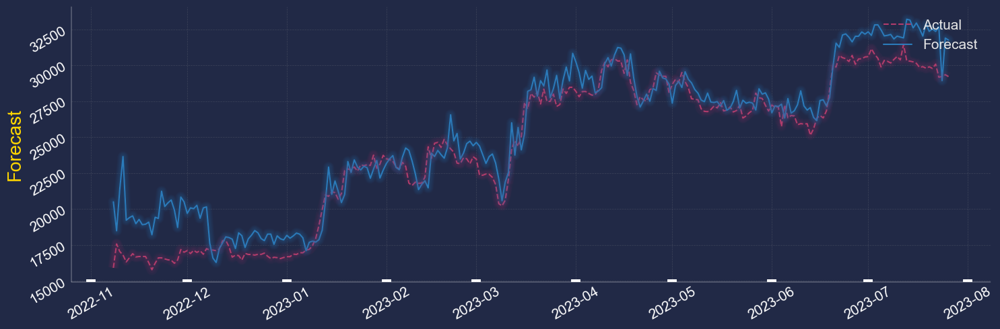

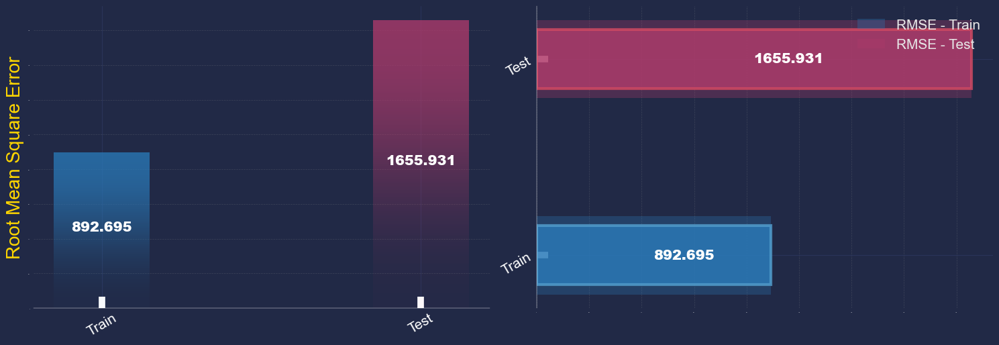

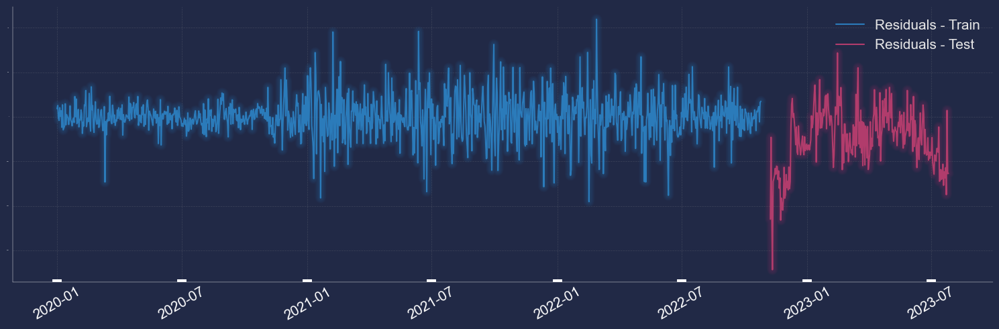

In [15]:
df1 = df.copy()

df1 = Preprocessing.Drop_Holidays_Values(dataframe=df1)
df1 = Preprocessing.Forward_Fill_Data(dataframe=df)
df1 = Preprocessing.Backrward_Fill_Data(dataframe=df)
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Close', number=0.8)

Plots.Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)


---

In [54]:
def Recursive_Forecast_Plot_Split(dataframe, model):
    '''
    This function visualize 3 plots with Recursive Forecast method
    1) Actual and Forecast Price
    2) The Metric of Forecast (RMSE)
    3) The Residuals of Forecast
    ------------------------------
    Parameter(dataframe): DataFrame
    Parameter(model): A Model (With parameters or not)
    ------------------------------
    '''
    
    try:
        prediction = [] #Create a list value
    
        X = dataframe.iloc[:, 1:]
        y = dataframe.iloc[:, 0]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False) #80% X_train - 20% X_test
    
        Xtrain = X_train.copy()
        Xtest = X_test.copy()
        ytrain = y_train.copy()
        ytest = y_test.copy()

        model_train_predict = model.fit(Xtrain, ytrain) #Fit the model

        #------------ Plot 1,4 ------------#
        index = y_train.index.copy()
        index = pd.to_datetime(index) #y_test index
        
        forecast_index = y_test.index.copy()
        forecast_index = pd.to_datetime(forecast_index) #y_test index
        #------------ Plot 1,4 ------------#
        #print(len(index))
        #print(len(model_train_predict))
        #print(model_train_predict)
        #------------ Drop the Xtest rows and Fit again the Xtrain ------------#
        while len(Xtest) > 0:    
            if len(Xtest) >= 30:
            
                model.fit(Xtrain, ytrain) #Fit the model
                forecast = model.predict(Xtest.iloc[0:30]).tolist() #Predict the days
                prediction = prediction + forecast #Insert the forecast values in prediction
        
                Xtrain = pd.concat([Xtrain, Xtest.iloc[0:30]]) #Insert values from second dataframe to first
                ytrain = pd.concat([ytrain, ytest.iloc[0:30]]) #Insert values from second dataframe to first
        
                Xtest.drop(Xtest.index[range(30)], inplace=True) #Drop Rows
                ytest.drop(ytest.index[range(30)], inplace=True) #Drop Rows

            else:
                forecast = model.predict(Xtest).tolist() #Predict the days
                prediction = prediction + forecast #Insert the forecast values in prediction
                break;
    #------------ Drop the Xtest rows and Fit again the Xtrain ------------#
    
    #print('X_train: ', X_train.shape, '\nXtrain: ', Xtrain.shape, '\n\n',
    #      'y_train: ', y_train.shape, '\nytrain: ', ytrain.shape)
    #print()
    #print('X_test: ', X_test.shape, '\nXtest: ', Xtest.shape, '\n\n',
    #      'y_test: ', y_test.shape, '\nytest: ', ytest.shape)
    #print()
    #print('Prediction: ', len(prediction))
    
        plt.style.use("cyberpunk") #Background color
        pal_red = sns.color_palette("flare") #Color
        pal_blue = sns.color_palette("Blues") #Color
    
#------------------------------------------------------------------------------------------------------------------------------#
    
        #------------ Plot 1 ------------#
        fig, ax1 = plt.subplots(figsize=(15,5), tight_layout=True) #Size of plot dpi=300 for better quality

        ax1.plot(index, y_train, label='AAA', color=pal_red[0])
        #ax1.plot(index, model_train_predict, color=pal_blue[0])

        ax1.plot(forecast_index, y_test, ls='--', label='OOO', color=pal_red[3])
        ax1.plot(forecast_index, prediction, label='III', color=pal_blue[4])

        plt.ylabel('Forecast', fontsize=20, color='Gold') #Bottom title
        #plt.legend(['Actual','Forecast'], loc="upper right", fontsize=15) #Label - Size of plot
        plt.tick_params(axis='x', labelrotation=30, labelsize=15, width=10, length=3,  direction="in", colors='White') #Rotation label x and y
        plt.tick_params(axis='y', labelrotation=30, labelsize=15, colors='White') #Rotation label x and y
        plt.grid(zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot

        mplcp.make_lines_glow()
        #mplcp.make_lines_glow(alpha_line=0.5, n_glow_lines=10,  diff_linewidth=1.05) #Glow - Effect lines

        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        ax1.spines['left'].set_color('White')
        ax1.spines['left'].set_linewidth(0.3)
        ax1.spines['bottom'].set_color('White')
        ax1.spines['bottom'].set_linewidth(0.3)
        plt.show()
        #------------ Plot 1 ------------#
    
#------------------------------------------------------------------------------------------------------------------------------#



#------------------------------------------------------------------------------------------------------------------------------#
    
        #------------ Plot 2,3 ------------#
        metric_train = model.predict(X=Xtrain).tolist()
    
        Train_MSE = mean_squared_error(ytrain, metric_train)
        Train_RMSE = math.sqrt(Train_MSE)
        Train_RMSE = round(Train_RMSE,3)
        
        Test_MSE = mean_squared_error(y_test, prediction)
        Test_RMSE = math.sqrt(Test_MSE)
        Test_RMSE = round(Test_RMSE,3)

        Metric_data = pd.DataFrame(data={'Train' : [Train_RMSE],
                                         'Test' : [Test_RMSE]})
        #Metric_data.astype(float)
    
        fig = gridspec.GridSpec(3, 2)
        pl.figure(figsize=(15, 15), tight_layout=True)

        ax2 = pl.subplot(fig[0, 0])
        plt.ylabel('Root Mean Square Error', fontsize=20, color='Gold') #Bottom title
    
        bar1 = ax2.bar(Metric_data.columns[0], Metric_data['Train'], width=0.3, linewidth=3, alpha=0.8, bottom=0, edgecolor=pal_blue[3], color=pal_blue[4])
        bar2 = ax2.bar(Metric_data.columns[1], Metric_data['Test'], width=0.3, linewidth=3, alpha=0.8, bottom=0, edgecolor=pal_red[2], color=pal_red[3])
    
        ax2.tick_params(axis='x', width=7, length=12, labelrotation=30, labelsize=15, bottom=True, direction="in", colors='White') #White
        ax2.tick_params(axis='y', labelsize=0) #White
        #ax2.tick_params(axis='y', labelsize=0) #Rotation label x and y
        #ax2.tick_params(axis='y', labelrotation=30, labelsize=15, left=False, colors='White') #White
        ax2.tick_params(axis='x', width=7, length=12, labelrotation=30, labelsize=15, bottom=True, direction="in", left=False, colors='White') #White
        ax2.grid(axis='y', zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot

        ax2.text(x=Metric_data.Train.name, y=Metric_data.Train.sum()/2, s=Metric_data.Train[0], color='White', weight='extra bold', ha='center', fontsize=15) #Text of labels
        ax2.text(x=Metric_data.Test.name, y=Metric_data.Test.sum()/2, s=Metric_data.Test[0], color='White', weight='extra bold', ha='center', fontsize=15) #Text of labels

        mplcp.add_bar_gradient(bars=bar1)
        mplcp.add_bar_gradient(bars=bar2)
    
        ax2.spines['top'].set_visible(False)
        ax2.spines['right'].set_visible(False)
        ax2.spines['left'].set_visible(False)
        ax2.spines['bottom'].set_color('White')
        ax2.spines['bottom'].set_linewidth(0.3)



        ax3 = pl.subplot(fig[0, 1])
        
        ax3.barh(Metric_data.columns[0], Metric_data['Train']+0.1, height=0.4, linewidth=3, alpha=0.3, left=0, color=pal_blue[4])
        ax3.barh(Metric_data.columns[1], Metric_data['Test']+0.1, height=0.4, linewidth=3, alpha=0.3, left=0, color=pal_red[3])
    
        ax3.barh(Metric_data.columns[0], Metric_data['Train'], height=0.3, linewidth=3, alpha=0.8, left=0, edgecolor=pal_blue[3], color=pal_blue[4])
        ax3.barh(Metric_data.columns[1], Metric_data['Test'], height=0.3, linewidth=3, alpha=0.8, left=0, edgecolor=pal_red[2], color=pal_red[3])
    
        ax3.legend(['RMSE - Train','RMSE - Test'], loc="upper right", fontsize=15) #Label - Size of plot
        ax3.tick_params(axis='y', width=7, length=12, labelrotation=30, labelsize=15, left=True, bottom=False, direction="in", colors='White')
        ax3.tick_params(axis='x', labelsize=0) #Rotation label x and y
        ax3.grid(axis='x', zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot
        #ax3.tick_params(axis='x', labelrotation=30, labelsize=15, bottom=False, colors='White')

        ax3.text(x=Metric_data.Train.sum()/2, y=Metric_data.Train.name, s=Metric_data.Train[0], color='White', weight='extra bold', va='center', fontsize=15) #Text of labels
        ax3.text(x=Metric_data.Test.sum()/2, y=Metric_data.Test.name, s=Metric_data.Test[0], color='White', weight='extra bold', va='center', fontsize=15) #Text of labels
    
        ax3.spines['top'].set_visible(False)
        ax3.spines['right'].set_visible(False)
        ax3.spines['bottom'].set_visible(False)
        ax3.spines['left'].set_color('White')
        ax3.spines['left'].set_linewidth(0.3)
        plt.show()
        #------------ Plot 2,3 ------------#
    
#------------------------------------------------------------------------------------------------------------------------------#



#------------------------------------------------------------------------------------------------------------------------------#
    
        length_of_dataframe = int(len(dataframe) * 0.79)

        #------------ Plot 4 ------------#
        Residuals_Train = ytrain - metric_train
        Residuals_Test = y_test - prediction
    
        Residuals_data_train = pd.DataFrame(data={'Residuals_Train' : Residuals_Train})
        Residuals_data_test = pd.DataFrame(data={'Residuals_Test' : Residuals_Test})

        residuals_index_train = Residuals_data_train.index.copy()
        residuals_index_train = pd.to_datetime(residuals_index_train) #Residuals intex train
    
        fig, ax4 = plt.subplots(figsize=(15,5), tight_layout=True) #Size of plot dpi=300 for better quality

        ax4.plot(residuals_index_train[0:length_of_dataframe], Residuals_data_train.Residuals_Train[0:length_of_dataframe], color=pal_blue[4])
        ax4.plot(forecast_index, Residuals_data_test.Residuals_Test.values, color=pal_red[3])
        ax4.legend(['Residuals - Train','Residuals - Test'], loc="upper right", fontsize=15) #Label - Size of plot

        ax4.tick_params(axis='x', labelrotation=30, labelsize=15, width=10, length=3, direction="in", colors='White') #Rotation label x and y
        ax4.tick_params(axis='y', labelsize=0) #White
        #ax4.tick_params(axis='y', labelrotation=30, labelsize=15, colors='White') #Rotation label x and y
        ax4.grid(zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot
    
        mplcp.make_lines_glow()

        ax4.spines['top'].set_visible(False)
        ax4.spines['right'].set_visible(False)
        ax4.spines['left'].set_color('White')
        ax4.spines['left'].set_linewidth(0.3)
        ax4.spines['bottom'].set_color('White')
        ax4.spines['bottom'].set_linewidth(0.3)
        plt.show()
        #------------ Plot 4 ------------#
    except:
        print('No option!\nError')

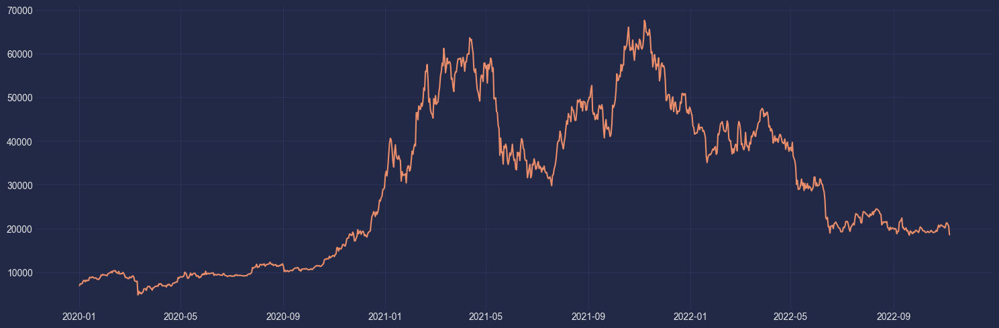

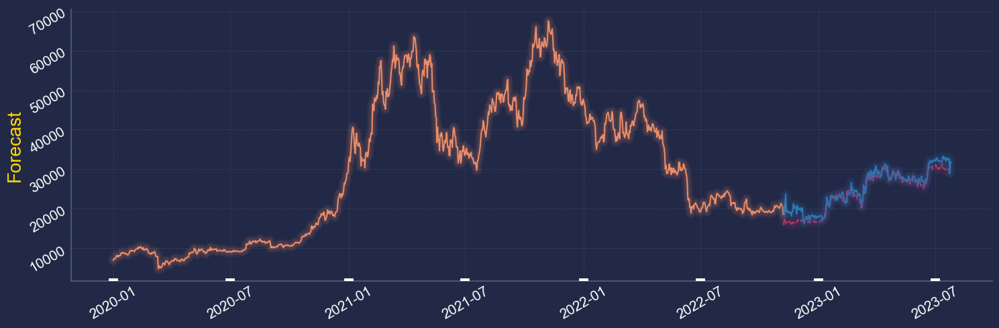

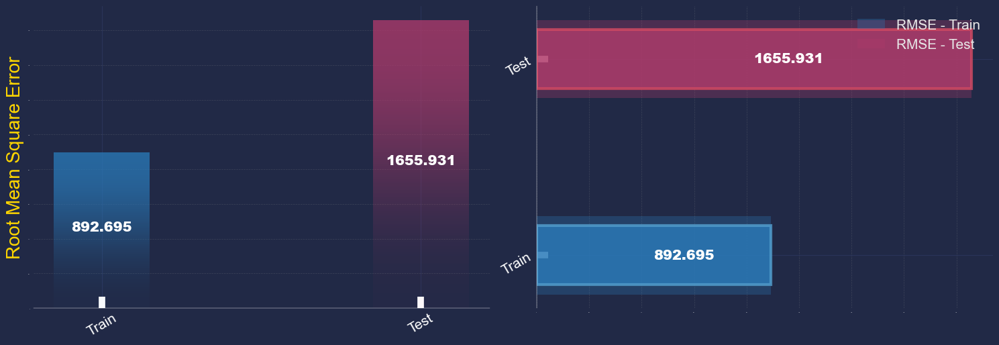

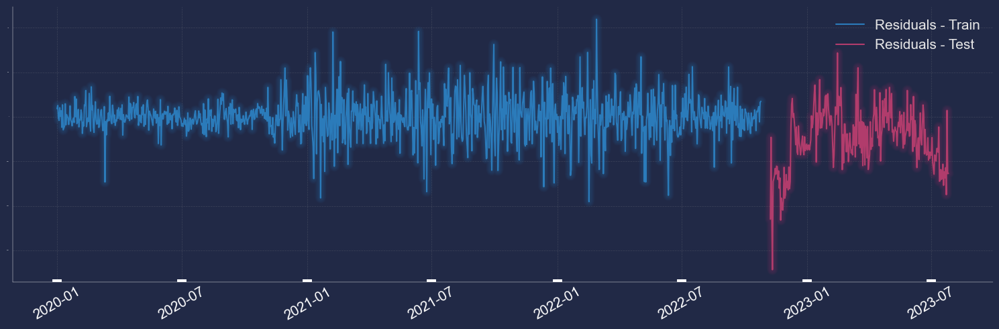

In [55]:
Recursive_Forecast_Plot_Split(dataframe=df1, model=lr)

In [70]:
df1 = df.copy()

df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCUAH_Open')
#df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Open')
#df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Close')

X = df1.iloc[:, 1:]
Y = df1.iloc[:, 0]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, shuffle=False)  # 80% X_train - 20% X_test

--- Start Select_Target()
.
Target:  BTCUAH_Open 
.
--- End Select_Target()



In [71]:
lr.fit(X_train,y_train)
lr_pred = lr.predict(X_test)

In [72]:
data = pd.DataFrame(y_test)
data['Forecast'] = lr_pred
data

,Target_BTCUAH_Open,Forecast
Open time,,
2022-06-16,722491.0,7.148552e+05
2022-06-17,728311.0,7.207733e+05
2022-06-18,672338.0,6.861070e+05
2022-06-19,725340.0,7.399991e+05
2022-06-20,721212.0,7.304581e+05
...,...,...
2023-07-22,1149107.0,1.149544e+06
2023-07-23,1157905.0,1.151250e+06
2023-07-24,1122637.0,1.138132e+06


<Figure size 1600x800 with 0 Axes>

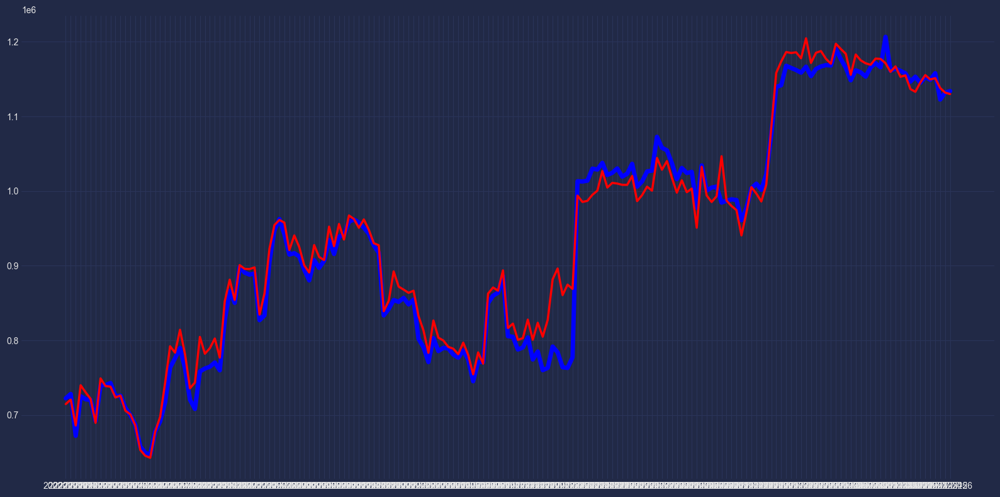

In [74]:
plt.figure(figsize=(16, 8),  tight_layout=True)

plt.plot(data.index, data['Target_BTCUAH_Open'], linewidth=5, color='Blue')
plt.plot(data.index, data['Forecast'], linewidth=2.5, color='Red')

plt.show()

In [75]:
df1

,Target_BTCUAH_Open,ETHBTC_Open,ETHBTC_High,ETHBTC_Low,ETHBTC_Close,LTCBTC_Open,LTCBTC_High,LTCBTC_Low,LTCBTC_Close,BNBBTC_Open,...,DGBBTC_Low,DGBBTC_Close,BTCUAH_Open,BTCUAH_High,BTCUAH_Low,BTCUAH_Close,USDTUAH_Open,USDTUAH_High,USDTUAH_Low,USDTUAH_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-06-24,245427.0,0.025264,0.025820,0.025041,0.025233,0.004591,0.004624,0.004545,0.004585,0.001703,...,1.970000e-06,2.030000e-06,256746.0,256746.0,24999.0,247024.0,26.660,26.660,5.500,26.553
2020-06-25,245755.0,0.025233,0.025347,0.025087,0.025136,0.004585,0.004643,0.004554,0.004580,0.001721,...,2.000000e-06,2.080000e-06,245427.0,250410.0,241900.0,246098.0,26.596,26.738,26.510,26.698
2020-06-26,241593.0,0.025137,0.025222,0.025019,0.025065,0.004581,0.004730,0.004544,0.004702,0.001720,...,2.000000e-06,2.040000e-06,245755.0,246265.0,239439.0,243325.0,26.700,26.709,26.355,26.665
2020-06-27,239205.0,0.025062,0.025162,0.024158,0.024516,0.004704,0.004713,0.004418,0.004556,0.001721,...,1.920000e-06,2.000000e-06,241593.0,244469.0,237674.0,240156.0,26.400,26.661,26.400,26.661
2020-06-28,241099.0,0.024514,0.024822,0.024400,0.024670,0.004556,0.004592,0.004517,0.004536,0.001679,...,1.950000e-06,2.190000e-06,239205.0,244274.0,237488.0,242707.0,26.531,26.670,26.402,26.600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-22,1149107.0,0.063250,0.063400,0.062410,0.062650,0.003147,0.003218,0.003081,0.003092,0.008149,...,2.600000e-07,2.700000e-07,1152924.0,1155884.0,1144592.0,1147275.0,38.510,38.590,38.410,38.540
2023-07-23,1157905.0,0.062640,0.062930,0.062500,0.062790,0.003091,0.003109,0.003078,0.003098,0.008092,...,2.600000e-07,2.700000e-07,1149107.0,1167311.0,1148323.0,1158207.0,38.540,38.550,38.430,38.540
2023-07-24,1122637.0,0.062790,0.063580,0.062720,0.063400,0.003097,0.003128,0.003015,0.003056,0.008058,...,2.600000e-07,2.700000e-07,1157905.0,1159064.0,1116753.0,1127294.0,38.530,38.840,38.440,38.650


In [10]:
df1 = df.copy()
df1 = Preprocessing.Select_Target(dataframe=df1, column_name='BTCBUSD_Open')
df1 = Preprocessing.Correlation(dataframe=df1, column_target='Target_BTCBUSD_Open', number=0.9)

--- Start Select_Target()
.
Target:  BTCBUSD_Open 
.
--- End Select_Target()

--- Start Correlation()
.
.
Correlation between:  ( -0.9  -  0.9 )
Length of Dataframe is:  37
--- End Correlation()


In [7]:
df1 = df.iloc[:,0:20].copy()

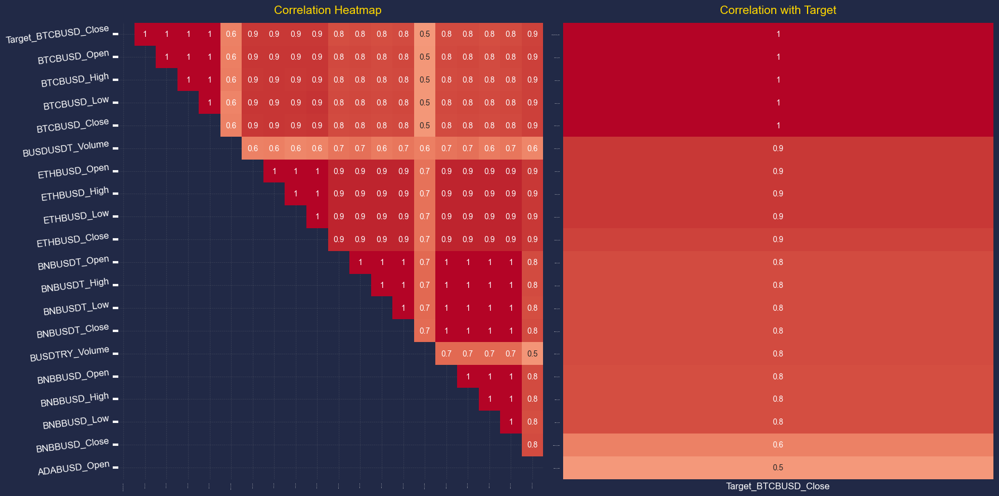

In [8]:
Plots.Plot_Of_Matrix_Correlation(dataframe=df1)

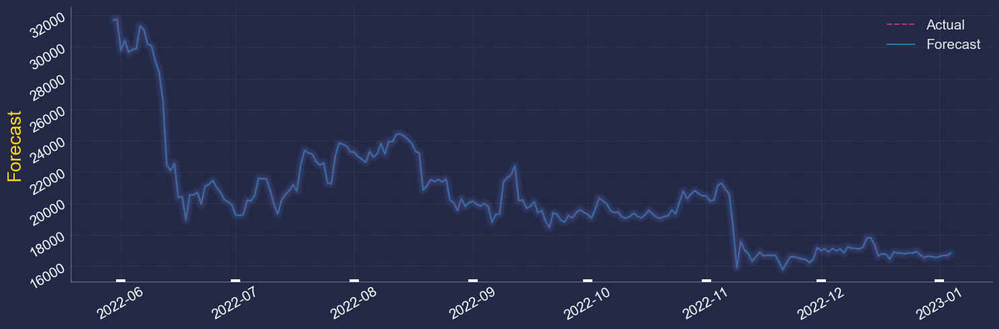

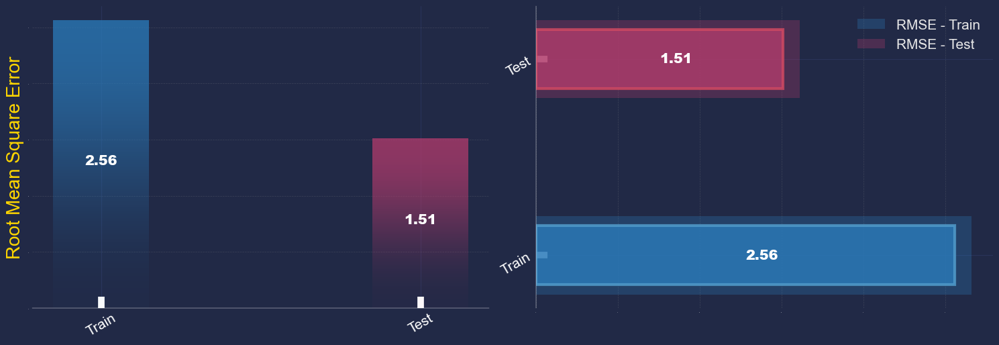

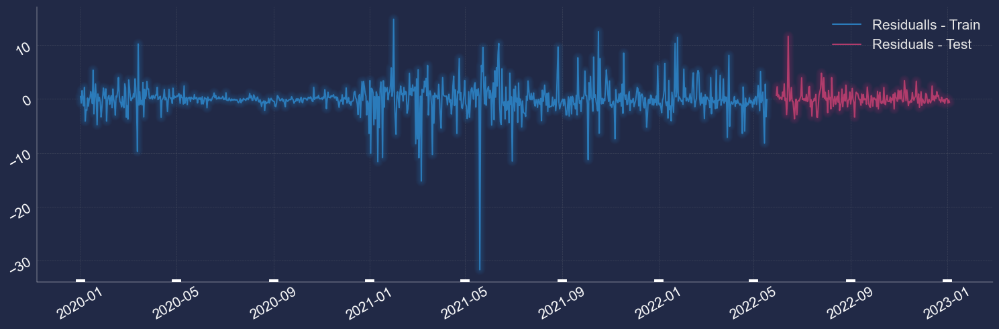

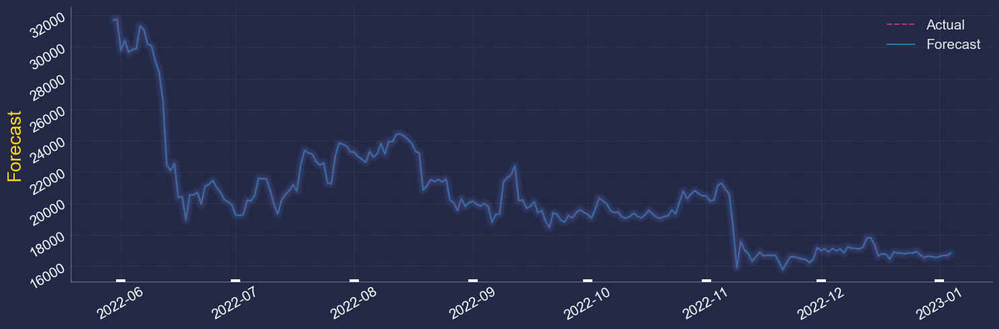

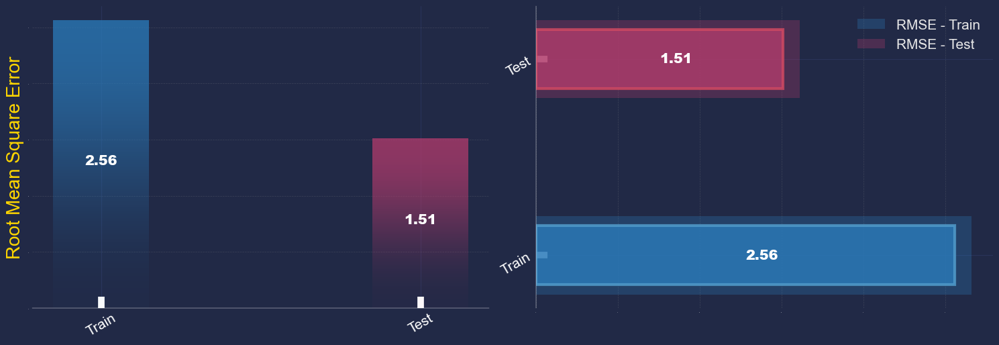

...

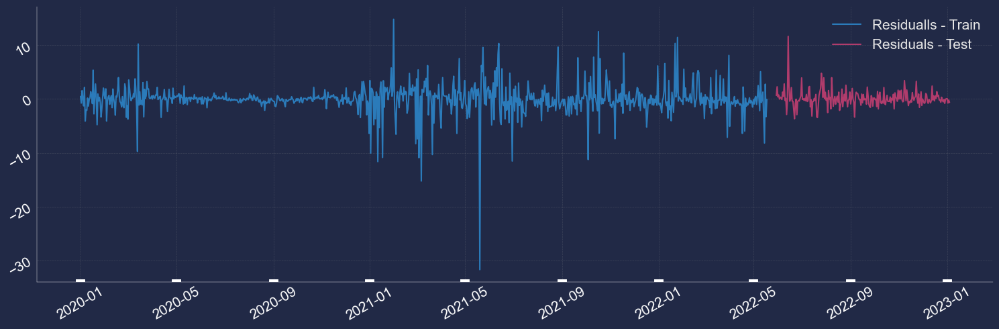

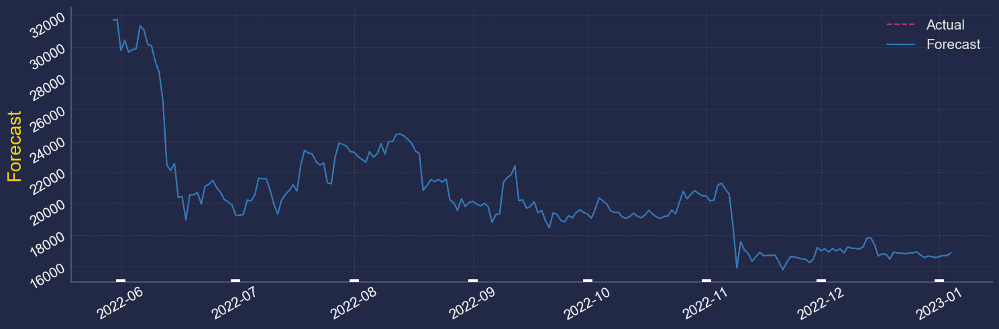

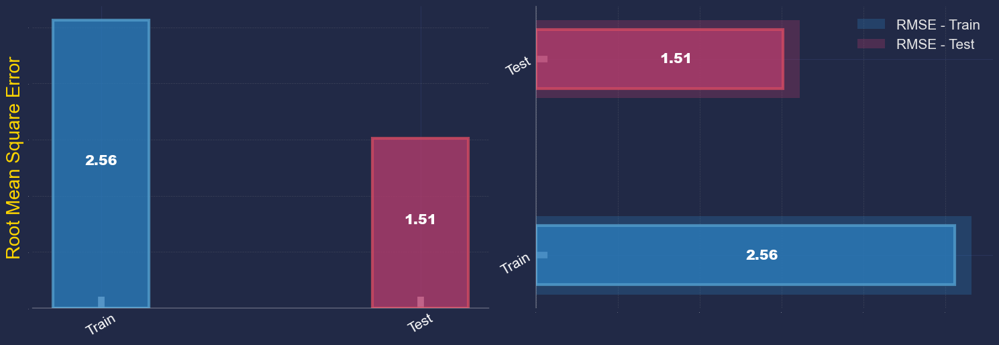

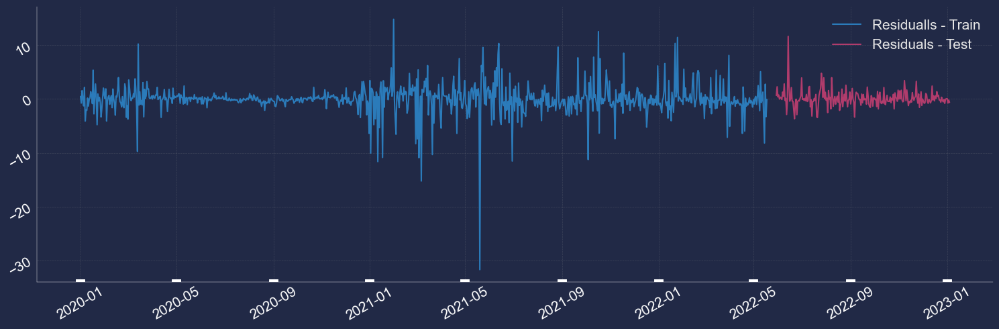

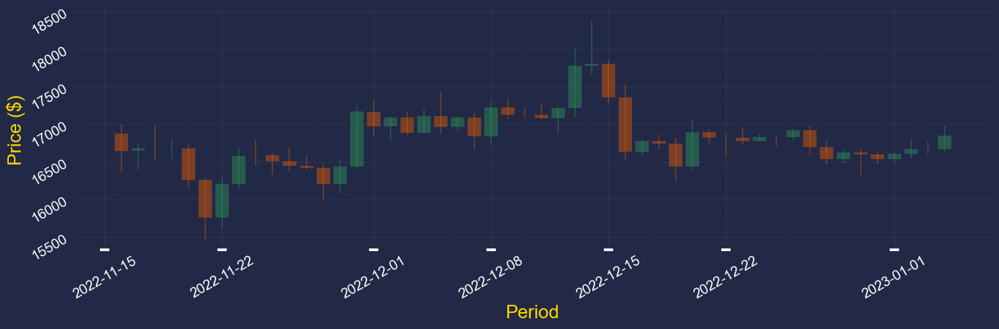

In [20]:
table = df[-50:].copy() 

green_df = table[table.BTCBUSD_Close > table.BTCBUSD_Open].copy()
green_df['Heigth'] = green_df['BTCBUSD_Close'] - green_df['BTCBUSD_Open']

red_df = table[table.BTCBUSD_Close < table.BTCBUSD_Open].copy()
red_df['Heigth'] = red_df['BTCBUSD_Open'] - red_df['BTCBUSD_Close']

pal_green = sns.light_palette("seagreen") #Color
pal_orangered = sns.color_palette("YlOrBr") #Color

plt.style.use("cyberpunk") #Background color

fig = plt.figure(figsize=(15,5), tight_layout=True) #Size of plot dpi=300 for better quality

index = table.index.copy()
index = pd.to_datetime(index)

for i in range(len(table)):
    if table['BTCBUSD_Close'][i] > table['BTCBUSD_Open'][i]:
        plt.vlines(x=index[i], ymin=table['BTCBUSD_Low'][i], ymax=table['BTCBUSD_High'][i], alpha=0.4, colors=pal_green[5])
    elif table['BTCBUSD_Close'][i] < table['BTCBUSD_Open'][i]:
        plt.vlines(x=index[i], ymin=table['BTCBUSD_Low'][i], ymax=table['BTCBUSD_High'][i], alpha=0.4, colors=pal_orangered[4])
    else:
        plt.vlines(x=index[i], ymin=table['BTCBUSD_Low'][i], ymax=table['BTCBUSD_High'][i], alpha=0.4, colors='White')
            

plt.bar(x=green_df.index, height=green_df['Heigth'], bottom=green_df['BTCBUSD_Open'], alpha=0.5, color=pal_green[5]) #color=pal_green[5] , linewidth=2 , fill=False
plt.bar(x=red_df.index, height=red_df['Heigth'], bottom=red_df['BTCBUSD_Close'], alpha=0.5, color=pal_orangered[4]) #color=pal_orangered[4] , linewidth=2 , fill=False

plt.tick_params(axis='x', labelrotation=30, labelsize=15, width=10, length=3, direction="in", colors='White') #Rotation label x and y
plt.tick_params(axis='y', labelrotation=30, labelsize=15, colors='White') #Rotation label x and y
plt.grid(zorder=1, alpha=0.2, linestyle='--', linewidth=0.5, color='darkgrey') #Grid of plot
plt.xlabel('Period', fontsize=20, color='Gold') #Left title
plt.ylabel('Price ($)', fontsize=20, color='Gold') #Bottom title
#plt.yticks(range(15500,20000,500), ["{} $".format(v) for v in range(15500,20000,500)])

plt.show()

In [12]:
df

,Target_BTCBUSD_Open,BTCBUSD_Open,BTCBUSD_High,BTCBUSD_Low,BTCBUSD_Close,BUSDUSDT_Volume,ETHBUSD_Open,ETHBUSD_High,ETHBUSD_Low,ETHBUSD_Close,...,BCHBUSD_Low,BCHBUSD_Close,XLMBUSD_Open,XLMBUSD_High,XLMBUSD_Low,XLMBUSD_Close,QTUMBUSD_Open,QTUMBUSD_High,QTUMBUSD_Low,QTUMBUSD_Close
Open time,,,,,,,,,,,,,,,,,,,,,
2020-01-01,7177.13,7169.12,7231.86,7151.58,7176.58,5.984141e+05,128.54,132.51,128.43,130.35,...,202.63,203.65,0.04471,0.04548,0.04471,0.04522,1.604,1.620,1.591,1.593
2020-01-02,6944.41,7177.13,7185.03,6900.00,6945.33,1.795818e+06,129.88,129.88,126.01,126.87,...,192.41,195.44,0.04516,0.04516,0.04341,0.04343,1.594,1.597,1.528,1.530
2020-01-03,7330.91,6944.41,7393.50,6853.79,7329.20,3.498114e+06,127.02,134.63,125.70,133.75,...,192.22,221.76,0.04347,0.04557,0.04317,0.04551,1.530,1.636,1.514,1.624
2020-01-04,7346.20,7330.91,7388.00,7263.55,7346.20,2.473634e+06,134.20,135.52,132.38,134.17,...,219.37,224.18,0.04529,0.04572,0.04510,0.04550,1.620,1.641,1.601,1.640
2020-01-05,7349.84,7346.20,7486.66,7315.00,7351.42,2.647992e+06,134.26,137.99,134.26,134.99,...,221.05,222.62,0.04549,0.04605,0.04525,0.04525,1.646,1.673,1.621,1.629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31,16534.83,16600.77,16637.66,16462.51,16534.86,2.546708e+08,1199.43,1207.84,1191.08,1195.67,...,96.50,97.10,0.07240,0.07240,0.07080,0.07110,1.833,1.850,1.828,1.831
2023-01-01,16610.69,16534.83,16619.00,16490.74,16610.68,2.362445e+08,1195.67,1204.00,1190.22,1199.99,...,96.10,96.70,0.07100,0.07270,0.07060,0.07250,1.833,1.882,1.821,1.877
2023-01-02,16667.39,16610.69,16793.83,16541.73,16667.55,3.497910e+08,1199.99,1224.00,1192.73,1213.61,...,95.40,99.30,0.07250,0.07440,0.07090,0.07380,1.879,1.928,1.844,1.907


In [8]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

from sklearn.model_selection import train_test_split

X = df.iloc[:, 1:]
y = df.iloc[:, 0]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

In [9]:
model = Sequential([Dense(4, activation='relu'),
                    Dense(2, activation='relu'),
                    Dense(4, activation='relu'),
                    Dense(1)])

model.compile(optimizer='rmsprop', loss='mse')

In [50]:
model.fit(x=X_train, y=y_train,
          validation_data=(X_test,y_test),
          epochs=300)

Epoch 1/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 56651380.0000 - val_loss: 59768184.0000
Epoch 2/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 31179722.0000 - val_loss: 78848576.0000
Epoch 3/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37817308.0000 - val_loss: 81255704.0000
Epoch 4/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37360680.0000 - val_loss: 92177632.0000
Epoch 5/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 39617316.0000 - val_loss: 90628672.0000
Epoch 6/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37582000.0000 - val_loss: 98988096.0000
Epoch 7/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 39110944.0000 - val_loss: 98096576.0000
Epoch 8/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37698088.0000 - val_loss: 104547888.0000
Epoch 9/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 38752220.0000 - val_loss: 104978152.0000
Epoch 10/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37736484.0000 - val_loss: 110758632.0000
Epoch 

Epoch 62/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37442536.0000 - val_loss: 266822240.0000
Epoch 63/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37439724.0000 - val_loss: 266737056.0000
Epoch 64/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37430652.0000 - val_loss: 266670736.0000
Epoch 65/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37427220.0000 - val_loss: 266587248.0000
Epoch 66/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37418764.0000 - val_loss: 266519600.0000
Epoch 67/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37414800.0000 - val_loss: 266437680.0000
Epoch 68/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37406808.0000 - val_loss: 266367728.0000
Epoch 69/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37402488.0000 - val_loss: 266287584.0000
Epoch 70/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37394824.0000 - val_loss: 266217552.0000
Epoch 71/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37390156.0000 - val_loss: 26613

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36732104.0000 - val_loss: 257730080.0000
Epoch 183/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36726192.0000 - val_loss: 257654864.0000
Epoch 184/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36720604.0000 - val_loss: 257578304.0000
Epoch 185/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36714624.0000 - val_loss: 257502576.0000
Epoch 186/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36709068.0000 - val_loss: 257426016.0000
Epoch 187/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36703132.0000 - val_loss: 257350496.0000
Epoch 188/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36697536.0000 - val_loss: 257273808.0000
Epoch 189/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36691644.0000 - val_loss: 257197728.0000
Epoch 190/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36686012.0000 - val_loss: 257121168.0000
Epoch 191/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36680220.0000 - val_loss: 257045408

<AxesSubplot:>

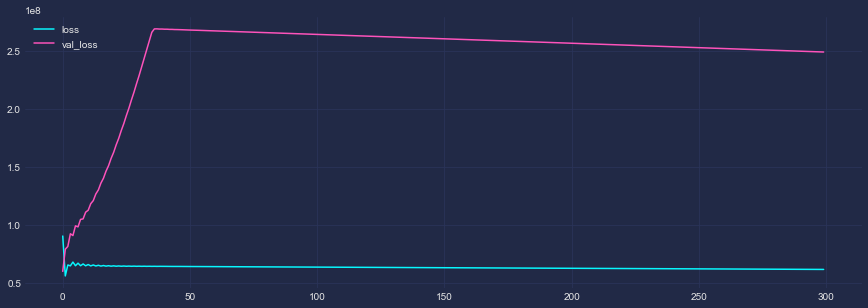

In [51]:
loss_df_mse = pd.DataFrame(model.history.history)

plt.style.use("cyberpunk") #Background color
loss_df_mse.plot(figsize=(15,5))

In [52]:
predict_tr = model.predict(X_train)
dataframe_act_tr = pd.DataFrame(y_train, index=y_train.index)
dataframe_pred_tr = pd.DataFrame(predict_tr, columns=['Predict'], index=y_train.index)

predict = model.predict(X_test)
dataframe_act = pd.DataFrame(y_test, index=y_test.index)
dataframe_pred = pd.DataFrame(predict, columns=['Predict'], index=y_test.index)

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step


--- Start Extract Data
.
.
.
--- End Extract Data


In [9]:
S_CSV.Save_CSV_File(dataframe=df, name_of_csv='Binance_Data_Crypto')

In [1]:


class Myself:
    """
    A class to represent a pearson. (Actually just for me)
    """
    def __init__(self):
        self.name = "Angelos - Michail Voudouris"
        self.pronouns = "he/him"
        self.role = "Data Scientist"
        self.bsc_studies = ("B.Sc in Department of Informatics, University of Western Macedonia")
        self.msc_studies = ("MSc in Data Science at International Hellenic University of Thessaloniki")
        self.language_spoken = ["el_GR", "en_US"]
        self.country = "Hellenic"
        self.city = "Thessaloniki"
        self.soft_values = ["Communication | Problem-Solving | Collaboration | Critical Thinking"]

    def hi_all(self):
        print("Hope you find some of my work interesting. I'll be happy to connect with you!")


me = Myself()
me.hi_all()

Hope you find some of my work interesting. I'll be happy to connect with you!
